<a href="https://colab.research.google.com/github/rbarkerclarke/HARTDA/blob/main/HARTDA_WISDM2025_ReproduceModels.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Example model:


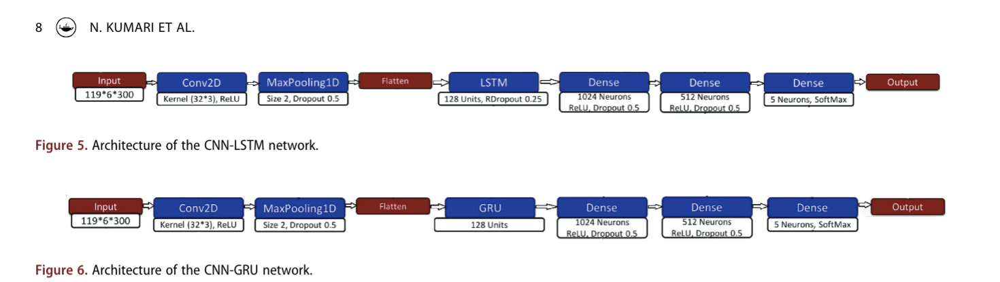

## Model 1 - No TDA

Reproducing Xi, 2020 CNN-LSTM

In [ ]:
from backcall import callback_prototype
from numpy.random import shuffle
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.utils import class_weight
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Conv1D, Bidirectional
from tensorflow.keras.layers import GlobalAveragePooling1D, MaxPool1D, Reshape, Conv2D, MaxPool2D
from tensorflow.keras.layers import BatchNormalization, AvgPool1D, Flatten, GRU, GlobalAveragePooling2D
from tensorflow.keras.regularizers import L2
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
import numpy as np
import tensorflow as tf
import tarfile
import datetime
import logging

# Disable logging for training
logging.getLogger('tensorflow').setLevel(logging.ERROR)

# Enable XLA GPU optimizations
tf.config.optimizer.set_jit(True)

# Mixed precision (if GPU supports it)
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

# Connect drive
from google.colab import drive
drive.mount('/content/drive')

# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(message)s')
logger = logging.getLogger()

# Suppress TensorFlow GPU warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Enable memory growth for the GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        logger.error(f"GPU error: {e}")

logger.info("Starting data preprocessing...")
print("Starting data preprocessing...")

# Define the path to the main dataset file
data_file = os.path.join('/content/drive/MyDrive/','WISDM_Data/WISDM_ar_v1.1_raw_clean.csv')


# Load the dataset, skipping bad lines
logger.info("Loading dataset...")
column_names = ['user', 'activity', 'timestamp', 'x', 'y', 'z']
wisdm_data = pd.read_csv(data_file, header=0, on_bad_lines="warn")
#wisdm_data = df_final
print(f"Initial dataset shape: {wisdm_data.shape}")

# Data Cleaning
# Convert all values to strings
wisdm_data['x'] = wisdm_data['x'].astype(str)
wisdm_data['y'] = wisdm_data['y'].astype(str)
wisdm_data['z'] = wisdm_data['z'].astype(str)

# Remove non-numeric characters
wisdm_data['x'] = wisdm_data['x'].str.replace(';', '', regex=False)
wisdm_data['y'] = wisdm_data['y'].str.replace(';', '', regex=False)
wisdm_data['z'] = wisdm_data['z'].str.replace(';', '', regex=False)

# Linear interpolation of missing x, y z values
wisdm_data['x'] = wisdm_data['x'].astype(float)
wisdm_data['y']= wisdm_data['y'].astype(float)
wisdm_data['z'] = wisdm_data['z'].astype(float)

# Convert columns back to numeric
wisdm_data['x'] = pd.to_numeric(wisdm_data['x'])
wisdm_data['y'] = pd.to_numeric(wisdm_data['y'])
wisdm_data['z'] = pd.to_numeric(wisdm_data['z'])

# Handle missing values
print(wisdm_data.shape)
wisdm_data = wisdm_data.dropna()
print(wisdm_data.shape)

logger.info(f"Dataset shape after cleaning: {wisdm_data.shape}")


# Calculate magnitude
#wisdm_data['magnitude'] = np.sqrt(wisdm_data['x']**2 + wisdm_data['y']**2 + wisdm_data['z']**2)

# Handle NaN and infinite values
wisdm_data = wisdm_data.replace([np.inf, -np.inf], np.nan).fillna(method='ffill').fillna(method='bfill')

# Map activity labels to integers
activity_mapping = {label: idx for idx, label in enumerate(wisdm_data['activity'].unique())}
wisdm_data['activity'] = wisdm_data['activity'].map(activity_mapping)

# Reverse mapping for later use
reverse_activity_mapping = {v: k for k, v in activity_mapping.items()}

# Normalize features
logger.info("Normalizing features...")
scaler = StandardScaler()
features = ['x', 'y', 'z']
wisdm_data[features] = scaler.fit_transform(wisdm_data[features])
subset_columns = ['x', 'y', 'z', 'user', 'activity']
wisdm_data = wisdm_data[subset_columns]
# Create sequences
stepratio = 0.5
def create_sequences(data, seq_length, ratio=stepratio):
    step=round(seq_length*ratio)
    sequences = []
    labels = []
    users = []
    for start in range(0, len(data) - seq_length, step):
        sequences.append(data.iloc[start:start + seq_length][features].values)
        labels.append(data.iloc[start + seq_length - 1]['activity'])
        users.append(data.iloc[start + seq_length - 1]['user'])
    return np.array(sequences), np.array(labels), np.array(users)

# Create sequences from the data
sequence_length = 128

# Split the data by participants first
#logger.info("Splitting the data by participants...")
participants = wisdm_data['user'].unique()
#train_participants = participants[0:29]
#test_participants = participants[29:35]

for rnd_num in [227506, 221012, 222466, 224877, 229100]:

    time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    file_start = f'/content/drive/MyDrive/WISDM_Data/{time}'
    model_name = "LSTM" + str(rnd_num)
    random_state_num = rnd_num

    train_participants, test_participants = train_test_split(participants, test_size=0.2, random_state=random_state_num)
    train_data = wisdm_data[wisdm_data['user'].isin(train_participants)]
    test_data = wisdm_data[wisdm_data['user'].isin(test_participants)]

    #X, y = create_sequences(wisdm_data, sequence_length)
    #logger.info(f"Shape of X after sequence creation: {X.shape}")
    #logger.info(f"Shape of y after sequence creation: {y.shape}")

    X_train, y_train_raw, y_train_users = create_sequences(train_data, sequence_length)
    X_test, y_test_raw, y_test_users = create_sequences(test_data, sequence_length)


    # Convert labels to categorical
    y_train = to_categorical(y_train_raw)
    y_test = to_categorical(y_test_raw)


    # Simple LSTM Model definition
    def build_simple_lstm(input_shape, num_classes, drop=0.8):
        model = Sequential()

        # LSTM stack
        model.add(LSTM(32, input_shape=input_shape, return_sequences=True,
                      use_bias=True,
                      unit_forget_bias=True,
                      recurrent_dropout=0.0,  # must be 0 for GPU
                      dropout=0.0             # must be 0 for GPU
    ))
        model.add(LSTM(32, return_sequences=True,
                      recurrent_dropout=0.0,  # must be 0 for GPU
                      dropout=0.0
        ))   #output is (batch, time, 32)
        model.add(Dropout(0.4))
        # Reshape to 4D for CNN
        model.add(Reshape((1, sequence_length, 32)))               # → (batch, 1, time, channels)

        # CNN part (Conv2D instead of Conv1D)
        model.add(Conv2D(64, kernel_size=(1,5), strides=(1,2), activation='relu'))
        model.add(MaxPool2D(pool_size=(1,2), strides=(1,2)))
        model.add(Conv2D(128, kernel_size=(1,3), padding='same', activation='relu'))
        model.add(BatchNormalization())
        model.add(GlobalAveragePooling2D())
        model.add(Dropout(drop))
        model.add(Dense(num_classes, activation='softmax'))
        return model

    def train_and_evaluate_model(model, X_train, y_train, X_test, y_test, model_name="LSTM - Publication Year"):

        # Add Gated Recurrent Unit layer
        #model.add(LSTM(128, return_sequences=True)) # Changed to return_sequences=True
        #model.add(LSTM(16, return_sequences=True))
        # Second Conv1D layer processes the sequences from LSTM
        #model.add(Conv1D(16, kernel_size=3, padding = "same", activation='relu'))
        # Add a pooling layer to convert the 3D output to 2D for the Dense layer

        # Create the CosineDecayRestarts schedule
        lr_schedule_restarts = tf.keras.optimizers.schedules.CosineDecayRestarts(
            initial_learning_rate=0.001,
            first_decay_steps=200000,
            t_mul=5,
            m_mul=0.2,
            alpha=0.005
          )


        # Compile model
        model.compile(optimizer=Adam(learning_rate=lr_schedule_restarts),
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

        # Define callbacks
        reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                    factor=0.2,
                                    patience=10,
                                    min_lr=0.0001)
        early_stopping = EarlyStopping(monitor='val_accuracy',
                                    patience=200,
                                    restore_best_weights=True)

        # Use y_train labels
        #class_weights = class_weight.compute_class_weight(
        #    'balanced',
        #    classes=np.unique(y_train_raw),
        #    y=y_train_raw
        #)

        # Convert to a dictionary mapping class index to weight
        #class_weight_dict = dict(enumerate(class_weights))
        #print(class_weight_dict)

        # Train model
        # include learning rate schedule
        logger.info(f"\nTraining {model_name}...")
        history = model.fit(X_train, y_train,
                            epochs=200,
                            batch_size=192,
                            validation_data=(X_test, y_test),
                            callbacks=[early_stopping],
                            verbose=1, shuffle=True)#,
                            #class_weight = class_weight_dict)


        # Evaluate model
        loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
        y_pred = model.predict(X_test)

        return model, history, accuracy, y_pred

    # Visualization functions
    def plot_training_history(history, model_name="K. Xia, CNN-LSTM 2020"):
        plt.figure(figsize=(15, 5))

        # Plot accuracy
        plt.subplot(1, 2, 1)
        plt.plot(history.history['accuracy'], label='Training Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.title(f'{model_name} - Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()

        # Plot loss
        plt.subplot(1, 2, 2)
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'{model_name} - Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()

        plt.tight_layout()
        plt.savefig(f'{file_start}_training_history_{model_name.lower().replace(" ", "_")}.png')
        plt.close()

    def plot_confusion_matrix(y_true, y_pred, model_name="K. Xia, CNN-LSTM 2020"):
        y_pred_classes = np.argmax(y_pred, axis=1)
        y_true_classes = np.argmax(y_true, axis=1)

        cm = confusion_matrix(y_true_classes, y_pred_classes, normalize="true")
        plt.figure(figsize=(12, 10))
        sns.heatmap(cm, annot=True, fmt='f', cmap='Blues')
        plt.title(f'{model_name} - Confusion Matrix')
        plt.ylabel('True label')
        plt.xlabel('Predicted label')

        # Set x and y tick labels to activity names
        tick_marks = np.arange(len(reverse_activity_mapping))
        plt.xticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
                  rotation=45, ha='right')
        plt.yticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
                  rotation=0)

        plt.tight_layout()
        plt.savefig(f'{file_start}_confusion_matrix_{model_name.lower().replace(" ", "_")}.png')
        plt.close()

        return cm

    def plot_roc_curves(y_test, y_pred, model_name="K. Xia, CNN-LSTM 2020"):
        n_classes = y_test.shape[1]
        fpr = {}
        tpr = {}
        roc_auc = {}

        # Calculate ROC curve and ROC area for each class
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Plot ROC curves
        plt.figure(figsize=(12, 8))
        for i in range(n_classes):
            plt.plot(fpr[i], tpr[i],
                    label=f'{reverse_activity_mapping[i]} (AUC = {roc_auc[i]:.2f})')

        plt.plot([0, 1], [0, 1], 'k--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'{model_name} - ROC Curves')
        plt.legend(loc="lower right")
        plt.tight_layout()
        plt.savefig(f'{file_start}_roc_curves_{model_name.lower().replace(" ", "_")}.png')
        plt.close()

        return roc_auc

    def plot_precision_recall_curves(y_test, y_pred, model_name="K. Xia, CNN-LSTM 2020"):
        n_classes = y_test.shape[1]
        precision = {}
        recall = {}
        pr_auc = {}

        # Calculate precision-recall curve for each class
        for i in range(n_classes):
            precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], y_pred[:, i])
            pr_auc[i] = auc(recall[i], precision[i])

        # Plot precision-recall curves
        plt.figure(figsize=(12, 8))
        for i in range(n_classes):
            plt.plot(recall[i], precision[i],
                    label=f'{reverse_activity_mapping[i]} (AUC = {pr_auc[i]:.2f})')

        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.title(f'{model_name} - Precision-Recall Curves')
        plt.legend(loc="lower left")
        plt.tight_layout()
        plt.savefig(f'{file_start}_precision_recall_curves_{model_name.lower().replace(" ", "_")}.png')
        plt.close()

        return pr_auc

    def save_model_results(model, history, accuracy, cm, roc_auc, pr_auc, model_name="K. Xia, CNN-LSTM 2020"):
        with open(f'{file_start}_{model_name.lower().replace(" ", "_")}_results.txt', 'w') as f:
            # Model summary
            f.write(f"{model_name} Results\n")
            f.write("="*50 + "\n\n")
            model.summary(print_fn=lambda x: f.write(x + '\n'))
            f.write("\n")

            # Random State
            f.write(f"Random State: {random_state_num}\n")
            f.write("\n")

            # Step Ratio
            f.write(f"Ratio: {stepratio}\n")
            f.write("\n")

            # Performance metrics
            f.write("Performance Metrics\n")
            f.write("-"*50 + "\n")
            f.write(f"Test Accuracy: {accuracy*100:.2f}%\n\n")

            # Confusion Matrix
            f.write("Confusion Matrix\n")
            f.write("-"*50 + "\n")
            np.savetxt(f, cm, fmt='%d')
            f.write("\n")

            # Classification Report (Test)
            f.write("Classification Report (Test)\n")
            f.write("-"*50 + "\n")
            y_pred_classes = np.argmax(model.predict(X_test), axis=1)
            y_true_classes = np.argmax(y_test, axis=1)
            report = classification_report(y_true_classes, y_pred_classes)
            f.write(report)
            f.write("\n")

            # ROC AUC scores
            f.write("ROC AUC Scores\n")
            f.write("-"*50 + "\n")
            for i in range(len(roc_auc)):
                f.write(f"{reverse_activity_mapping[i]}: {roc_auc[i]:.4f}\n")
            f.write("\n")

            # PR AUC scores
            f.write("Precision-Recall AUC Scores\n")
            f.write("-"*50 + "\n")
            for i in range(len(pr_auc)):
                f.write(f"{reverse_activity_mapping[i]}: {pr_auc[i]:.4f}\n")
            f.write("\n")

            # Training history
            f.write("Training History\n")
            f.write("-"*50 + "\n")
            f.write("Epoch\tLoss\tAccuracy\tVal_Loss\tVal_Accuracy\n")
            for i in range(len(history.history['loss'])):
                f.write(f"{i+1}\t{history.history['loss'][i]:.4f}\t")
                f.write(f"{history.history['accuracy'][i]:.4f}\t")
                f.write(f"{history.history['val_loss'][i]:.4f}\t")
                f.write(f"{history.history['val_accuracy'][i]:.4f}\n")

    # Main execution

    modelname = model_name
    if 1==1:
        print(f"Starting {modelname} model training and evaluation...")

        # Create and compile model
        input_shape = (X_train.shape[1], X_train.shape[2])
        print(input_shape)
        num_classes = y_train.shape[1]
        model = build_simple_lstm(input_shape, num_classes)

        # Print model summary
        model.summary()

        # Train and evaluate model
        model, history, accuracy, y_pred = train_and_evaluate_model(
            model, X_train, y_train, X_test, y_test
        )

        # Generate visualizations and metrics
        cm = plot_confusion_matrix(y_test, y_pred)
        plot_training_history(history)
        roc_auc = plot_roc_curves(y_test, y_pred)
        pr_auc = plot_precision_recall_curves(y_test, y_pred)

        # Save results
        save_model_results(model, history, accuracy, cm, roc_auc, pr_auc)

        # Save model
        time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
        model.save('/content/drive/MyDrive/WISDM_Data/lstm'+time+'_wisdm.h5')

        logger.info(f"\n{modelname} Results:")
        logger.info(f"Test Accuracy: {accuracy*100:.2f}%")
        logger.info("Model and results have been saved.")


Mounted at /content/drive
Starting data preprocessing...
Initial dataset shape: (1030386, 6)
(1030386, 6)
(1030386, 6)


/tmp/ipython-input-1951375385.py:103: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  wisdm_data = wisdm_data.replace([np.inf, -np.inf], np.nan).fillna(method='ffill').fillna(method='bfill')


Starting LSTM227506 model training and evaluation...
(128, 3)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 128, 32)        │         4,608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 128, 32)        │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128, 32)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 1, 128, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 1, 62, 64)      │        10,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 1, 31, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 1, 31, 128)     │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1, 31, 128)     │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,222 (192.27 KB)

 Trainable params: 48,966 (191.27 KB)

 Non-trainable params: 256 (1.00 KB)

Epoch 1/200
68/68 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - accuracy: 0.4058 - loss: 1.6597 - val_accuracy: 0.7437 - val_loss: 1.4766
Epoch 2/200
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.7269 - loss: 0.8228

KeyboardInterrupt: 

In [ ]:
train_participants, test_participants = train_test_split(participants, test_size=0.18, random_state=random_state_num)
len(train_participants), len(test_participants)

(29, 7)

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_12 (LSTM)                  │ (None, 128, 32)        │         4,608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_13 (LSTM)                  │ (None, 128, 32)        │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 128, 32)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_6 (Reshape)             │ (None, 1, 128, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 1, 62, 64)      │        10,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 1, 31, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 1, 31, 128)     │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 1, 31, 128)     │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_6      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 147,159 (574.85 KB)

 Trainable params: 48,966 (191.27 KB)

 Non-trainable params: 256 (1.00 KB)

 Optimizer params: 97,937 (382.58 KB)

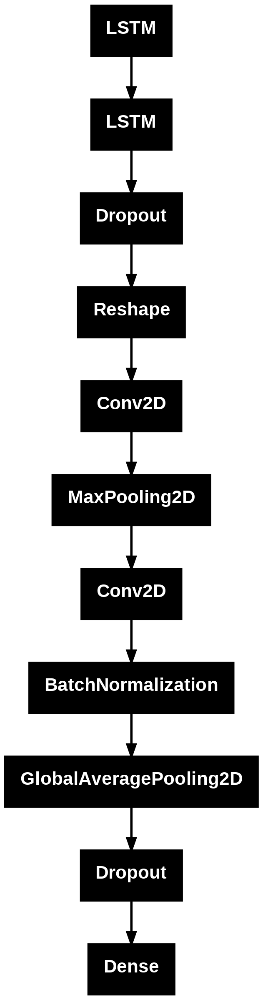

In [ ]:

model.summary()
 #plot model
tf.keras.utils.plot_model(model)

## Model 1 with TDA

Add multi-head with TDA features

In [ ]:
!pip install gudhi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 54.2 MB/s eta 0:00:00


In [ ]:
#~6 mins to run
#~4 mins in better environment (no explicit CPU/GPU speed up)
import numpy as np
from gudhi import RipsComplex
from gudhi import persistence_graphical_tools as pg_tools
import scipy.stats
from scipy.stats import skew
from tqdm import tqdm
import numpy as np
from gudhi import RipsComplex
from scipy.stats import skew

import cupy as cp
#from cupyx.scipy.stats import skew

N_sensors = 1


def extract_stats(diagram):
    """Extracts persistence statistics from a given persistence diagram."""
    births = diagram[:, 0]
    deaths = diagram[:, 1]
    persistence = deaths - births

    skew_birth = skew(births) if len(births) > 2 else 0.0
    skew_death = skew(deaths) if len(deaths) > 2 else 0.0

    # Covariance and correlation
    if len(births) > 1:
        cov = np.cov(births, deaths)[0, 1]
        corr = np.corrcoef(births, deaths)[0, 1]
    else:
        cov = 0.0
        corr = 0.0

    return [
        np.mean(persistence),
        np.std(persistence),
        np.max(persistence),
        np.sum(persistence),
        len(persistence),
        np.mean(births),
        np.mean(deaths),
        np.std(births),
        np.std(deaths),
        np.max(births),
        np.max(deaths)

        #skew_birth,
        #skew_death,
        #cov,
        #corr
    ]

def compute_persistence_features_rips(frames):
    """
    Computes 0D and 1D Vietoris-Rips persistence features using GUDHI for each frame.

    Args:
        frames (np.ndarray): Input of shape (n_frames, frame_size, total_dims) where total_dims = N_sensors*3 + 2

    Returns:
        np.ndarray: (n_frames, N_sensors * n_dims * n_features)
    """
    n_frames, frame_size, n_dim = frames.shape
    assert n_dim == 3, f"Expected input with {N_sensors * 3 + N_sensors} features, got {n_dim}"

    all_persistence_features = []

    for frame in tqdm(frames):
        frame_features = []

        for sensor in range(N_sensors):
            #Excludes magnitudes if present
            sensor_frame = frame[:, 3 * sensor : 3 * (sensor + 1)]  # shape (frame_size, 3)

            rips_complex = RipsComplex(points=sensor_frame, max_edge_length=2.0)
            simplex_tree = rips_complex.create_simplex_tree(max_dimension=1)
            diag = simplex_tree.persistence()

            # Extract persistence diagrams by dimension
            diagram_0d = np.array([pair[1] for pair in diag if pair[0] == 0 and pair[1][1] != float('inf')])
            diagram_1d = np.array([pair[1] for pair in diag if pair[0] == 1 and pair[1][1] != float('inf')])

            features_0d = extract_stats(diagram_0d) if diagram_0d.size > 0 else [0.0] * 15
            features_1d = extract_stats(diagram_1d) if diagram_1d.size > 0 else [0.0] * 15

            # Concatenate all features for this sensor
            frame_features.extend(features_0d + features_1d)

        all_persistence_features.append(frame_features)

    return np.array(all_persistence_features)




In [ ]:
# X_train from previous code has shape (n_samples, 80, 3, 1). Squeeze the last dimension.
X_squeezed = X_train

# Compute 0D persistence features
X_persistenceVR_train = compute_persistence_features_rips(X_train)
X_persistenceVR_test = compute_persistence_features_rips(X_test)

print("X_persistence shape:", X_persistenceVR_train.shape)

### Load WISDM-18 Dataset

In [ ]:
X_18 = np.load("/content/drive/MyDrive/WISDM_Data/X.npy")
X_18=X_18[:, :, [0,1,2,4,5,6]]

#Standard Scaler
scaler = StandardScaler()
#Reshape before scaling
X_18 = scaler.fit_transform(X_18.reshape(-1, X_18.shape[-1])).reshape(X_18.shape)

y_18 = np.load('/content/drive/MyDrive/WISDM_Data/y.npy')
users_18 = np.load('/content/drive/MyDrive/WISDM_Data/users.npy')
#X_18combined_persistence = np.load('X_tda.npy')

In [ ]:
N_sensors = 2


accel_only = True
# Squeeze the last dimension of X before passing.
if X_train.shape[-1]==1:
  X_squeezed = X.squeeze()

X18_train_persistence_gudhi, gudhi_feature_names = compute_persistence_features_gudhi(train18_data, max_dim=0)
X18_test_persistence_gudhi, gudhi_feature_names = compute_persistence_features_gudhi(test18_data, max_dim=0)
print("Shape:", X18_train_persistence_gudhi.shape)

#print("Shape:", X_persistence_gudhi.shape)
#print("First 10 feature names:", gudhi_feature_names[:10])

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3336 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 34824 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 76296 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 125320 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done 141468 out of 141468 | elapsed:   22.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 6384 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 22512 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 38040 tasks      | elapsed:    5.8s


Shape: (23578, 132)


[Parallel(n_jobs=-1)]: Done 38262 out of 38262 | elapsed:    6.0s finished


NameError: name 'compute_persistence_features_gudhi' is not defined

In [ ]:
# Concatenate gudhi and VR
X18_persistence_train = np.concatenate((X18_train_persistence_gudhi, X18_persistenceVR_train), axis=1)
X18_persistence_test = np.concatenate((X18_test_persistence_gudhi, X18_persistenceVR_test), axis=1)

#X_train_persistence_gudhi = np.nan_to_num(X_train_persistence_gudhi)
#X_test_persistence_gudhi = np.nan_to_num(X_test_persistence_gudhi)

In [ ]:
from joblib import Parallel, delayed


selected_channels = [0, 1, 2]
#selected_channels = [0, 1, 2, 3, 4, 5]

def process_channel(frame, ch, max_dim, stats_funcs, stat_names, feature_names_ref):
    frame_persistence_stats = []
    signal = np.ascontiguousarray(frame[:, ch].astype(np.float32))
    cubical_complex = gudhi.CubicalComplex(
    dimensions=[signal.shape[0]],
    top_dimensional_cells=signal
    )
    try:
        persistence = cubical_complex.persistence()
    except Exception:
        return [0] * (1 + (len(stat_names) - 1) * 3) * (max_dim + 1), feature_names_ref

    diagrams_by_dim = {dim: [] for dim in range(max_dim + 1)}
    for dim, bd in persistence:
        if dim <= max_dim:
            diagrams_by_dim[dim].append(bd)

    for dim in range(max_dim + 1):
        diagram_array = np.array(diagrams_by_dim.get(dim, []))
        if diagram_array.size == 0 or diagram_array.ndim != 2:
            frame_persistence_stats.extend([0] * (1 + (len(stat_names) - 1) * 3))
            continue

        finite_bars = diagram_array[~np.isinf(diagram_array[:, 1])]
        persistence_values = finite_bars[:, 1] - finite_bars[:, 0] if finite_bars.size > 0 else np.array([])

        for stat_name, func in stats_funcs.items():
            if stat_name == "num_bars":
                frame_persistence_stats.append(len(diagram_array))
            elif len(persistence_values) > 0:
                frame_persistence_stats.append(func(persistence_values))
                frame_persistence_stats.append(func(finite_bars[:, 1]))
                frame_persistence_stats.append(func(finite_bars[:, 0]))
            else:
                frame_persistence_stats.extend([0, 0, 0])

    return frame_persistence_stats, feature_names_ref


def compute_persistence_features_gudhi(frames, max_dim=1, n_jobs=-1):
    n_frames, frame_size, n_features = frames.shape
    all_persistence_features = []

    if n_features == 3:
      selected_channels = [0, 1, 2]
    elif n_features == 6:
      selected_channels = [0, 1, 2,3,4,5]

    stats_funcs = {
        'mean': np.mean,
        'std': np.std,
        'max': np.max,
        'min': np.min,
        'sum': np.sum,
        'num_bars': lambda x: len(x),
        'entropy': lambda x: 0 if np.sum(x) == 0 else -np.sum((x / np.sum(x)) * np.log(np.clip(x / np.sum(x), 1e-10, 1))),
        'median': np.median
        #'skew': skew,
        #'kurtosis': stats.kurtosis
    }
    stat_names = list(stats_funcs.keys())
    feature_names = []  # build once after first frame

    results = Parallel(n_jobs=n_jobs, verbose=5)(
        delayed(process_channel)(frame, ch, max_dim, stats_funcs, stat_names, feature_names)
        for frame in frames
        for ch in selected_channels
    )

    # regroup results: one row per frame
    for i in range(n_frames):
        row_feats = []
        for j, ch in enumerate(selected_channels):
            row_feats.extend(results[i*len(selected_channels) + j][0])
        all_persistence_features.append(row_feats)

    return np.asarray(all_persistence_features), feature_names



In [ ]:
X_train_p =  X_train_persistence_gudhi
X_test_p = X_test_persistence_gudhi

X_train_prand = np.random.rand(*X_train_persistence_gudhi.shape)
X_test_prand = np.random.rand(*X_test_persistence_gudhi.shape)



In [ ]:
N_sensors = 2
X18_persistenceVR_all = compute_persistence_features_rips(X_18)
X18_persistencegudhi_all = compute_persistence_features_rips(X_18)
import scipy.stats as stats
import gudhi

AssertionError: Expected input with 6 features, got 6

In [ ]:
modelname = "CNN-GRU-LSTM_WISDM18_TDA"

time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
file_start = f'/content/drive/MyDrive/WISDM_Data/{time}'

# Simple LSTM Model definition
def build_simple_lstm(input_shape, num_classes, num_extra_features, drop=0.9):
    # --- Sequence input ---
    seq_input = Input(shape=input_shape, name='seq_input')

    # ----- CNN BLOCK (fast, parallel) -----
    x = Conv1D(64, kernel_size=7, padding='same', activation='relu')(seq_input)
    x=Conv1D(64, kernel_size=7, padding='same', activation='relu')(x)
    x=MaxPooling1D(pool_size=2)(x)
    # output e.g. (timesteps/2, 64)

    # ----- LSTM BLOCK -----
    x=LSTM(128, return_sequences=True)(x)
    # consumes the sequence and outputs a vector

    # ----- GRU BLOCK -----
    x=GRU(64)(x)
    # captures mid-range temporal dependencies
    # GlobalPooling?

    # --- Extra features input ---
    extra_input = Input(shape=(num_extra_features,), name='extra_input')
    normalized_extra = tf.keras.layers.LayerNormalization()(extra_input)
    normalized_extra = Dense(8, activation='relu')(normalized_extra)

    # Combine sequence features + extra features
    combined = Concatenate()([x, normalized_extra])

    # Dense layers
    combined = Dense(128, activation='relu')(combined)
    combined = Dropout(drop)(combined)
    output = Dense(num_classes, activation='softmax')(combined)

    # Create model
    model = Model(inputs=[seq_input, extra_input], outputs=output)
    return model


def train_and_evaluate_model(model, X_train, X_train_persistence_gudhi, y_train, X_test, X_test_persistence_gudhi, y_test, model_name=modelname):

    # Add Gated Recurrent Unit layer
    #model.add(LSTM(128, return_sequences=True)) # Changed to return_sequences=True
    #model.add(LSTM(16, return_sequences=True))
    # Second Conv1D layer processes the sequences from LSTM
    #model.add(Conv1D(16, kernel_size=3, padding = "same", activation='relu'))
    # Add a pooling layer to convert the 3D output to 2D for the Dense layer

    # Create the CosineDecayRestarts schedule
    lr_schedule_restarts = tf.keras.optimizers.schedules.CosineDecayRestarts(
        initial_learning_rate=0.001,
        first_decay_steps=1000000,
        t_mul=5,
        m_mul=0.2,
        alpha=0.01
      )


    # Compile model
    model.compile(optimizer=Adam(learning_rate=lr_schedule_restarts),
                 loss='categorical_crossentropy',
                 metrics=['accuracy'])

    # Define callbacks
    reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                 factor=0.2,
                                 patience=10,
                                 min_lr=0.0001)
    early_stopping = EarlyStopping(monitor='val_accuracy',
                                 patience=200,
                                 restore_best_weights=True)

    # Use y_train labels
    #class_weights = class_weight.compute_class_weight(
    #    'balanced',
    #    classes=np.unique(y_train_raw),
    #    y=y_train_raw
    #)

    # Convert to a dictionary mapping class index to weight
    #class_weight_dict = dict(enumerate(class_weights))
    #print(class_weight_dict)

    # Train model
    # include learning rate schedule
    logger.info(f"\nTraining {model_name}...")
    history = model.fit([X_train, X_train_persistence_gudhi], y_train,
                        epochs=100,
                        batch_size=256,
                        validation_data=([X_test, X_test_persistence_gudhi], y_test),
                        callbacks=[early_stopping],
                        verbose=1, shuffle=True)#,
                        #class_weight = class_weight_dict)

    # Evaluate model
    loss, accuracy = model.evaluate([X_test, X_test_persistence_gudhi], y_test, verbose=0)
    y_pred = model.predict([X_test, X_test_persistence_gudhi])

    return model, history, accuracy, y_pred

# Visualization functions
def plot_training_history(history, model_name=modelname):
    plt.figure(figsize=(15, 5))

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.savefig(f'{file_start}_training_history_{model_name.lower().replace(" ", "_")}.png')
    plt.close()

def plot_confusion_matrix(y_true, y_pred, model_name=modelname):
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_true, axis=1)

    cm = confusion_matrix(y_true_classes, y_pred_classes, normalize="true")
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='f', cmap='Blues')
    plt.title(f'{model_name} - Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    # Set x and y tick labels to activity names
    tick_marks = np.arange(len(reverse_activity_mapping))
    plt.xticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
               rotation=45, ha='right')
    plt.yticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
               rotation=0)

    plt.tight_layout()
    plt.savefig(f'{file_start}_confusion_matrix_{model_name.lower().replace(" ", "_")}.png')
    plt.close()

    return cm

def plot_roc_curves(y_test, y_pred, model_name=modelname):
    n_classes = y_test.shape[1]
    fpr = {}
    tpr = {}
    roc_auc = {}

    # Calculate ROC curve and ROC area for each class
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(12, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i],
                 label=f'{reverse_activity_mapping[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model_name} - ROC Curves')
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.savefig(f'{file_start}_roc_curves_{model_name.lower().replace(" ", "_")}.png')
    plt.close()

    return roc_auc

def plot_precision_recall_curves(y_test, y_pred, model_name=modelname):
    n_classes = y_test.shape[1]
    precision = {}
    recall = {}
    pr_auc = {}

    # Calculate precision-recall curve for each class
    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], y_pred[:, i])
        pr_auc[i] = auc(recall[i], precision[i])

    # Plot precision-recall curves
    plt.figure(figsize=(12, 8))
    for i in range(n_classes):
        plt.plot(recall[i], precision[i],
                 label=f'{reverse_activity_mapping[i]} (AUC = {pr_auc[i]:.2f})')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'{model_name} - Precision-Recall Curves')
    plt.legend(loc="lower left")
    plt.tight_layout()
    plt.savefig(f'{file_start}_precision_recall_curves_{model_name.lower().replace(" ", "_")}.png')
    plt.close()

    return pr_auc

def save_model_results(model, history, accuracy, cm, roc_auc, pr_auc, test_ds, model_name=modelname):
    with open(f'{file_start}_{model_name.lower().replace(" ", "_")}_results.txt', 'w') as f:
        # Model summary
        f.write(f"{model_name} Results\n")
        f.write("="*50 + "\n\n")
        model.summary(print_fn=lambda x: f.write(x + '\n'))
        f.write("\n")

        # Random State
        f.write(f"Random State: {random_state_num}\n")
        f.write("\n")

         # Step Ratio
        f.write(f"Ratio: {stepratio}\n")
        f.write("\n")

        # Performance metrics
        f.write("Performance Metrics\n")
        f.write("-"*50 + "\n")
        f.write(f"Test Accuracy: {accuracy*100:.2f}%\n\n")

        # Confusion Matrix
        f.write("Confusion Matrix\n")
        f.write("-"*50 + "\n")
        np.savetxt(f, cm, fmt='%d')
        f.write("\n")

        # Classification Report (Test)
        f.write("Classification Report (Test)\n")
        f.write("-"*50 + "\n")
        y_pred_classes = np.argmax(model.predict(test_ds), axis=1)
        y_true_classes = np.argmax(y_test, axis=1)
        report = classification_report(y_true_classes, y_pred_classes)
        f.write(report)
        f.write("\n")

        # ROC AUC scores
        f.write("ROC AUC Scores\n")
        f.write("-"*50 + "\n")
        for i in range(len(roc_auc)):
            f.write(f"{reverse_activity_mapping[i]}: {roc_auc[i]:.4f}\n")
        f.write("\n")

        # PR AUC scores
        f.write("Precision-Recall AUC Scores\n")
        f.write("-"*50 + "\n")
        for i in range(len(pr_auc)):
            f.write(f"{reverse_activity_mapping[i]}: {pr_auc[i]:.4f}\n")
        f.write("\n")

        # Training history
        f.write("Training History\n")
        f.write("-"*50 + "\n")
        f.write("Epoch\tLoss\tAccuracy\tVal_Loss\tVal_Accuracy\n")
        for i in range(len(history.history['loss'])):
            f.write(f"{i+1}\t{history.history['loss'][i]:.4f}\t")
            f.write(f"{history.history['accuracy'][i]:.4f}\t")
            f.write(f"{history.history['val_loss'][i]:.4f}\t")
            f.write(f"{history.history['val_accuracy'][i]:.4f}\n")

# Main execution

In [ ]:


# Random numbers with shape of X18train_prand

X18train_prand = np.random.rand(*X18train_prand.shape)
X18test_prand = np.random.rand(*X18test_prand.shape)

# Check for nans in training data
np.isinf(test18_data).any()

NameError: name 'users_18' is not defined

Move TDA generation to here

In [ ]:
modelname = "CNN-GRU-LSTM, no TDA (WISDM 18 Version)"

time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
file_start = f'/content/drive/MyDrive/WISDM_Data/{time}'

if 1==1:
    print(f"Starting {modelname} model training and evaluation...")

    # Create and compile model
    input_shape = (train18_data.shape[1], train18_data.shape[2])
    print(input_shape)
    num_classes = train18_y.shape[1]
    extra_feats = X18_persistence_train.shape[1]
    model = build_simple_lstm(input_shape, num_classes, extra_feats, drop=0.75)

    # Replace training tda array with random noise
    X18train_prand = np.random.rand(*X18_persistence_train.shape)
    X18test_prand = np.random.rand(*X18_persistence_test.shape)


    # Print model summary
    model.summary()

    # Train and evaluate model
    model, history, accuracy, y_pred = train_and_evaluate_model(
        model, train18_data, X18train_prand, train18_y, test18_data, X18test_prand, test18_y
    )

    # Generate visualizations and metrics
    cm = plot_confusion_matrix(test18_y, y_pred)
    plot_training_history(history)
    roc_auc = plot_roc_curves(test18_y, y_pred)
    pr_auc = plot_precision_recall_curves(test18_y, y_pred)

    # Save results
    save_model_results(model, history, accuracy, cm, roc_auc, pr_auc, [test18_data, X18test_prand], test18_y)

    # Save model
    time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    model.save('/content/drive/MyDrive/WISDM_Data/lstm'+time+'_wisdm.h5')

    logger.info(f"\n{modelname} Results:")
    logger.info(f"Test Accuracy: {accuracy*100:.2f}%")
    logger.info("Model and results have been saved.")


Starting CNN-GRU-LSTM, no TDA (WISDM 18 Version) model training and evaluation...


NameError: name 'train18_data' is not defined

In [ ]:
from sklearn.model_selection import train_test_split
import numpy as np # Import numpy
import pandas as pd # Import pandas

# finding the train:test split
# iterate through 6 users for test and 30 users for train
# check that both groups have all 6 activities in them
# record that the number of sequences in the test set
# y_users stores users for each sequence, label in x, y
X, y, y_users = create_sequences(wisdm_data, sequence_length)
participants = np.unique(y_users) # Fixed: Use np.unique() for numpy arrays

# Check whether both have same number of unique labels, store in dataframe
data_frame_test = pd.DataFrame(columns=['random_state', 'test_labels', 'train_labels', 'nseq_test'])



for random_state_num in range(10000):
  train_participants, test_participants = train_test_split(participants, test_size=0.2, random_state=random_state_num)
  train_labels = y[np.isin(y_users, train_participants)]
  test_labels = y[np.isin(y_users, test_participants)]
  data_frame_test.loc[random_state_num, 'random_state'] = random_state_num
  data_frame_test.loc[random_state_num, 'test_labels'] = len(np.unique(test_labels))
  data_frame_test.loc[random_state_num, 'train_labels'] = len(np.unique(train_labels))
  data_frame_test.loc[random_state_num, 'nseq_test'] = len(test_labels)
  data_frame_test.loc[random_state_num, 'nseq_train'] = len(train_labels)

# Which combination has 3036 test values?





In [ ]:
data_frame_test.query("test_labels==6 and train_labels==6 and nseq_test<3037").sort_values("nseq_test", ascending=False)

,random_state,test_labels,train_labels,nseq_test,nseq_train
3225,3225,6,6,3036,13062.0
619,619,6,6,3036,13062.0
9917,9917,6,6,3036,13062.0
3708,3708,6,6,3036,13062.0
5616,5616,6,6,3035,13063.0
...,...,...,...,...,...
6031,6031,6,6,2569,13529.0
8611,8611,6,6,2560,13538.0
5068,5068,6,6,2557,13541.0
6362,6362,6,6,2355,13743.0


In [ ]:
wisdm_data = pd.read_csv(data_file, header=0, names=column_names, on_bad_lines="warn")
print(np.min(wisdm_data[features]))
np.max(wisdm_data[features])

-19.8


20.04

In [ ]:
wisdm_data['activity']

,activity
0,0
1,0
2,0
3,0
4,0
...,...
1030381,35
1030382,35
1030383,35
1030384,35


## Model 2 - WISDM6 - Sequential

Reproducing Dua 2021 CNN-GRU
Single Head Sequential Model for WISDM6


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    InputLayer, TimeDistributed, Conv1D, Dropout,
    MaxPooling1D, Flatten, GRU, Dense, BatchNormalization,
    Activation
)

from backcall import callback_prototype
from numpy.random import shuffle
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.utils import class_weight
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve, classification_report, f1_score, precision_score, recall_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Conv1D, Bidirectional
from tensorflow.keras.layers import GlobalAveragePooling1D, MaxPool1D, Reshape, Conv2D, MaxPool2D
from tensorflow.keras.layers import BatchNormalization, AvgPool1D, Flatten, GRU, GlobalAveragePooling2D
from tensorflow.keras.regularizers import L2
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
import numpy as np
import tensorflow as tf
import tarfile
import datetime
import logging

# Connect drive
from google.colab import drive
if not os.path.exists('/content/drive'):
  drive.mount('/content/drive')

modelname = model_name = "KernelSize911"

# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(message)s')
logger = logging.getLogger()

# Suppress TensorFlow GPU warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Enable memory growth for the GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        logger.error(f"GPU error: {e}")

logger.info("Starting data preprocessing...")
print("Starting data preprocessing...")

# Define the path to the main dataset file
data_file = os.path.join('/content/drive/MyDrive/','WISDM_Data/WISDM_ar_v1.1_raw_clean.csv')



# Load the dataset, skipping bad lines
logger.info("Loading dataset...")
#column_names = ['user', 'activity', 'timestamp', 'x', 'y', 'z']
wisdm_data = pd.read_csv(data_file, header=0, on_bad_lines="warn")
#wisdm_data = df_final
print(f"Initial dataset shape: {wisdm_data.shape}")

# Data Cleaning
# Convert all values to strings
wisdm_data['x'] = wisdm_data['x'].astype(str)
wisdm_data['y'] = wisdm_data['y'].astype(str)
wisdm_data['z'] = wisdm_data['z'].astype(str)

# Remove non-numeric characters
wisdm_data['x'] = wisdm_data['x'].str.replace(';', '', regex=False)
wisdm_data['y'] = wisdm_data['y'].str.replace(';', '', regex=False)
wisdm_data['z'] = wisdm_data['z'].str.replace(';', '', regex=False)

# Remove rows with non-numeric values
#wisdm_data = wisdm_data[wisdm_data['x'].apply(lambda x: x.replace('.', '', 1).isdigit())]
#wisdm_data = wisdm_data[wisdm_data['y'].apply(lambda y: y.replace('.', '', 1).isdigit())]
#wisdm_data = wisdm_data[wisdm_data['z'].apply(lambda z: z.replace('.', '', 1).isdigit())]

# Linear interpolation of missing x, y z values
wisdm_data['x'] = wisdm_data['x'].astype(float)
wisdm_data['y']= wisdm_data['y'].astype(float)
wisdm_data['z'] = wisdm_data['z'].astype(float)

# Convert columns back to numeric
wisdm_data['x'] = pd.to_numeric(wisdm_data['x'])
wisdm_data['y'] = pd.to_numeric(wisdm_data['y'])
wisdm_data['z'] = pd.to_numeric(wisdm_data['z'])

# Handle missing values
print(wisdm_data.shape)
wisdm_data = wisdm_data.dropna()
print(wisdm_data.shape)

logger.info(f"Dataset shape after cleaning: {wisdm_data.shape}")

# Enable XLA GPU optimizations
tf.config.optimizer.set_jit(True)

# Mixed precision (if GPU supports it)
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

# Calculate magnitude
#wisdm_data['magnitude'] = np.sqrt(wisdm_data['x']**2 + wisdm_data['y']**2 + wisdm_data['z']**2)

# Handle NaN and infinite values
wisdm_data = wisdm_data.replace([np.inf, -np.inf], np.nan).fillna(method='ffill').fillna(method='bfill')

# Map activity labels to integers
activity_mapping = {label: idx for idx, label in enumerate(wisdm_data['activity'].unique())}
wisdm_data['activity'] = wisdm_data['activity'].map(activity_mapping)

# Reverse mapping for later use
reverse_activity_mapping = {v: k for k, v in activity_mapping.items()}

# Normalize features
logger.info("Normalizing features...")
scaler = StandardScaler()
features = ['x', 'y', 'z']
wisdm_data[features] = scaler.fit_transform(wisdm_data[features])
subset_columns = ['x', 'y', 'z', 'user', 'activity']
wisdm_data = wisdm_data[subset_columns]
# Create sequences
stepratio = 0.5
def create_sequences(data, seq_length, ratio=stepratio):
    step=round(seq_length*ratio)
    sequences = []
    labels = []
    users = []
    for start in range(0, len(data) - seq_length, step):
        sequences.append(data.iloc[start:start + seq_length][features].values)
        labels.append(data.iloc[start + seq_length - 1]['activity'])
        users.append(data.iloc[start + seq_length - 1]['user'])
    return np.array(sequences), np.array(labels), np.array(users)

# Create sequences from the data
sequence_length = 128

# Split the data by participants first
#logger.info("Splitting the data by participants...")
participants = wisdm_data['user'].unique()
#train_participants = participants[0:29]
#test_participants = participants[29:35]


#for id in [Seed1: 5099, Seed2 : 17442, Seed 3: 1336, Seed 4: 91021]:
seeds1 = [5099, 17442, 1336, 91021]
seeds2 = [2671, 89172, 23619, 5667, 120, 214, 9899]
rng = np.random.default_rng(1)
random_seeds = rng.integers(low=1,high=100000, size=4)
layouts = [['LSTM', 'LSTM']]#, ['LSTM','GRU'], ['GRU', 'LSTM']]
param_dict={
    #'Model0':[11,False,False,False],
    #'Model1':[15,False,False,False]
    #'Model2':[13,True,False,False],
    #'Model3':[13,True,True,False],
    'Model4':[13,False,False,True],
    'Model5':[13,True,False,True],
    #'Model6':[13,True,True,True]
    }

full_seeds = seeds1 + seeds2 + list(random_seeds)

for id in full_seeds:
  for layout in layouts:
    for key in pd.DataFrame(param_dict):
        ks = pd.DataFrame(param_dict)[key][0]
        L2 = pd.DataFrame(param_dict)[key][1]
        BN = pd.DataFrame(param_dict)[key][2]
        MP = pd.DataFrame(param_dict)[key][3]

        random_state_num = id

        train_participants, test_participants = train_test_split(participants, test_size=0.18, random_state=random_state_num)
        train_data = wisdm_data[wisdm_data['user'].isin(train_participants)]
        test_data = wisdm_data[wisdm_data['user'].isin(test_participants)]

        #X, y = create_sequences(wisdm_data, sequence_length)

        X_train, y_train_raw, y_train_users = create_sequences(train_data, sequence_length)
        X_test, y_test_raw, y_test_users = create_sequences(test_data, sequence_length)

        # Convert labels to categorical
        y_train = to_categorical(y_train_raw)
        y_test = to_categorical(y_test_raw)

        train_ds = (
        tf.data.Dataset.from_tensor_slices((X_train, y_train))
        .shuffle(5000)
        .batch(192)
        .prefetch(tf.data.AUTOTUNE)
        )

        test_ds = (
        tf.data.Dataset.from_tensor_slices((X_test, y_test))
        .batch(192)
        .prefetch(tf.data.AUTOTUNE)
        )


        time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
        file_start = f'/content/drive/MyDrive/WISDM_Data/{time}'
        # Simple LSTM Model definition
        def build_simple_lstm(input_shape, num_classes):
            model = Sequential()

            # ----- INPUT -----
            model.add(InputLayer(input_shape=input_shape))
            # Extra BN
            if BN:
              model.add(BatchNormalization())
            # input: (timesteps, features)

            # ----- CNN BLOCK (fast, parallel) -----
            model.add(Conv1D(64, kernel_size=ks, padding='same', activation='relu'))
            # Extra MP
            if MP:
              model.add(MaxPooling1D(pool_size=2))

            model.add(Conv1D(64, kernel_size=ks, padding='same', activation='relu'))
            model.add(Dropout(0.5))
            model.add(MaxPooling1D(pool_size=2))
            # output e.g. (timesteps/2, 64)

            # ----- LSTM.GRU BLOCK ----- LAYER 1
            if layout[0]=="LSTM":
              model.add(LSTM(32, return_sequences=True))
            else:
              model.add(GRU(32, return_sequences=True))

            # ----- LSTM.GRU BLOCK ----- LAYER 2
            if layout[1]=="LSTM":
              model.add(LSTM(32))
            else:
              model.add(GRU(32))
            # captures mid-range temporal dependencies

            # ----- DENSE HEAD -----
            if L2:
              model.add(Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4)))
            else:
              model.add(Dense(32, activation='relu'))

            model.add(BatchNormalization())
            model.add(Dropout(0.5))
            # ----- OUTPUT -----
            model.add(Dense(num_classes, activation='softmax'))

            return model

        def train_and_evaluate_model(model, train_ds, test_ds, model_name=modelname):

            # Add Gated Recurrent Unit layer
            #model.add(LSTM(128, return_sequences=True)) # Changed to return_sequences=True
            #model.add(LSTM(16, return_sequences=True))
            # Second Conv1D layer processes the sequences from LSTM
            #model.add(Conv1D(16, kernel_size=3, padding = "same", activation='relu'))
            # Add a pooling layer to convert the 3D output to 2D for the Dense layer

            # Create the CosineDecayRestarts schedule
            lr_schedule_restarts = tf.keras.optimizers.schedules.CosineDecayRestarts(
                initial_learning_rate=0.001,
                first_decay_steps=200000,
                t_mul=5,
                m_mul=0.2,
                alpha=0.1
              )


            # Compile model
            model.compile(optimizer=Adam(learning_rate=lr_schedule_restarts),
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

            # Define callbacks
            reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                        factor=0.2,
                                        patience=10,
                                        min_lr=0.0001)
            early_stopping = EarlyStopping(monitor='val_accuracy',
                                        patience=200,
                                        restore_best_weights=True)

            # Use y_train labels
            #class_weights = class_weight.compute_class_weight(
            #    'balanced',
            #    classes=np.unique(y_train_raw),
            #    y=y_train_raw
            #)

            # Convert to a dictionary mapping class index to weight
            #class_weight_dict = dict(enumerate(class_weights))
            #print(class_weight_dict)

            # Train model
            # include learning rate schedule
            logger.info(f"\nTraining {model_name}...")
            history = model.fit(train_ds,
                                epochs=200,
                                batch_size=512,
                                validation_data=(test_ds),
                                callbacks=[early_stopping],
                                verbose=1)#,
                                #class_weight = class_weight_dict)

            # Evaluate model
            loss, accuracy = model.evaluate(test_ds, verbose=1)
            y_pred = model.predict(X_test)

            # Convert y_test and y_pred to class labels for metrics
            y_test_labels = np.argmax(y_test, axis=1)
            y_pred_labels = np.argmax(y_pred, axis=1)

            F1 = f1_score(y_test_labels, y_pred_labels, average='weighted')
            print(f"F1 Score: {round(F1,4)}")
            Precision = precision_score(y_test_labels, y_pred_labels, average='weighted')
            print(f"Precision Score: {round(Precision,4)}")
            Recall = recall_score(y_test_labels, y_pred_labels, average='weighted')
            print(f"Recall Score: {round(Recall,4)}")

            print(f"Loss:{round(loss,4)}, Accuracy: {round(accuracy,4)}")

            return model, history, accuracy, y_pred

        # Visualization functions
        def plot_training_history(history, model_name=modelname):
            plt.figure(figsize=(15, 5))

            # Plot accuracy
            plt.subplot(1, 2, 1)
            plt.plot(history.history['accuracy'], label='Training Accuracy')
            plt.plot(history.history['val_accuracy'], label='Testing Accuracy')
            plt.title(f'{model_name} - Accuracy')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.legend()

            # Plot loss
            plt.subplot(1, 2, 2)
            plt.plot(history.history['loss'], label='Training Loss')
            plt.plot(history.history['val_loss'], label='Testing Loss')
            plt.title(f'{model_name} - Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.legend()

            plt.tight_layout()
            plt.savefig(f'{file_start}_training_history_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

        def plot_confusion_matrix(y_true, y_pred, model_name=modelname):
            y_pred_classes = np.argmax(y_pred, axis=1)
            y_true_classes = np.argmax(y_true, axis=1)

            cm = confusion_matrix(y_true_classes, y_pred_classes, normalize="true")
            cm2 = confusion_matrix(y_true_classes, y_pred_classes, normalize=None)
            plt.figure(figsize=(12, 10))
            sns.heatmap(cm, annot=True, fmt='f', cmap='Blues')
            plt.title(f'{model_name} - Confusion Matrix')
            plt.ylabel('True label')
            plt.xlabel('Predicted label')

            # Set x and y tick labels to activity names
            tick_marks = np.arange(len(reverse_activity_mapping))
            plt.xticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
                      rotation=45, ha='right')
            plt.yticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
                      rotation=0)

            plt.tight_layout()
            plt.savefig(f'{file_start}_confusion_matrix_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return cm2

        def plot_roc_curves(y_test, y_pred, model_name=modelname):
            n_classes = y_test.shape[1]
            fpr = {}
            tpr = {}
            roc_auc = {}

            # Calculate ROC curve and ROC area for each class
            for i in range(n_classes):
                fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
                roc_auc[i] = auc(fpr[i], tpr[i])

            # Plot ROC curves
            plt.figure(figsize=(12, 8))
            for i in range(n_classes):
                plt.plot(fpr[i], tpr[i],
                        label=f'{reverse_activity_mapping[i]} (AUC = {roc_auc[i]:.2f})')

            plt.plot([0, 1], [0, 1], 'k--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'{model_name} - ROC Curves')
            plt.legend(loc="lower right")
            plt.tight_layout()
            plt.savefig(f'{file_start}_roc_curves_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return roc_auc

        def plot_precision_recall_curves(y_test, y_pred, model_name=modelname):
            n_classes = y_test.shape[1]
            precision = {}
            recall = {}
            pr_auc = {}

            # Calculate precision-recall curve for each class
            for i in range(n_classes):
                precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], y_pred[:, i])
                pr_auc[i] = auc(recall[i], precision[i])

            # Plot precision-recall curves
            plt.figure(figsize=(12, 8))
            for i in range(n_classes):
                plt.plot(recall[i], precision[i],
                        label=f'{reverse_activity_mapping[i]} (AUC = {pr_auc[i]:.2f})')

            plt.xlabel('Recall')
            plt.ylabel('Precision')
            plt.title(f'{model_name} - Precision-Recall Curves')
            plt.legend(loc="lower left")
            plt.tight_layout()
            plt.savefig(f'{file_start}_precision_recall_curves_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return pr_auc

        def save_model_results(model, history, accuracy, cm, roc_auc, pr_auc, model_name=modelname):
            with open(f'{file_start}_{model_name.lower().replace(" ", "_")}_results.txt', 'w') as f:
                # Model summary
                f.write(f"{model_name} Results\n")
                f.write("="*50 + "\n\n")
                model.summary(print_fn=lambda x: f.write(x + '\n'))
                f.write("\n")

                # Random State
                f.write(f"Random State: {random_state_num}\n")
                f.write("\n")

                # Step Ratio
                f.write(f"Ratio: {stepratio}\n")
                f.write("\n")

                # Performance metrics
                f.write("Performance Metrics\n")
                f.write("-"*50 + "\n")
                f.write(f"Test Accuracy: {accuracy*100:.2f}%\n\n")

                # Confusion Matrix
                f.write("Confusion Matrix\n")
                f.write("-"*50 + "\n")
                np.savetxt(f, cm, fmt='%d')
                f.write("\n")

                # Classification Report (Test)
                f.write("Classification Report (Test)\n")
                f.write("-"*50 + "\n")
                y_pred_classes = np.argmax(model.predict(X_test), axis=1)
                y_true_classes = np.argmax(y_test, axis=1)
                report = classification_report(y_true_classes, y_pred_classes)
                f.write(report)
                f.write("\n")

                # ROC AUC scores
                f.write("ROC AUC Scores\n")
                f.write("-"*50 + "\n")
                for i in range(len(roc_auc)):
                    f.write(f"{reverse_activity_mapping[i]}: {roc_auc[i]:.4f}\n")
                f.write("\n")

                # PR AUC scores
                f.write("Precision-Recall AUC Scores\n")
                f.write("-"*50 + "\n")
                for i in range(len(pr_auc)):
                    f.write(f"{reverse_activity_mapping[i]}: {pr_auc[i]:.4f}\n")
                f.write("\n")

                # Training history
                f.write("Training History\n")
                f.write("-"*50 + "\n")
                f.write("Epoch\tLoss\tAccuracy\tVal_Loss\tVal_Accuracy\n")
                for i in range(len(history.history['loss'])):
                    f.write(f"{i+1}\t{history.history['loss'][i]:.4f}\t")
                    f.write(f"{history.history['accuracy'][i]:.4f}\t")
                    f.write(f"{history.history['val_loss'][i]:.4f}\t")
                    f.write(f"{history.history['val_accuracy'][i]:.4f}\n")

        # Main execution

        modelname = model_name
        if 1==1:
            print(f"Starting {modelname} model training and evaluation...")

            # Create and compile model
            input_shape = (X_train.shape[1], X_train.shape[2])
            print(input_shape)
            num_classes = y_train.shape[1]
            model = build_simple_lstm(input_shape, num_classes)

            # Print model summary
            model.summary()

            # Train and evaluate model
            model, history, accuracy, y_pred = train_and_evaluate_model(
                model, train_ds, test_ds
            )

            # Generate visualizations and metrics
            cm = plot_confusion_matrix(y_test, y_pred)
            plot_training_history(history)
            roc_auc = plot_roc_curves(y_test, y_pred)
            pr_auc = plot_precision_recall_curves(y_test, y_pred)

            # Save results
            save_model_results(model, history, accuracy, cm, roc_auc, pr_auc)

            # Save model
            time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
            model.save('/content/drive/MyDrive/WISDM_Data/lstm'+time+'_wisdm.h5')

            logger.info(f"\n{modelname} Results:")
            logger.info(f"Test Accuracy: {accuracy*100:.2f}%")
            logger.info("Model and results have been saved.")


Starting data preprocessing...
Initial dataset shape: (1030386, 6)
(1030386, 6)
(1030386, 6)


/tmp/ipython-input-3033502522.py:114: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  wisdm_data = wisdm_data.replace([np.inf, -np.inf], np.nan).fillna(method='ffill').fillna(method='bfill')


Starting KernelSize911 model training and evaluation...
(128, 3)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 128, 64)        │         2,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 64, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 64, 64)         │        53,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 32, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 32, 32)         │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 32)             │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           198 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 77,990 (304.65 KB)

 Trainable params: 77,926 (304.40 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
69/69 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - accuracy: 0.4966 - loss: 1.3957 - val_accuracy: 0.4796 - val_loss: 1.4317
Epoch 2/200
69/69 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.8283 - loss: 0.5273 - val_accuracy: 0.6078 - val_loss: 1.1992
Epoch 3/200
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8297 - loss: 0.4992 - val_accuracy: 0.7119 - val_loss: 0.9059
Epoch 4/200
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8903 - loss: 0.3316 - val_accuracy: 0.8141 - val_loss: 0.6138
Epoch 5/200
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9210 - loss: 0.2599 - val_accuracy: 0.6599 - val_loss: 1.0860
Epoch 6/200
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9028 - loss: 0.3269 - val_accuracy: 0.7676 - val_loss: 0.7794
Epoch 7/200
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9347 - loss: 0.2293 - val_accuracy: 0.8438 - val_loss: 0.6905
Epoch 8/200
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8946 - loss: 0.3550 - val_accuracy: 0.7508 

KeyboardInterrupt: 

## Pre-Multihead Generate TDA for WISDM6

In [ ]:
!pip install gudhi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 106.9 MB/s eta 0:00:00


In [ ]:
#~6 mins to run
#~4 mins in better environment (no explicit CPU/GPU speed up)
import gudhi
import numpy as np
from gudhi import RipsComplex
from gudhi import persistence_graphical_tools as pg_tools
import scipy.stats
from scipy.stats import skew
from tqdm import tqdm
import numpy as np
from gudhi import RipsComplex
from scipy.stats import skew

import cupy as cp
#from cupyx.scipy.stats import skew

N_sensors = 1


def extract_stats(diagram):
    """Extracts persistence statistics from a given persistence diagram."""
    births = diagram[:, 0]
    deaths = diagram[:, 1]
    persistence = deaths - births

    skew_birth = skew(births) if len(births) > 2 else 0.0
    skew_death = skew(deaths) if len(deaths) > 2 else 0.0

    # Covariance and correlation
    if len(births) > 1:
        cov = np.cov(births, deaths)[0, 1]
        corr = np.corrcoef(births, deaths)[0, 1]
    else:
        cov = 0.0
        corr = 0.0

    return [
        np.mean(persistence),
        np.std(persistence),
        np.max(persistence),
        np.sum(persistence),
        len(persistence),
        np.mean(births),
        np.mean(deaths),
        np.std(births),
        np.std(deaths),
        np.max(births),
        np.max(deaths)
        #skew_birth,
        #skew_death,
        #cov,
        #corr
    ]

def compute_persistence_features_rips(frames, N_sensors):
    """
    Computes 0D and 1D Vietoris-Rips persistence features using GUDHI for each frame.

    Args:
        frames (np.ndarray): Input of shape (n_frames, frame_size, total_dims) where total_dims = N_sensors*3 + 2

    Returns:
        np.ndarray: (n_frames, N_sensors * n_dims * n_features)
    """
    n_frames, frame_size, n_dim = frames.shape
    print(f"Expected input with {N_sensors * 3} features, got {n_dim}") # Corrected assertion

    all_persistence_features = []

    for frame in tqdm(frames):
        frame_features = []

        for sensor in range(N_sensors):
            #Excludes magnitudes if present
            sensor_frame = frame[:, 3 * sensor : 3 * (sensor + 1)]  # shape (frame_size, 3)

            rips_complex = RipsComplex(points=sensor_frame, max_edge_length=2.0)
            simplex_tree = rips_complex.create_simplex_tree(max_dimension=1)
            diag = simplex_tree.persistence()

            # Extract persistence diagrams by dimension
            diagram_0d = np.array([pair[1] for pair in diag if pair[0] == 0 and pair[1][1] != float('inf')])
            diagram_1d = np.array([pair[1] for pair in diag if pair[0] == 1 and pair[1][1] != float('inf')])

            features_0d = extract_stats(diagram_0d) if diagram_0d.size > 0 else [0.0] * 15
            features_1d = extract_stats(diagram_1d) if diagram_1d.size > 0 else [0.0] * 15

            # Concatenate all features for this sensor
            frame_features.extend(features_0d + features_1d)

        all_persistence_features.append(frame_features)

    return np.array(all_persistence_features)





In [ ]:
N_sensors

1

In [ ]:
import gudhi

X_tda_2, names = compute_persistence_features_gudhi(X_all)



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 492 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 15372 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 46806 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 48135 out of 48135 | elapsed:    6.0s finished


In [ ]:
X_tda_all = np.concatenate((X_tda_all, X_tda_2), axis=1)
num_tda_features = X_tda_all.shape[1]

In [ ]:
import numpy             as np
import tensorflow        as tf
from sklearn.preprocessing import MinMaxScaler
import gudhi.representations as gdr
import gudhi.tensorflow.perslay as prsl

diagrams = [np.array([[0.,4.],[1.,2.],[3.,8.],[6.,8.]])]
diagrams = gdr.DiagramScaler(use=True, scalers=[([0,1], MinMaxScaler())]).fit_transform(diagrams)
# Change dtype to tf.float16 to match mixed_precision policy
diagrams = tf.RaggedTensor.from_tensor(tf.constant(diagrams, dtype=tf.float16))

rho = tf.identity
phi = prsl.GaussianPerslayPhi((5.0, 5.0), ((-.5, 1.5), (-.5, 1.5)), .1)
weight = prsl.PowerPerslayWeight(1.,0.)
perm_op = tf.math.reduce_sum

perslay = prsl.Perslay(phi=phi, weight=weight, perm_op=perm_op, rho=rho)
vectors = perslay(diagrams)
print(vectors)

cannot compute Sub as input #1(zero-based) was expected to be a half tensor but is a float tensor [Op:Sub] name:

InvalidArgumentError: Exception encountered when calling GaussianPerslayPhi.call().

[1mcannot compute Sub as input #1(zero-based) was expected to be a half tensor but is a float tensor [Op:Sub] name: [0m

Arguments received by GaussianPerslayPhi.call():
  • diagrams=tf.Tensor(shape=(1, 4, 2), dtype=float16)

## Multi-head TDA + CNN-LSTM/GRU

---

WISDM 6

In [ ]:
from scipy.stats.distributions import norm
from pickle import load
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    InputLayer, TimeDistributed, Conv1D, Dropout,
    MaxPooling1D, Flatten, GRU, Dense, BatchNormalization,
    Activation
)
import gudhi
from backcall import callback_prototype
from numpy.random import shuffle
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.utils import class_weight
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve, classification_report, f1_score, precision_score, recall_score
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Dense, Dropout, Conv1D, Bidirectional, Input, Concatenate, GRU
from tensorflow.keras.layers import GlobalAveragePooling1D, MaxPool1D, Reshape, Conv2D, MaxPool2D
from tensorflow.keras.layers import BatchNormalization, AvgPool1D, Flatten, GRU, GlobalAveragePooling2D
from tensorflow.keras.regularizers import L2
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
import numpy as np
import tensorflow as tf
import tarfile
import datetime
import logging

# Connect drive
from google.colab import drive
if not os.path.exists('/content/drive'):
  drive.mount('/content/drive')

modelname = model_name = "tda_best"

# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(message)s')
logger = logging.getLogger()

# Suppress TensorFlow GPU warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Enable memory growth for the GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        logger.error(f"GPU error: {e}")

logger.info("Starting data preprocessing...")
print("Starting data preprocessing...")

# Define the path to the main dataset file
data_file = os.path.join('/content/drive/MyDrive/','WISDM_Data/WISDM_ar_v1.1_raw_clean.csv')



# Load the dataset, skipping bad lines
logger.info("Loading dataset...")
#column_names = ['user', 'activity', 'timestamp', 'x', 'y', 'z']
wisdm_data = pd.read_csv(data_file, header=0, on_bad_lines="warn")
#wisdm_data = df_final
print(f"Initial dataset shape: {wisdm_data.shape}")

# Data Cleaning
# Convert all values to strings
wisdm_data['x'] = wisdm_data['x'].astype(str)
wisdm_data['y'] = wisdm_data['y'].astype(str)
wisdm_data['z'] = wisdm_data['z'].astype(str)

# Remove non-numeric characters
wisdm_data['x'] = wisdm_data['x'].str.replace(';', '', regex=False)
wisdm_data['y'] = wisdm_data['y'].str.replace(';', '', regex=False)
wisdm_data['z'] = wisdm_data['z'].str.replace(';', '', regex=False)

# Remove rows with non-numeric values
#wisdm_data = wisdm_data[wisdm_data['x'].apply(lambda x: x.replace('.', '', 1).isdigit())]
#wisdm_data = wisdm_data[wisdm_data['y'].apply(lambda y: y.replace('.', '', 1).isdigit())]
#wisdm_data = wisdm_data[wisdm_data['z'].apply(lambda z: z.replace('.', '', 1).isdigit())]

# Linear interpolation of missing x, y z values
wisdm_data['x'] = wisdm_data['x'].astype(float)
wisdm_data['y']= wisdm_data['y'].astype(float)
wisdm_data['z'] = wisdm_data['z'].astype(float)

# Convert columns back to numeric
wisdm_data['x'] = pd.to_numeric(wisdm_data['x'])
wisdm_data['y'] = pd.to_numeric(wisdm_data['y'])
wisdm_data['z'] = pd.to_numeric(wisdm_data['z'])

# Handle missing values
print(wisdm_data.shape)
wisdm_data = wisdm_data.dropna()
print(wisdm_data.shape)

logger.info(f"Dataset shape after cleaning: {wisdm_data.shape}")

# Enable XLA GPU optimizations
tf.config.optimizer.set_jit(True)

# Mixed precision (if GPU supports it)
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

# Calculate magnitude
#wisdm_data['magnitude'] = np.sqrt(wisdm_data['x']**2 + wisdm_data['y']**2 + wisdm_data['z']**2)

# Handle NaN and infinite values
wisdm_data = wisdm_data.replace([np.inf, -np.inf], np.nan).fillna(method='ffill').fillna(method='bfill')

# Map activity labels to integers
activity_mapping = {label: idx for idx, label in enumerate(wisdm_data['activity'].unique())}
wisdm_data['activity'] = wisdm_data['activity'].map(activity_mapping)

# Reverse mapping for later use
reverse_activity_mapping = {v: k for k, v in activity_mapping.items()}

# Normalize features
logger.info("Normalizing features...")
scaler = StandardScaler()
features = ['x', 'y', 'z']
wisdm_data[features] = scaler.fit_transform(wisdm_data[features])
subset_columns = ['x', 'y', 'z', 'user', 'activity']
wisdm_data = wisdm_data[subset_columns]
# Create sequences
stepratio = 0.5
def create_sequences(data, seq_length, ratio=stepratio):
    step=round(seq_length*ratio)
    sequences = []
    labels = []
    users = []
    for start in range(0, len(data) - seq_length, step):
        sequences.append(data.iloc[start:start + seq_length][features].values)
        labels.append(data.iloc[start + seq_length - 1]['activity'])
        users.append(data.iloc[start + seq_length - 1]['user'])
    return np.array(sequences), np.array(labels), np.array(users)

# Create sequences from the data
sequence_length = 128

# Split the data by participants first
#logger.info("Splitting the data by participants...")
participants = wisdm_data['user'].unique()
#train_participants = participants[0:29]
#test_participants = participants[29:35]

model_name = modelname= "WISDM6_TDA_BestModels"

#for id in [Seed1: 5099, Seed2 : 17442, Seed 3: 1336, Seed 4: 91021]:
seeds1 = [5099, 17442, 1336, 91021]
seeds2 = [2671, 89172, 23619, 5667, 120, 214, 9899]
rng = np.random.default_rng(1)
random_seeds = list(rng.integers(low=1,high=100000, size=4))

# Create WISDM6 Sequences
N_sensors = 1
X, y, users = create_sequences(wisdm_data, sequence_length)

# Check if TDA file exists
if os.path.exists("/content/drive/MyDrive/WISDM_Data/WISDM6_allTDA.npy"):
  X_tda = np.load("/content/drive/MyDrive/WISDM_Data/WISDM6_allTDA.npy")
else:
  X_tda = compute_persistence_features_rips(X)
  X_tda2, names = compute_persistence_features_gudhi(X)
  X_tda = np.concatenate((X_tda, X_tda2), axis=1)
  np.save("/content/drive/MyDrive/WISDM_Data/WISDM6_allTDA.npy",X_tda)

# layouts = [['LSTM', 'LSTM'], ['LSTM','GRU'], ['GRU', 'LSTM']]
# C.5 (highest max), B.7, A.4 (highest mean), B.2, B.4 (highest median)
# Define best models for WISDM6 to compare with added TDA
param_dict={
    'ModelA.4':[['LSTM','LSTM'],13,True,True,False],
    'ModelB.2':[['LSTM','GRU'],13,False,False,False],
    'ModelB.4':[['LSTM','GRU'],13,True,True,False],
    'ModelB.7':[['LSTM','GRU'],13,True,True,True],
    'ModelC.5':[['GRU','LSTM'],13,True,False,True]
}
    #'Model5':['',13,True,False,True],
    #'Model6':['',13,True,True,True]}


full_seeds = seeds1 + seeds2 + random_seeds

for id in full_seeds:
  #for layout in layouts:
  for key in param_dict:
        layout = pd.DataFrame(param_dict)[key][0]
        ks = pd.DataFrame(param_dict)[key][1]
        L2 = pd.DataFrame(param_dict)[key][2]
        BN = pd.DataFrame(param_dict)[key][3]
        MP = pd.DataFrame(param_dict)[key][4]

        random_state_num = id

        train_participants, test_participants = train_test_split(participants, test_size=0.18, random_state=random_state_num)

        X_train = X[np.isin(users, train_participants)]
        X_test = X[np.isin(users, test_participants)]
        y_train_raw = y[np.isin(users, train_participants)]
        y_test_raw = y[np.isin(users,test_participants)]
        Xtda_train = X_tda[np.isin(users,train_participants)]
        Xtda_test = X_tda[np.isin(users,test_participants)]


        #X, y = create_sequences(wisdm_data, sequence_length)
        #X_train, y_train_raw, y_train_users = create_sequences(train_data, sequence_length)
        #X_test, y_test_raw, y_test_users = create_sequences(test_data, sequence_length)

        # Convert labels to categorical
        y_train = to_categorical(y_train_raw)
        y_test = to_categorical(y_test_raw)

        print(Xtda_train.shape)
        print(y_train.shape)




        train_ds = (
        tf.data.Dataset.from_tensor_slices(((X_train, Xtda_train), y_train))
        .shuffle(5000)
        .batch(512)
        .prefetch(tf.data.AUTOTUNE)
        )

        test_ds = (
        tf.data.Dataset.from_tensor_slices(((X_test, Xtda_test), y_test))
        .batch(512)
        .prefetch(tf.data.AUTOTUNE)
        )

        time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
        file_start = f'/content/drive/MyDrive/WISDM_Data/{time}'


        # LSTM Model definition with EXTRA (TDA) Features
        def build_simple_lstm(input_shape, num_extra_features, num_classes):

            # --- Extra features input ---
            extra_input = Input(shape=(num_extra_features,), name='extra_input')
            normalized_extra = tf.keras.layers.LayerNormalization()(extra_input)
            normalized_extra = Dense(16, activation='relu')(normalized_extra)

            # ----- INPUT -----
            input = Input(shape=input_shape, name="sensor_input")

            # repeat normalized extra to then concat
            normalized_extra = tf.keras.layers.RepeatVector(input_shape[0])(normalized_extra)
            x = Concatenate()([input, normalized_extra])
            #x = BatchNormalization()(x)

            #x = input
            # Extra BN
            if BN:
              x = BatchNormalization()(x)
            # input: (timesteps, features)

            # ----- CNN BLOCK (fast, parallel) -----
            x=Conv1D(64, kernel_size=ks, padding='same', activation='relu')(x)
            # Extra MP
            if MP:
              x=MaxPooling1D(pool_size=2)(x)

            x=Conv1D(64, kernel_size=ks, padding='same', activation='relu')(x)
            x=Dropout(0.5)(x)
            x=MaxPooling1D(pool_size=2)(x)
            # output e.g. (timesteps/2, 64)

            # ----- LSTM.GRU BLOCK ----- LAYER 1
            if layout[0]=="LSTM":
              x=LSTM(32, return_sequences=True)(x)
            else:
              x=GRU(32, return_sequences=True)(x)

            # ----- LSTM.GRU BLOCK ----- LAYER 2
            if layout[1]=="LSTM":
              x=LSTM(32)(x)
            else:
              x=GRU(32)(x)
            # captures mid-range temporal dependencies



            # Combine sequence features + extra features
            #combined = Concatenate()([x, normalized_extra])
            combined = BatchNormalization()(x)

            # Dense layers
            if L2:
              combined = Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(combined)
            else:
              combined = Dense(32, activation='relu')(combined)

            combined = Dropout(0.5)(combined)
            output = Dense(num_classes, activation='softmax')(combined)

            # Create model
            model = Model(inputs=[input, extra_input], outputs=output)
            return model


        def train_and_evaluate_model(model, train_ds, test_ds, model_name=modelname):

            # Add Gated Recurrent Unit layer
            #model.add(LSTM(128, return_sequences=True)) # Changed to return_sequences=True
            #model.add(LSTM(16, return_sequences=True))
            # Second Conv1D layer processes the sequences from LSTM
            #model.add(Conv1D(16, kernel_size=3, padding = "same", activation='relu'))
            # Add a pooling layer to convert the 3D output to 2D for the Dense layer

            # Create the CosineDecayRestarts schedule
            lr_schedule_restarts = tf.keras.optimizers.schedules.CosineDecayRestarts(
                initial_learning_rate=0.001,
                first_decay_steps=200000,
                t_mul=5,
                m_mul=0.2,
                alpha=0.1
              )


            # Compile model
            model.compile(optimizer=AdamW(learning_rate=lr_schedule_restarts),
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

            # Define callbacks
            reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                        factor=0.2,
                                        patience=10,
                                        min_lr=0.0001)
            early_stopping = EarlyStopping(monitor='val_accuracy',
                                        patience=200,
                                        restore_best_weights=True)

            # Use y_train labels
            #class_weights = class_weight.compute_class_weight(
            #    'balanced',
            #    classes=np.unique(y_train_raw),
            #    y=y_train_raw
            #)

            # Convert to a dictionary mapping class index to weight
            #class_weight_dict = dict(enumerate(class_weights))
            #print(class_weight_dict)

            # Train model
            # include learning rate schedule
            logger.info(f"\nTraining {model_name}...")
            history = model.fit(train_ds,
                                epochs=200,
                                batch_size=512,
                                validation_data=(test_ds),
                                callbacks=[early_stopping],
                                verbose=1)#,
                                #class_weight = class_weight_dict)

            # Evaluate model
            loss, accuracy = model.evaluate(test_ds, verbose=1)
            y_pred = model.predict(test_ds)

            # Convert y_test and y_pred to class labels for metrics
            y_test_labels = np.argmax(y_test, axis=1)
            y_pred_labels = np.argmax(y_pred, axis=1)

            F1 = f1_score(y_test_labels, y_pred_labels, average='weighted')
            print(f"F1 Score: {round(F1,4)}")
            Precision = precision_score(y_test_labels, y_pred_labels, average='weighted')
            print(f"Precision Score: {round(Precision,4)}")
            Recall = recall_score(y_test_labels, y_pred_labels, average='weighted')
            print(f"Recall Score: {round(Recall,4)}")

            print(f"Loss:{round(loss,4)}, Accuracy: {round(accuracy,4)}")

            return model, history, accuracy, y_pred

        # Visualization functions
        def plot_training_history(history, model_name=modelname):
            plt.figure(figsize=(15, 5))

            # Plot accuracy
            plt.subplot(1, 2, 1)
            plt.plot(history.history['accuracy'], label='Training Accuracy')
            plt.plot(history.history['val_accuracy'], label='Testing Accuracy')
            plt.title(f'{model_name} - Accuracy')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.legend()

            # Plot loss
            plt.subplot(1, 2, 2)
            plt.plot(history.history['loss'], label='Training Loss')
            plt.plot(history.history['val_loss'], label='Testing Loss')
            plt.title(f'{model_name} - Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.legend()

            plt.tight_layout()
            plt.savefig(f'{file_start}_training_history_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

        def plot_confusion_matrix(y_true, y_pred, model_name=modelname):
            y_pred_classes = np.argmax(y_pred, axis=1)
            y_true_classes = np.argmax(y_true, axis=1)

            cm = confusion_matrix(y_true_classes, y_pred_classes, normalize="true")
            cm2 = confusion_matrix(y_true_classes, y_pred_classes, normalize=None)
            plt.figure(figsize=(12, 10))
            sns.heatmap(cm, annot=True, fmt='f', cmap='Blues')
            plt.title(f'{model_name} - Confusion Matrix')
            plt.ylabel('True label')
            plt.xlabel('Predicted label')

            # Set x and y tick labels to activity names
            tick_marks = np.arange(len(reverse_activity_mapping))
            plt.xticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
                      rotation=45, ha='right')
            plt.yticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
                      rotation=0)

            plt.tight_layout()
            plt.savefig(f'{file_start}_confusion_matrix_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return cm2

        def plot_roc_curves(y_test, y_pred, model_name=modelname):
            n_classes = y_test.shape[1]
            fpr = {}
            tpr = {}
            roc_auc = {}

            # Calculate ROC curve and ROC area for each class
            for i in range(n_classes):
                fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
                roc_auc[i] = auc(fpr[i], tpr[i])

            # Plot ROC curves
            plt.figure(figsize=(12, 8))
            for i in range(n_classes):
                plt.plot(fpr[i], tpr[i],
                        label=f'{reverse_activity_mapping[i]} (AUC = {roc_auc[i]:.2f})')

            plt.plot([0, 1], [0, 1], 'k--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'{model_name} - ROC Curves')
            plt.legend(loc="lower right")
            plt.tight_layout()
            plt.savefig(f'{file_start}_roc_curves_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return roc_auc

        def plot_precision_recall_curves(y_test, y_pred, model_name=modelname):
            n_classes = y_test.shape[1]
            precision = {}
            recall = {}
            pr_auc = {}

            # Calculate precision-recall curve for each class
            for i in range(n_classes):
                precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], y_pred[:, i])
                pr_auc[i] = auc(recall[i], precision[i])

            # Plot precision-recall curves
            plt.figure(figsize=(12, 8))
            for i in range(n_classes):
                plt.plot(recall[i], precision[i],
                        label=f'{reverse_activity_mapping[i]} (AUC = {pr_auc[i]:.2f})')

            plt.xlabel('Recall')
            plt.ylabel('Precision')
            plt.title(f'{model_name} - Precision-Recall Curves')
            plt.legend(loc="lower left")
            plt.tight_layout()
            plt.savefig(f'{file_start}_precision_recall_curves_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return pr_auc

        def save_model_results(model, history, accuracy, cm, roc_auc, pr_auc, model_name=modelname):
            with open(f'{file_start}_{model_name.lower().replace(" ", "_")}_results.txt', 'w') as f:
                # Model summary
                f.write(f"{model_name} Results\n")
                f.write("="*50 + "\n\n")
                model.summary(print_fn=lambda x: f.write(x + '\n'))
                f.write("\n")

                # Random State
                f.write(f"Random State: {random_state_num}\n")
                f.write("\n")

                # Step Ratio
                f.write(f"Ratio: {stepratio}\n")
                f.write("\n")

                # Performance metrics
                f.write("Performance Metrics\n")
                f.write("-"*50 + "\n")
                f.write(f"Test Accuracy: {accuracy*100:.2f}%\n\n")

                # Confusion Matrix
                f.write("Confusion Matrix\n")
                f.write("-"*50 + "\n")
                np.savetxt(f, cm, fmt='%d')
                f.write("\n")

                # Classification Report (Test)
                f.write("Classification Report (Test)\n")
                f.write("-"*50 + "\n")
                y_pred_classes = np.argmax(model.predict(test_ds), axis=1)
                y_true_classes = np.argmax(y_test, axis=1)
                report = classification_report(y_true_classes, y_pred_classes)
                f.write(report)
                f.write("\n")

                # ROC AUC scores
                f.write("ROC AUC Scores\n")
                f.write("-"*50 + "\n")
                for i in range(len(roc_auc)):
                    f.write(f"{reverse_activity_mapping[i]}: {roc_auc[i]:.4f}\n")
                f.write("\n")

                # PR AUC scores
                f.write("Precision-Recall AUC Scores\n")
                f.write("-"*50 + "\n")
                for i in range(len(pr_auc)):
                    f.write(f"{reverse_activity_mapping[i]}: {pr_auc[i]:.4f}\n")
                f.write("\n")

                # Training history
                f.write("Training History\n")
                f.write("-"*50 + "\n")
                f.write("Epoch\tLoss\tAccuracy\tVal_Loss\tVal_Accuracy\n")
                for i in range(len(history.history['loss'])):
                    f.write(f"{i+1}\t{history.history['loss'][i]:.4f}\t")
                    f.write(f"{history.history['accuracy'][i]:.4f}\t")
                    f.write(f"{history.history['val_loss'][i]:.4f}\t")
                    f.write(f"{history.history['val_accuracy'][i]:.4f}\n")

        # Main execution

        modelname = model_name
        if 1==1:
            print(f"Starting {modelname} model training and evaluation...")

            # Create and compile model
            input_shape = (X_train.shape[1], X_train.shape[2])
            print(input_shape)
            num_classes = y_train.shape[1]
            num_extra_features = Xtda_train.shape[1]
            model = build_simple_lstm(input_shape, num_extra_features, num_classes)

            # Print model summary
            model.summary()

            # Train and evaluate model
            model, history, accuracy, y_pred = train_and_evaluate_model(
                model, train_ds, test_ds
            )

            # Generate visualizations and metrics
            cm = plot_confusion_matrix(y_test, y_pred)
            plot_training_history(history)
            roc_auc = plot_roc_curves(y_test, y_pred)
            pr_auc = plot_precision_recall_curves(y_test, y_pred)

            # Save results
            save_model_results(model, history, accuracy, cm, roc_auc, pr_auc)

            # Save model
            time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
            model.save('/content/drive/MyDrive/WISDM_Data/lstm'+time+'_wisdm.h5')

            logger.info(f"\n{modelname} Results:")
            logger.info(f"Test Accuracy: {accuracy*100:.2f}%")
            logger.info("Model and results have been saved.")


Starting data preprocessing...
Initial dataset shape: (1030386, 6)
(1030386, 6)
(1030386, 6)


/tmp/ipython-input-3658882548.py:116: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  wisdm_data = wisdm_data.replace([np.inf, -np.inf], np.nan).fillna(method='ffill').fillna(method='bfill')


(13061, 158)
(13061, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 128, 16)   │          0 │ dense[0][0]       │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 19)   │         76 │ concatenate[0][0] │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 128, 64)   │     53,312 │ conv1d[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128, 64)   │          0 │ conv1d_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d       │ (None, 64, 64)    │          0 │ dropout[0][0]     │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 64, 32)    │     12,416 │ max_pooling1d[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ (None, 32)        │      8,320 │ lstm[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_1[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32)        │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 6)         │        198 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 27s 368ms/step - accuracy: 0.3773 - loss: 1.7566 - val_accuracy: 0.3741 - val_loss: 1.6322
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 11s 455ms/step - accuracy: 0.7206 - loss: 0.9252 - val_accuracy: 0.4445 - val_loss: 1.4902
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7659 - loss: 0.7105 - val_accuracy: 0.6059 - val_loss: 1.2185
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7973 - loss: 0.5854 - val_accuracy: 0.6678 - val_loss: 1.1055
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8150 - loss: 0.5211 - val_accuracy: 0.7346 - val_loss: 0.8928
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8331 - loss: 0.4599 - val_accuracy: 0.7768 - val_loss: 0.6711
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8431 - loss: 0.4404 - val_accuracy: 0.7751 - val_loss: 0.6283
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8601 - loss: 0.4024 - val_accuracy

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13061, 158)
(13061, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_1     │ (None, 128, 16)   │          0 │ dense_3[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2 (Conv1D)   │ (None, 128, 64)   │     15,872 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_3 (Conv1D)   │ (None, 128, 64)   │     53,312 │ conv1d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 128, 64)   │          0 │ conv1d_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_1     │ (None, 64, 64)    │          0 │ dropout_2[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ (None, 64, 32)    │     12,416 │ max_pooling1d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru (GRU)           │ (None, 32)        │      6,336 │ lstm_2[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru[0][0]         │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 32)        │          0 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 6)         │        198 │ dropout_3[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 147ms/step - accuracy: 0.3869 - loss: 1.6645 - val_accuracy: 0.6286 - val_loss: 1.2708
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - accuracy: 0.7128 - loss: 0.8611 - val_accuracy: 0.6470 - val_loss: 1.0771
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7560 - loss: 0.7126 - val_accuracy: 0.6944 - val_loss: 1.0066
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7710 - loss: 0.6678 - val_accuracy: 0.7336 - val_loss: 0.9600
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8073 - loss: 0.5307 - val_accuracy: 0.7158 - val_loss: 0.9440
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8329 - loss: 0.4729 - val_accuracy: 0.7754 - val_loss: 0.7614
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8507 - loss: 0.4202 - val_accuracy: 0.7405 - val_loss: 0.7289
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8618 - loss: 0.3840 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


(13061, 158)
(13061, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_2     │ (None, 128, 16)   │          0 │ dense_6[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_2[0]… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_4 (Conv1D)   │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_5 (Conv1D)   │ (None, 128, 64)   │     53,312 │ conv1d_4[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 128, 64)   │          0 │ conv1d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_2     │ (None, 64, 64)    │          0 │ dropout_4[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_3 (LSTM)       │ (None, 64, 32)    │     12,416 │ max_pooling1d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_1 (GRU)         │ (None, 32)        │      6,336 │ lstm_3[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_1[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 32)        │          0 │ dense_7[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 6)         │        198 │ dropout_5[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - accuracy: 0.2972 - loss: 2.1233 - val_accuracy: 0.4241 - val_loss: 1.5421
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 209ms/step - accuracy: 0.7048 - loss: 0.9002 - val_accuracy: 0.4551 - val_loss: 1.4961
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7706 - loss: 0.6917 - val_accuracy: 0.6289 - val_loss: 1.2821
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8055 - loss: 0.5884 - val_accuracy: 0.7211 - val_loss: 1.0469
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8244 - loss: 0.5204 - val_accuracy: 0.7149 - val_loss: 0.9109
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8392 - loss: 0.4575 - val_accuracy: 0.7507 - val_loss: 0.7980
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8443 - loss: 0.4300 - val_accuracy: 0.8087 - val_loss: 0.6141
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8542 - loss: 0.3994 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(13061, 158)
(13061, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_3     │ (None, 128, 16)   │          0 │ dense_9[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_3[0]… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_6 (Conv1D)   │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_3     │ (None, 64, 64)    │          0 │ conv1d_6[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_7 (Conv1D)   │ (None, 64, 64)    │     53,312 │ max_pooling1d_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 64, 64)    │          0 │ conv1d_7[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_4     │ (None, 32, 64)    │          0 │ dropout_6[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_4 (LSTM)       │ (None, 32, 32)    │     12,416 │ max_pooling1d_4[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_2 (GRU)         │ (None, 32)        │      6,336 │ lstm_4[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_2[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_10 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 32)        │          0 │ dense_10[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_11 (Dense)    │ (None, 6)         │        198 │ dropout_7[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - accuracy: 0.5043 - loss: 1.3971 - val_accuracy: 0.6921 - val_loss: 1.2573
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - accuracy: 0.7419 - loss: 0.8120 - val_accuracy: 0.7145 - val_loss: 1.0751
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7716 - loss: 0.6662 - val_accuracy: 0.7132 - val_loss: 0.9228
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7960 - loss: 0.5885 - val_accuracy: 0.7474 - val_loss: 0.7820
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8115 - loss: 0.5312 - val_accuracy: 0.7810 - val_loss: 0.7050
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8323 - loss: 0.4791 - val_accuracy: 0.7856 - val_loss: 0.6210
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8440 - loss: 0.4383 - val_accuracy: 0.8011 - val_loss: 0.5621
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8510 - loss: 0.4193 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13061, 158)
(13061, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_12 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_4     │ (None, 128, 16)   │          0 │ dense_12[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_4[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_8 (Conv1D)   │ (None, 128, 64)   │     15,872 │ concatenate_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_5     │ (None, 64, 64)    │          0 │ conv1d_8[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_9 (Conv1D)   │ (None, 64, 64)    │     53,312 │ max_pooling1d_5[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 64, 64)    │          0 │ conv1d_9[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_6     │ (None, 32, 64)    │          0 │ dropout_8[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_3 (GRU)         │ (None, 32, 32)    │      9,408 │ max_pooling1d_6[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_5 (LSTM)       │ (None, 32)        │      8,320 │ gru_3[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_5[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_13 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 32)        │          0 │ dense_13[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_14 (Dense)    │ (None, 6)         │        198 │ dropout_9[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - accuracy: 0.2761 - loss: 2.1267 - val_accuracy: 0.6740 - val_loss: 1.3266
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 199ms/step - accuracy: 0.6763 - loss: 0.9011 - val_accuracy: 0.7458 - val_loss: 1.0294
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7626 - loss: 0.7347 - val_accuracy: 0.7471 - val_loss: 0.9066
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7859 - loss: 0.6319 - val_accuracy: 0.7679 - val_loss: 0.7976
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8078 - loss: 0.5529 - val_accuracy: 0.7754 - val_loss: 0.7664
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8351 - loss: 0.4603 - val_accuracy: 0.7781 - val_loss: 0.6689
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8558 - loss: 0.4078 - val_accuracy: 0.7787 - val_loss: 0.6392
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8645 - loss: 0.3784 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12318, 158)
(12318, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_15 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_5     │ (None, 128, 16)   │          0 │ dense_15[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_5       │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_5[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_5[0]… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_10 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_11 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_10[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_10          │ (None, 128, 64)   │          0 │ conv1d_11[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_7     │ (None, 64, 64)    │          0 │ dropout_10[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_6 (LSTM)       │ (None, 64, 32)    │     12,416 │ max_pooling1d_7[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_7 (LSTM)       │ (None, 32)        │      8,320 │ lstm_6[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_7[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_16 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_11          │ (None, 32)        │          0 │ dense_16[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_17 (Dense)    │ (None, 6)         │        198 │ dropout_11[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - accuracy: 0.1903 - loss: 2.2343 - val_accuracy: 0.5130 - val_loss: 1.6278
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 307ms/step - accuracy: 0.6219 - loss: 1.1222 - val_accuracy: 0.7159 - val_loss: 1.3915
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7383 - loss: 0.8725 - val_accuracy: 0.5772 - val_loss: 1.3185
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7554 - loss: 0.7668 - val_accuracy: 0.6804 - val_loss: 1.1480
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7798 - loss: 0.6953 - val_accuracy: 0.7410 - val_loss: 0.9253
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7976 - loss: 0.6314 - val_accuracy: 0.7524 - val_loss: 0.8876
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8048 - loss: 0.5701 - val_accuracy: 0.7685 - val_loss: 0.8115
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8063 - loss: 0.5532 - val_accuracy:

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12318, 158)
(12318, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_18 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_6     │ (None, 128, 16)   │          0 │ dense_18[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_6       │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_6[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_12 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_13 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_12[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_12          │ (None, 128, 64)   │          0 │ conv1d_13[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_8     │ (None, 64, 64)    │          0 │ dropout_12[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_8 (LSTM)       │ (None, 64, 32)    │     12,416 │ max_pooling1d_8[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_4 (GRU)         │ (None, 32)        │      6,336 │ lstm_8[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_4[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_19 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_13          │ (None, 32)        │          0 │ dense_19[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_20 (Dense)    │ (None, 6)         │        198 │ dropout_13[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - accuracy: 0.3135 - loss: 1.8178 - val_accuracy: 0.7529 - val_loss: 1.4227
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 199ms/step - accuracy: 0.6763 - loss: 0.9259 - val_accuracy: 0.7688 - val_loss: 1.1126
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7464 - loss: 0.7619 - val_accuracy: 0.8037 - val_loss: 0.9338
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7631 - loss: 0.6906 - val_accuracy: 0.8079 - val_loss: 0.8987
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7800 - loss: 0.6045 - val_accuracy: 0.7868 - val_loss: 0.8024
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7984 - loss: 0.5442 - val_accuracy: 0.8056 - val_loss: 0.7395
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8162 - loss: 0.4856 - val_accuracy: 0.8288 - val_loss: 0.6360
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8261 - loss: 0.4370 - val_accuracy:

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12318, 158)
(12318, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_21 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_7     │ (None, 128, 16)   │          0 │ dense_21[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_7[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_7[0]… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_14 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_15 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_14[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_14          │ (None, 128, 64)   │          0 │ conv1d_15[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_9     │ (None, 64, 64)    │          0 │ dropout_14[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_9 (LSTM)       │ (None, 64, 32)    │     12,416 │ max_pooling1d_9[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_5 (GRU)         │ (None, 32)        │      6,336 │ lstm_9[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_5[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_22 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_15          │ (None, 32)        │          0 │ dense_22[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_23 (Dense)    │ (None, 6)         │        198 │ dropout_15[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 15s 187ms/step - accuracy: 0.2854 - loss: 1.9260 - val_accuracy: 0.4807 - val_loss: 1.6127
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 216ms/step - accuracy: 0.6506 - loss: 0.9962 - val_accuracy: 0.4323 - val_loss: 1.5557
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7458 - loss: 0.8027 - val_accuracy: 0.5728 - val_loss: 1.4064
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7731 - loss: 0.6765 - val_accuracy: 0.6138 - val_loss: 1.2721
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7935 - loss: 0.5935 - val_accuracy: 0.5421 - val_loss: 1.2423
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8121 - loss: 0.5451 - val_accuracy: 0.6085 - val_loss: 1.1767
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8146 - loss: 0.5213 - val_accuracy: 0.8333 - val_loss: 0.7433
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8280 - loss: 0.4908 - val_accuracy:

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12318, 158)
(12318, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_24 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_8     │ (None, 128, 16)   │          0 │ dense_24[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_8       │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_8[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_8[0]… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_16 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_10    │ (None, 64, 64)    │          0 │ conv1d_16[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_17 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_16          │ (None, 64, 64)    │          0 │ conv1d_17[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_11    │ (None, 32, 64)    │          0 │ dropout_16[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_10 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_6 (GRU)         │ (None, 32)        │      6,336 │ lstm_10[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_6[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_25 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_17          │ (None, 32)        │          0 │ dense_25[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_26 (Dense)    │ (None, 6)         │        198 │ dropout_17[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - accuracy: 0.3972 - loss: 1.6395 - val_accuracy: 0.4630 - val_loss: 1.4998
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 226ms/step - accuracy: 0.7067 - loss: 0.9274 - val_accuracy: 0.5333 - val_loss: 1.3581
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7360 - loss: 0.8113 - val_accuracy: 0.5765 - val_loss: 1.2750
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7667 - loss: 0.7256 - val_accuracy: 0.6222 - val_loss: 1.0407
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7860 - loss: 0.6448 - val_accuracy: 0.7169 - val_loss: 0.9004
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8038 - loss: 0.5799 - val_accuracy: 0.7685 - val_loss: 0.7634
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8033 - loss: 0.5740 - val_accuracy: 0.7899 - val_loss: 0.7116
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8255 - loss: 0.5154 - val_accuracy: 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12318, 158)
(12318, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_27 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_9     │ (None, 128, 16)   │          0 │ dense_27[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_9       │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_9[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_18 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_9[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_12    │ (None, 64, 64)    │          0 │ conv1d_18[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_19 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_18          │ (None, 64, 64)    │          0 │ conv1d_19[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_13    │ (None, 32, 64)    │          0 │ dropout_18[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_7 (GRU)         │ (None, 32, 32)    │      9,408 │ max_pooling1d_13… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_11 (LSTM)      │ (None, 32)        │      8,320 │ gru_7[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_11[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_28 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_19          │ (None, 32)        │          0 │ dense_28[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_29 (Dense)    │ (None, 6)         │        198 │ dropout_19[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - accuracy: 0.3022 - loss: 1.9780 - val_accuracy: 0.7720 - val_loss: 1.3690
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - accuracy: 0.6912 - loss: 0.9157 - val_accuracy: 0.7735 - val_loss: 1.0799
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7496 - loss: 0.7822 - val_accuracy: 0.7471 - val_loss: 0.9871
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7621 - loss: 0.6972 - val_accuracy: 0.8066 - val_loss: 0.8554
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8010 - loss: 0.5794 - val_accuracy: 0.8259 - val_loss: 0.7236
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8160 - loss: 0.5314 - val_accuracy: 0.8270 - val_loss: 0.5883
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8366 - loss: 0.4723 - val_accuracy: 0.8016 - val_loss: 0.6497
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8430 - loss: 0.4300 - val_accuracy:

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


(12800, 158)
(12800, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_30 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_10    │ (None, 128, 16)   │          0 │ dense_30[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_10      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_10[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_20 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_21 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_20[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_20          │ (None, 128, 64)   │          0 │ conv1d_21[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_14    │ (None, 64, 64)    │          0 │ dropout_20[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_12 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_14… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_13 (LSTM)      │ (None, 32)        │      8,320 │ lstm_12[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_13[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_31 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_21          │ (None, 32)        │          0 │ dense_31[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_32 (Dense)    │ (None, 6)         │        198 │ dropout_21[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 15s 192ms/step - accuracy: 0.4206 - loss: 1.6337 - val_accuracy: 0.5628 - val_loss: 1.5022
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - accuracy: 0.7214 - loss: 0.9050 - val_accuracy: 0.6343 - val_loss: 1.3555
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7676 - loss: 0.7545 - val_accuracy: 0.7371 - val_loss: 1.1734
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7785 - loss: 0.6743 - val_accuracy: 0.7383 - val_loss: 1.0638
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7998 - loss: 0.6107 - val_accuracy: 0.5079 - val_loss: 1.3654
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8143 - loss: 0.5418 - val_accuracy: 0.7392 - val_loss: 1.0389
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8198 - loss: 0.5098 - val_accuracy: 0.8081 - val_loss: 0.7787
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8178 - loss: 0.5114 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12800, 158)
(12800, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_33 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_11    │ (None, 128, 16)   │          0 │ dense_33[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_11      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_22 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_11[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_23 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_22[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_22          │ (None, 128, 64)   │          0 │ conv1d_23[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_15    │ (None, 64, 64)    │          0 │ dropout_22[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_14 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_8 (GRU)         │ (None, 32)        │      6,336 │ lstm_14[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_8[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_34 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_23          │ (None, 32)        │          0 │ dense_34[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_35 (Dense)    │ (None, 6)         │        198 │ dropout_23[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - accuracy: 0.2062 - loss: 2.1054 - val_accuracy: 0.5691 - val_loss: 1.4949
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.6457 - loss: 1.0220 - val_accuracy: 0.7144 - val_loss: 1.2704
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7391 - loss: 0.8145 - val_accuracy: 0.7502 - val_loss: 1.0913
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7691 - loss: 0.7049 - val_accuracy: 0.7911 - val_loss: 0.9530
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7917 - loss: 0.6211 - val_accuracy: 0.7605 - val_loss: 0.9093
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8109 - loss: 0.5422 - val_accuracy: 0.8187 - val_loss: 0.6818
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8239 - loss: 0.4877 - val_accuracy: 0.8296 - val_loss: 0.5812
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8335 - loss: 0.4629 - val_accuracy: 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12800, 158)
(12800, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_36 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_12    │ (None, 128, 16)   │          0 │ dense_36[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_12      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_12[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_24 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_25 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_24[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_24          │ (None, 128, 64)   │          0 │ conv1d_25[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_16    │ (None, 64, 64)    │          0 │ dropout_24[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_15 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_16… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_9 (GRU)         │ (None, 32)        │      6,336 │ lstm_15[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_9[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_37 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_25          │ (None, 32)        │          0 │ dense_37[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_38 (Dense)    │ (None, 6)         │        198 │ dropout_25[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - accuracy: 0.4083 - loss: 1.6134 - val_accuracy: 0.5825 - val_loss: 1.4737
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - accuracy: 0.7277 - loss: 0.8683 - val_accuracy: 0.6213 - val_loss: 1.2729
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7725 - loss: 0.6882 - val_accuracy: 0.7189 - val_loss: 1.1358
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7877 - loss: 0.6126 - val_accuracy: 0.7238 - val_loss: 0.9505
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8050 - loss: 0.5451 - val_accuracy: 0.7307 - val_loss: 0.9012
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8188 - loss: 0.5096 - val_accuracy: 0.8020 - val_loss: 0.6888
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8383 - loss: 0.4456 - val_accuracy: 0.7759 - val_loss: 0.6712
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8466 - loss: 0.4193 - val_accuracy: 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12800, 158)
(12800, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_39 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_13    │ (None, 128, 16)   │          0 │ dense_39[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_13      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_13… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_13[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_26 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_17    │ (None, 64, 64)    │          0 │ conv1d_26[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_27 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_17… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_26          │ (None, 64, 64)    │          0 │ conv1d_27[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_18    │ (None, 32, 64)    │          0 │ dropout_26[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_16 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_18… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_10 (GRU)        │ (None, 32)        │      6,336 │ lstm_16[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_10[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_40 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_27          │ (None, 32)        │          0 │ dense_40[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_41 (Dense)    │ (None, 6)         │        198 │ dropout_27[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - accuracy: 0.2876 - loss: 1.9495 - val_accuracy: 0.4275 - val_loss: 1.5676
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.6735 - loss: 0.9988 - val_accuracy: 0.5158 - val_loss: 1.3999
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7591 - loss: 0.7763 - val_accuracy: 0.5030 - val_loss: 1.3107
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7955 - loss: 0.6445 - val_accuracy: 0.7498 - val_loss: 0.8608
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8100 - loss: 0.5717 - val_accuracy: 0.7780 - val_loss: 0.8103
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8362 - loss: 0.5002 - val_accuracy: 0.8172 - val_loss: 0.6831
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8442 - loss: 0.4676 - val_accuracy: 0.8144 - val_loss: 0.6937
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8616 - loss: 0.4090 - val_accuracy: 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12800, 158)
(12800, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_42 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_14    │ (None, 128, 16)   │          0 │ dense_42[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_14      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_14… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_28 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_14[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_19    │ (None, 64, 64)    │          0 │ conv1d_28[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_29 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_19… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_28          │ (None, 64, 64)    │          0 │ conv1d_29[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_20    │ (None, 32, 64)    │          0 │ dropout_28[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_11 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_20… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_17 (LSTM)      │ (None, 32)        │      8,320 │ gru_11[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_17[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_43 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_29          │ (None, 32)        │          0 │ dense_43[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_44 (Dense)    │ (None, 6)         │        198 │ dropout_29[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 141ms/step - accuracy: 0.3933 - loss: 1.5888 - val_accuracy: 0.7653 - val_loss: 1.3149
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - accuracy: 0.7267 - loss: 0.8592 - val_accuracy: 0.7950 - val_loss: 1.0789
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7732 - loss: 0.6850 - val_accuracy: 0.7938 - val_loss: 0.8292
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8086 - loss: 0.5675 - val_accuracy: 0.8554 - val_loss: 0.7499
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8228 - loss: 0.5185 - val_accuracy: 0.8499 - val_loss: 0.6466
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8302 - loss: 0.4795 - val_accuracy: 0.8508 - val_loss: 0.5305
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8470 - loss: 0.4152 - val_accuracy: 0.8611 - val_loss: 0.4333
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8524 - loss: 0.3885 - val_accuracy: 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12906, 158)
(12906, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_45 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_15    │ (None, 128, 16)   │          0 │ dense_45[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_15      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_15[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_30 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_31 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_30[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_30          │ (None, 128, 64)   │          0 │ conv1d_31[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_21    │ (None, 64, 64)    │          0 │ dropout_30[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_18 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_21… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_19 (LSTM)      │ (None, 32)        │      8,320 │ lstm_18[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_19[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_46 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_31          │ (None, 32)        │          0 │ dense_46[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_47 (Dense)    │ (None, 6)         │        198 │ dropout_31[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - accuracy: 0.3131 - loss: 1.9850 - val_accuracy: 0.3459 - val_loss: 1.7547
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 8s 316ms/step - accuracy: 0.7070 - loss: 0.9169 - val_accuracy: 0.4201 - val_loss: 1.5871
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7504 - loss: 0.7701 - val_accuracy: 0.4633 - val_loss: 1.4811
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7828 - loss: 0.6734 - val_accuracy: 0.5091 - val_loss: 1.3475
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7978 - loss: 0.5901 - val_accuracy: 0.6394 - val_loss: 1.1735
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8047 - loss: 0.5422 - val_accuracy: 0.7039 - val_loss: 1.0770
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8260 - loss: 0.4940 - val_accuracy: 0.6707 - val_loss: 1.0303
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8362 - loss: 0.4465 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12906, 158)
(12906, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_48 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_16    │ (None, 128, 16)   │          0 │ dense_48[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_16      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_16… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_32 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_16[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_33 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_32[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_32          │ (None, 128, 64)   │          0 │ conv1d_33[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_22    │ (None, 64, 64)    │          0 │ dropout_32[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_20 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_22… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_12 (GRU)        │ (None, 32)        │      6,336 │ lstm_20[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_12[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_49 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_33          │ (None, 32)        │          0 │ dense_49[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_50 (Dense)    │ (None, 6)         │        198 │ dropout_33[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - accuracy: 0.3935 - loss: 1.5865 - val_accuracy: 0.4865 - val_loss: 1.3473
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - accuracy: 0.7358 - loss: 0.8381 - val_accuracy: 0.6444 - val_loss: 1.1327
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7692 - loss: 0.7095 - val_accuracy: 0.6676 - val_loss: 1.0248
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7756 - loss: 0.6704 - val_accuracy: 0.6779 - val_loss: 0.9697
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7999 - loss: 0.6004 - val_accuracy: 0.6526 - val_loss: 0.9918
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8050 - loss: 0.5608 - val_accuracy: 0.7049 - val_loss: 0.9337
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8207 - loss: 0.5146 - val_accuracy: 0.6967 - val_loss: 0.8755
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8356 - loss: 0.4390 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12906, 158)
(12906, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_51 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_17    │ (None, 128, 16)   │          0 │ dense_51[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_17      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_17… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_17[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_34 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_35 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_34[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_34          │ (None, 128, 64)   │          0 │ conv1d_35[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_23    │ (None, 64, 64)    │          0 │ dropout_34[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_21 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_23… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_13 (GRU)        │ (None, 32)        │      6,336 │ lstm_21[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_13[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_52 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_35          │ (None, 32)        │          0 │ dense_52[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_53 (Dense)    │ (None, 6)         │        198 │ dropout_35[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - accuracy: 0.3778 - loss: 1.7228 - val_accuracy: 0.4799 - val_loss: 1.5873
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 212ms/step - accuracy: 0.6979 - loss: 0.9434 - val_accuracy: 0.6758 - val_loss: 1.2687
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7511 - loss: 0.7525 - val_accuracy: 0.5843 - val_loss: 1.3441
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7909 - loss: 0.6332 - val_accuracy: 0.4254 - val_loss: 1.3548
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8073 - loss: 0.5511 - val_accuracy: 0.5348 - val_loss: 1.2436
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8143 - loss: 0.5207 - val_accuracy: 0.6288 - val_loss: 1.1348
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8298 - loss: 0.4825 - val_accuracy: 0.7271 - val_loss: 1.0068
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8358 - loss: 0.4678 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12906, 158)
(12906, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_54 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_18    │ (None, 128, 16)   │          0 │ dense_54[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_18      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_18… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_18[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_36 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_24    │ (None, 64, 64)    │          0 │ conv1d_36[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_37 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_24… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_36          │ (None, 64, 64)    │          0 │ conv1d_37[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_25    │ (None, 32, 64)    │          0 │ dropout_36[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_22 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_25… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_14 (GRU)        │ (None, 32)        │      6,336 │ lstm_22[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_14[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_55 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_37          │ (None, 32)        │          0 │ dense_55[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_56 (Dense)    │ (None, 6)         │        198 │ dropout_37[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.3391 - loss: 1.7587 - val_accuracy: 0.4947 - val_loss: 1.4783
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - accuracy: 0.7036 - loss: 0.9349 - val_accuracy: 0.5395 - val_loss: 1.3328
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7573 - loss: 0.7817 - val_accuracy: 0.6175 - val_loss: 1.2233
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7783 - loss: 0.7003 - val_accuracy: 0.7080 - val_loss: 1.0626
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7966 - loss: 0.6150 - val_accuracy: 0.7231 - val_loss: 0.9061
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8280 - loss: 0.5166 - val_accuracy: 0.7672 - val_loss: 0.7715
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8398 - loss: 0.4780 - val_accuracy: 0.7522 - val_loss: 0.8040
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8468 - loss: 0.4402 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12906, 158)
(12906, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_57 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_19    │ (None, 128, 16)   │          0 │ dense_57[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_19      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_19… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_38 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_19[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_26    │ (None, 64, 64)    │          0 │ conv1d_38[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_39 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_26… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_38          │ (None, 64, 64)    │          0 │ conv1d_39[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_27    │ (None, 32, 64)    │          0 │ dropout_38[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_15 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_27… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_23 (LSTM)      │ (None, 32)        │      8,320 │ gru_15[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_23[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_58 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_39          │ (None, 32)        │          0 │ dense_58[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_59 (Dense)    │ (None, 6)         │        198 │ dropout_39[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 147ms/step - accuracy: 0.4008 - loss: 1.5500 - val_accuracy: 0.7118 - val_loss: 1.3080
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 201ms/step - accuracy: 0.7501 - loss: 0.8220 - val_accuracy: 0.7149 - val_loss: 1.1390
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7761 - loss: 0.6997 - val_accuracy: 0.6751 - val_loss: 1.1319
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7986 - loss: 0.5850 - val_accuracy: 0.7278 - val_loss: 0.9421
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8164 - loss: 0.5078 - val_accuracy: 0.7334 - val_loss: 0.8829
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8366 - loss: 0.4416 - val_accuracy: 0.7572 - val_loss: 0.7905
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8580 - loss: 0.3689 - val_accuracy: 0.7384 - val_loss: 0.9523
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8681 - loss: 0.3430 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12868, 158)
(12868, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_60 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_20    │ (None, 128, 16)   │          0 │ dense_60[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_20      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_20… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_20[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_40 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_41 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_40[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_40          │ (None, 128, 64)   │          0 │ conv1d_41[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_28    │ (None, 64, 64)    │          0 │ dropout_40[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_24 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_28… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_25 (LSTM)      │ (None, 32)        │      8,320 │ lstm_24[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_25[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_61 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_41          │ (None, 32)        │          0 │ dense_61[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_62 (Dense)    │ (None, 6)         │        198 │ dropout_41[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - accuracy: 0.2576 - loss: 2.0505 - val_accuracy: 0.3839 - val_loss: 1.5983
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 8s 334ms/step - accuracy: 0.7342 - loss: 0.8132 - val_accuracy: 0.3824 - val_loss: 1.5057
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7668 - loss: 0.7120 - val_accuracy: 0.5477 - val_loss: 1.3359
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7903 - loss: 0.6408 - val_accuracy: 0.6483 - val_loss: 1.1688
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8124 - loss: 0.5594 - val_accuracy: 0.6848 - val_loss: 0.9751
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8226 - loss: 0.5217 - val_accuracy: 0.6845 - val_loss: 0.9516
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8318 - loss: 0.4880 - val_accuracy: 0.6780 - val_loss: 0.8658
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8436 - loss: 0.4480 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12868, 158)
(12868, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_63 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_21    │ (None, 128, 16)   │          0 │ dense_63[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_21      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_21… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_42 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_21[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_43 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_42[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_42          │ (None, 128, 64)   │          0 │ conv1d_43[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_29    │ (None, 64, 64)    │          0 │ dropout_42[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_26 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_29… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_16 (GRU)        │ (None, 32)        │      6,336 │ lstm_26[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_16[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_64 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_43          │ (None, 32)        │          0 │ dense_64[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_65 (Dense)    │ (None, 6)         │        198 │ dropout_43[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - accuracy: 0.3459 - loss: 1.7361 - val_accuracy: 0.6557 - val_loss: 1.4705
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 203ms/step - accuracy: 0.7320 - loss: 0.9046 - val_accuracy: 0.6889 - val_loss: 1.2644
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7974 - loss: 0.6747 - val_accuracy: 0.6697 - val_loss: 1.0833
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8212 - loss: 0.5501 - val_accuracy: 0.7059 - val_loss: 0.9656
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8385 - loss: 0.4844 - val_accuracy: 0.6916 - val_loss: 0.9045
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8371 - loss: 0.4704 - val_accuracy: 0.7080 - val_loss: 0.8985
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8628 - loss: 0.4041 - val_accuracy: 0.7161 - val_loss: 0.8905
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8749 - loss: 0.3548 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12868, 158)
(12868, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_66 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_22    │ (None, 128, 16)   │          0 │ dense_66[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_22      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_22… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_22[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_44 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_45 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_44[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_44          │ (None, 128, 64)   │          0 │ conv1d_45[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_30    │ (None, 64, 64)    │          0 │ dropout_44[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_27 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_30… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_17 (GRU)        │ (None, 32)        │      6,336 │ lstm_27[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_17[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_67 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_45          │ (None, 32)        │          0 │ dense_67[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_68 (Dense)    │ (None, 6)         │        198 │ dropout_45[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 169ms/step - accuracy: 0.3820 - loss: 1.5857 - val_accuracy: 0.3749 - val_loss: 1.5881
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 217ms/step - accuracy: 0.6876 - loss: 0.9110 - val_accuracy: 0.5093 - val_loss: 1.3716
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7358 - loss: 0.7820 - val_accuracy: 0.5533 - val_loss: 1.2783
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7747 - loss: 0.6950 - val_accuracy: 0.5700 - val_loss: 1.1488
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7948 - loss: 0.6152 - val_accuracy: 0.6099 - val_loss: 1.0487
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8146 - loss: 0.5683 - val_accuracy: 0.6328 - val_loss: 0.9617
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8209 - loss: 0.5414 - val_accuracy: 0.6430 - val_loss: 0.9889
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8429 - loss: 0.4719 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12868, 158)
(12868, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_69 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_23    │ (None, 128, 16)   │          0 │ dense_69[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_23      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_23… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_23[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_46 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_31    │ (None, 64, 64)    │          0 │ conv1d_46[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_47 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_31… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_46          │ (None, 64, 64)    │          0 │ conv1d_47[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_32    │ (None, 32, 64)    │          0 │ dropout_46[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_28 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_32… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_18 (GRU)        │ (None, 32)        │      6,336 │ lstm_28[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_18[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_70 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_47          │ (None, 32)        │          0 │ dense_70[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_71 (Dense)    │ (None, 6)         │        198 │ dropout_47[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - accuracy: 0.4951 - loss: 1.3499 - val_accuracy: 0.6241 - val_loss: 1.2661
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - accuracy: 0.7532 - loss: 0.7803 - val_accuracy: 0.6139 - val_loss: 1.1113
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7847 - loss: 0.6610 - val_accuracy: 0.6365 - val_loss: 1.0447
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8170 - loss: 0.5387 - val_accuracy: 0.6402 - val_loss: 1.0887
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8291 - loss: 0.5039 - val_accuracy: 0.6693 - val_loss: 0.9054
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8376 - loss: 0.4465 - val_accuracy: 0.6542 - val_loss: 0.9311
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8577 - loss: 0.4126 - val_accuracy: 0.6854 - val_loss: 0.9002
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8581 - loss: 0.3926 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12868, 158)
(12868, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_72 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_24    │ (None, 128, 16)   │          0 │ dense_72[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_24      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_24… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_48 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_24[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_33    │ (None, 64, 64)    │          0 │ conv1d_48[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_49 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_33… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_48          │ (None, 64, 64)    │          0 │ conv1d_49[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_34    │ (None, 32, 64)    │          0 │ dropout_48[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_19 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_34… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_29 (LSTM)      │ (None, 32)        │      8,320 │ gru_19[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_29[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_73 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_49          │ (None, 32)        │          0 │ dense_73[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_74 (Dense)    │ (None, 6)         │        198 │ dropout_49[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - accuracy: 0.3485 - loss: 1.7673 - val_accuracy: 0.6520 - val_loss: 1.3679
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 203ms/step - accuracy: 0.7316 - loss: 0.8452 - val_accuracy: 0.6424 - val_loss: 1.1702
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7880 - loss: 0.6404 - val_accuracy: 0.6653 - val_loss: 1.0712
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8206 - loss: 0.5352 - val_accuracy: 0.7217 - val_loss: 0.9485
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8495 - loss: 0.4295 - val_accuracy: 0.7195 - val_loss: 0.8716
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8571 - loss: 0.4016 - val_accuracy: 0.7598 - val_loss: 0.7281
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8699 - loss: 0.3549 - val_accuracy: 0.7433 - val_loss: 0.7488
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8772 - loss: 0.3331 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13292, 158)
(13292, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_75 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_25    │ (None, 128, 16)   │          0 │ dense_75[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_25      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_25… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_25[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_50 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_51 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_50[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_50          │ (None, 128, 64)   │          0 │ conv1d_51[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_35    │ (None, 64, 64)    │          0 │ dropout_50[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_30 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_35… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_31 (LSTM)      │ (None, 32)        │      8,320 │ lstm_30[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_31[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_76 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_51          │ (None, 32)        │          0 │ dense_76[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_77 (Dense)    │ (None, 6)         │        198 │ dropout_51[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - accuracy: 0.3318 - loss: 1.7654 - val_accuracy: 0.4252 - val_loss: 1.5941
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 12s 468ms/step - accuracy: 0.7195 - loss: 0.8850 - val_accuracy: 0.3920 - val_loss: 1.5428
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7617 - loss: 0.7481 - val_accuracy: 0.5078 - val_loss: 1.3647
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7855 - loss: 0.6347 - val_accuracy: 0.5153 - val_loss: 1.3515
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8006 - loss: 0.5875 - val_accuracy: 0.5688 - val_loss: 1.2508
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8167 - loss: 0.5328 - val_accuracy: 0.6589 - val_loss: 1.1802
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8325 - loss: 0.5018 - val_accuracy: 0.5930 - val_loss: 1.3024
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8373 - loss: 0.4679 - val_accuracy

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(13292, 158)
(13292, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_78 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_26    │ (None, 128, 16)   │          0 │ dense_78[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_26      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_26… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_52 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_26[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_53 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_52[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_52          │ (None, 128, 64)   │          0 │ conv1d_53[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_36    │ (None, 64, 64)    │          0 │ dropout_52[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_32 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_36… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_20 (GRU)        │ (None, 32)        │      6,336 │ lstm_32[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_20[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_79 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_53          │ (None, 32)        │          0 │ dense_79[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_80 (Dense)    │ (None, 6)         │        198 │ dropout_53[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - accuracy: 0.4530 - loss: 1.4447 - val_accuracy: 0.5545 - val_loss: 1.4554
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - accuracy: 0.7355 - loss: 0.8280 - val_accuracy: 0.6237 - val_loss: 1.2636
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7786 - loss: 0.7070 - val_accuracy: 0.6700 - val_loss: 1.2352
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8015 - loss: 0.6098 - val_accuracy: 0.6689 - val_loss: 1.2477
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8251 - loss: 0.5115 - val_accuracy: 0.5919 - val_loss: 1.2433
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8413 - loss: 0.4573 - val_accuracy: 0.6896 - val_loss: 0.9860
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8535 - loss: 0.4019 - val_accuracy: 0.7448 - val_loss: 0.9423
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8650 - loss: 0.3817 - val_accuracy: 

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13292, 158)
(13292, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_27"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_81 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_27    │ (None, 128, 16)   │          0 │ dense_81[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_27      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_27… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_27[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_54 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_55 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_54[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_54          │ (None, 128, 64)   │          0 │ conv1d_55[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_37    │ (None, 64, 64)    │          0 │ dropout_54[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_33 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_37… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_21 (GRU)        │ (None, 32)        │      6,336 │ lstm_33[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_21[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_82 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_55          │ (None, 32)        │          0 │ dense_82[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_83 (Dense)    │ (None, 6)         │        198 │ dropout_55[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - accuracy: 0.3791 - loss: 1.7190 - val_accuracy: 0.5848 - val_loss: 1.4934
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.6975 - loss: 0.9191 - val_accuracy: 0.6112 - val_loss: 1.2805
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7698 - loss: 0.7298 - val_accuracy: 0.6297 - val_loss: 1.2684
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7989 - loss: 0.6015 - val_accuracy: 0.6818 - val_loss: 1.2085
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8129 - loss: 0.5388 - val_accuracy: 0.6725 - val_loss: 1.2046
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8203 - loss: 0.5115 - val_accuracy: 0.7021 - val_loss: 1.0816
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8393 - loss: 0.4568 - val_accuracy: 0.6668 - val_loss: 1.1751
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8470 - loss: 0.4298 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13292, 158)
(13292, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_28"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_84 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_28    │ (None, 128, 16)   │          0 │ dense_84[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_28      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_28… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_28[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_56 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_38    │ (None, 64, 64)    │          0 │ conv1d_56[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_57 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_38… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_56          │ (None, 64, 64)    │          0 │ conv1d_57[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_39    │ (None, 32, 64)    │          0 │ dropout_56[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_34 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_39… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_22 (GRU)        │ (None, 32)        │      6,336 │ lstm_34[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_22[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_85 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_57          │ (None, 32)        │          0 │ dense_85[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_86 (Dense)    │ (None, 6)         │        198 │ dropout_57[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - accuracy: 0.4838 - loss: 1.4384 - val_accuracy: 0.4922 - val_loss: 1.4520
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - accuracy: 0.7295 - loss: 0.8355 - val_accuracy: 0.5242 - val_loss: 1.3235
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7666 - loss: 0.7038 - val_accuracy: 0.5381 - val_loss: 1.2345
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7903 - loss: 0.6151 - val_accuracy: 0.5905 - val_loss: 1.1833
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8142 - loss: 0.5329 - val_accuracy: 0.6600 - val_loss: 1.0769
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8175 - loss: 0.4948 - val_accuracy: 0.6978 - val_loss: 0.9849
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8433 - loss: 0.4309 - val_accuracy: 0.7042 - val_loss: 1.0646
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8465 - loss: 0.4161 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13292, 158)
(13292, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_87 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_29    │ (None, 128, 16)   │          0 │ dense_87[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_29      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_29… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_58 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_29[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_40    │ (None, 64, 64)    │          0 │ conv1d_58[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_59 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_40… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_58          │ (None, 64, 64)    │          0 │ conv1d_59[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_41    │ (None, 32, 64)    │          0 │ dropout_58[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_23 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_41… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_35 (LSTM)      │ (None, 32)        │      8,320 │ gru_23[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_35[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_88 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_59          │ (None, 32)        │          0 │ dense_88[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_89 (Dense)    │ (None, 6)         │        198 │ dropout_59[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - accuracy: 0.4439 - loss: 1.5039 - val_accuracy: 0.6098 - val_loss: 1.3543
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - accuracy: 0.7363 - loss: 0.8068 - val_accuracy: 0.6215 - val_loss: 1.2418
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7887 - loss: 0.6572 - val_accuracy: 0.6547 - val_loss: 1.1397
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8111 - loss: 0.5642 - val_accuracy: 0.6771 - val_loss: 1.0116
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8352 - loss: 0.4704 - val_accuracy: 0.7017 - val_loss: 0.8407
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8446 - loss: 0.4420 - val_accuracy: 0.7010 - val_loss: 0.8720
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8628 - loss: 0.3818 - val_accuracy: 0.7096 - val_loss: 0.8240
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8623 - loss: 0.3737 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12814, 158)
(12814, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_30"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_90 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_30    │ (None, 128, 16)   │          0 │ dense_90[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_30      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_30… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_30[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_60 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_61 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_60[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_60          │ (None, 128, 64)   │          0 │ conv1d_61[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_42    │ (None, 64, 64)    │          0 │ dropout_60[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_36 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_42… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_37 (LSTM)      │ (None, 32)        │      8,320 │ lstm_36[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_37[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_91 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_61          │ (None, 32)        │          0 │ dense_91[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_92 (Dense)    │ (None, 6)         │        198 │ dropout_61[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - accuracy: 0.3220 - loss: 1.8804 - val_accuracy: 0.5271 - val_loss: 1.5326
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 8s 309ms/step - accuracy: 0.7041 - loss: 0.9315 - val_accuracy: 0.5670 - val_loss: 1.3926
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7647 - loss: 0.7577 - val_accuracy: 0.5003 - val_loss: 1.3668
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7612 - loss: 0.7370 - val_accuracy: 0.6800 - val_loss: 1.0895
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8067 - loss: 0.5981 - val_accuracy: 0.6145 - val_loss: 1.1276
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8212 - loss: 0.5396 - val_accuracy: 0.7281 - val_loss: 0.7821
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8197 - loss: 0.5178 - val_accuracy: 0.6133 - val_loss: 0.9665
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8376 - loss: 0.4721 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12814, 158)
(12814, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_93 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_31    │ (None, 128, 16)   │          0 │ dense_93[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_31      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_31… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_62 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_31[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_63 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_62[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_62          │ (None, 128, 64)   │          0 │ conv1d_63[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_43    │ (None, 64, 64)    │          0 │ dropout_62[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_38 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_43… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_24 (GRU)        │ (None, 32)        │      6,336 │ lstm_38[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_24[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_94 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_63          │ (None, 32)        │          0 │ dense_94[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_95 (Dense)    │ (None, 6)         │        198 │ dropout_63[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - accuracy: 0.2980 - loss: 1.8527 - val_accuracy: 0.7269 - val_loss: 1.3322
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 181ms/step - accuracy: 0.7013 - loss: 0.9117 - val_accuracy: 0.7625 - val_loss: 1.1789
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7465 - loss: 0.7860 - val_accuracy: 0.7750 - val_loss: 0.9895
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7697 - loss: 0.7191 - val_accuracy: 0.7570 - val_loss: 0.9834
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7880 - loss: 0.6621 - val_accuracy: 0.7917 - val_loss: 0.8359
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7967 - loss: 0.6118 - val_accuracy: 0.8015 - val_loss: 0.7139
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8026 - loss: 0.5705 - val_accuracy: 0.8188 - val_loss: 0.6704
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8205 - loss: 0.5284 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(12814, 158)
(12814, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_32"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_96 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_32    │ (None, 128, 16)   │          0 │ dense_96[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_32      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_32… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_32[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_64 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_65 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_64[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_64          │ (None, 128, 64)   │          0 │ conv1d_65[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_44    │ (None, 64, 64)    │          0 │ dropout_64[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_39 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_44… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_25 (GRU)        │ (None, 32)        │      6,336 │ lstm_39[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_25[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_97 (Dense)    │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_65          │ (None, 32)        │          0 │ dense_97[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_98 (Dense)    │ (None, 6)         │        198 │ dropout_65[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - accuracy: 0.4447 - loss: 1.5325 - val_accuracy: 0.5859 - val_loss: 1.4661
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.7299 - loss: 0.8547 - val_accuracy: 0.5435 - val_loss: 1.3378
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7698 - loss: 0.6924 - val_accuracy: 0.7311 - val_loss: 1.0324
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7915 - loss: 0.6182 - val_accuracy: 0.7902 - val_loss: 0.8920
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7970 - loss: 0.5749 - val_accuracy: 0.8106 - val_loss: 0.7610
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8189 - loss: 0.5244 - val_accuracy: 0.8097 - val_loss: 0.5993
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8192 - loss: 0.5103 - val_accuracy: 0.7963 - val_loss: 0.5833
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8356 - loss: 0.4585 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12814, 158)
(12814, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_33"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_99 (Dense)    │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_33    │ (None, 128, 16)   │          0 │ dense_99[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_33      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_33… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_33[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_66 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_45    │ (None, 64, 64)    │          0 │ conv1d_66[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_67 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_45… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_66          │ (None, 64, 64)    │          0 │ conv1d_67[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_46    │ (None, 32, 64)    │          0 │ dropout_66[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_40 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_46… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_26 (GRU)        │ (None, 32)        │      6,336 │ lstm_40[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_26[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_100 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_67          │ (None, 32)        │          0 │ dense_100[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_101 (Dense)   │ (None, 6)         │        198 │ dropout_67[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - accuracy: 0.3238 - loss: 1.8316 - val_accuracy: 0.7168 - val_loss: 1.5206
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 202ms/step - accuracy: 0.6273 - loss: 1.0664 - val_accuracy: 0.7074 - val_loss: 1.2108
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7264 - loss: 0.8515 - val_accuracy: 0.7208 - val_loss: 1.0211
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7570 - loss: 0.7319 - val_accuracy: 0.7573 - val_loss: 0.8764
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7802 - loss: 0.6567 - val_accuracy: 0.7756 - val_loss: 0.7570
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8037 - loss: 0.5830 - val_accuracy: 0.7738 - val_loss: 0.7833
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8111 - loss: 0.5374 - val_accuracy: 0.7728 - val_loss: 0.8118
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8329 - loss: 0.4876 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12814, 158)
(12814, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_34"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_102 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_34    │ (None, 128, 16)   │          0 │ dense_102[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_34      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_34… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_68 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_34[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_47    │ (None, 64, 64)    │          0 │ conv1d_68[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_69 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_47… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_68          │ (None, 64, 64)    │          0 │ conv1d_69[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_48    │ (None, 32, 64)    │          0 │ dropout_68[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_27 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_48… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_41 (LSTM)      │ (None, 32)        │      8,320 │ gru_27[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_41[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_103 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_69          │ (None, 32)        │          0 │ dense_103[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_104 (Dense)   │ (None, 6)         │        198 │ dropout_69[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - accuracy: 0.2796 - loss: 2.0496 - val_accuracy: 0.7113 - val_loss: 1.4371
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 183ms/step - accuracy: 0.7194 - loss: 0.9443 - val_accuracy: 0.6964 - val_loss: 1.2425
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7768 - loss: 0.7452 - val_accuracy: 0.7646 - val_loss: 1.0208
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7982 - loss: 0.6252 - val_accuracy: 0.7805 - val_loss: 0.8808
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8250 - loss: 0.5303 - val_accuracy: 0.8121 - val_loss: 0.8041
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8410 - loss: 0.4956 - val_accuracy: 0.8143 - val_loss: 0.6267
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8557 - loss: 0.4230 - val_accuracy: 0.7476 - val_loss: 0.7701
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8624 - loss: 0.4127 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13111, 158)
(13111, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_105 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_35    │ (None, 128, 16)   │          0 │ dense_105[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_35      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_35… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_35[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_70 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_71 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_70[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_70          │ (None, 128, 64)   │          0 │ conv1d_71[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_49    │ (None, 64, 64)    │          0 │ dropout_70[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_42 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_49… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_43 (LSTM)      │ (None, 32)        │      8,320 │ lstm_42[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_43[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_106 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_71          │ (None, 32)        │          0 │ dense_106[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_107 (Dense)   │ (None, 6)         │        198 │ dropout_71[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - accuracy: 0.3412 - loss: 1.7419 - val_accuracy: 0.3987 - val_loss: 1.5594
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 11s 444ms/step - accuracy: 0.7103 - loss: 0.8871 - val_accuracy: 0.4091 - val_loss: 1.4633
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7568 - loss: 0.7228 - val_accuracy: 0.6652 - val_loss: 1.1098
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7927 - loss: 0.5948 - val_accuracy: 0.7496 - val_loss: 0.8350
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8146 - loss: 0.5419 - val_accuracy: 0.7462 - val_loss: 0.7029
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8228 - loss: 0.5305 - val_accuracy: 0.7673 - val_loss: 0.6283
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8303 - loss: 0.4890 - val_accuracy: 0.7734 - val_loss: 0.5918
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8427 - loss: 0.4344 - val_accuracy

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(13111, 158)
(13111, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_36"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_108 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_36    │ (None, 128, 16)   │          0 │ dense_108[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_36      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_36… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_72 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_36[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_73 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_72[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_72          │ (None, 128, 64)   │          0 │ conv1d_73[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_50    │ (None, 64, 64)    │          0 │ dropout_72[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_44 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_50… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_28 (GRU)        │ (None, 32)        │      6,336 │ lstm_44[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_28[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_109 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_73          │ (None, 32)        │          0 │ dense_109[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_110 (Dense)   │ (None, 6)         │        198 │ dropout_73[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - accuracy: 0.4470 - loss: 1.5450 - val_accuracy: 0.7713 - val_loss: 1.1853
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 187ms/step - accuracy: 0.7478 - loss: 0.8188 - val_accuracy: 0.7730 - val_loss: 0.9600
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7789 - loss: 0.6684 - val_accuracy: 0.7797 - val_loss: 0.8585
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8075 - loss: 0.5880 - val_accuracy: 0.7663 - val_loss: 0.7661
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8181 - loss: 0.5415 - val_accuracy: 0.7841 - val_loss: 0.6881
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8248 - loss: 0.5012 - val_accuracy: 0.7422 - val_loss: 0.7299
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8348 - loss: 0.4662 - val_accuracy: 0.8135 - val_loss: 0.5554
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8556 - loss: 0.4029 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(13111, 158)
(13111, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_37"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_111 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_37    │ (None, 128, 16)   │          0 │ dense_111[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_37      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_37… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_37[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_74 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_75 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_74[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_74          │ (None, 128, 64)   │          0 │ conv1d_75[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_51    │ (None, 64, 64)    │          0 │ dropout_74[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_45 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_51… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_29 (GRU)        │ (None, 32)        │      6,336 │ lstm_45[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_29[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_112 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_75          │ (None, 32)        │          0 │ dense_112[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_113 (Dense)   │ (None, 6)         │        198 │ dropout_75[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - accuracy: 0.4534 - loss: 1.5574 - val_accuracy: 0.4449 - val_loss: 1.5837
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 201ms/step - accuracy: 0.7233 - loss: 0.8547 - val_accuracy: 0.4369 - val_loss: 1.4863
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7806 - loss: 0.6677 - val_accuracy: 0.5825 - val_loss: 1.2897
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8098 - loss: 0.5642 - val_accuracy: 0.5424 - val_loss: 1.1548
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8263 - loss: 0.5200 - val_accuracy: 0.7144 - val_loss: 0.7741
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8297 - loss: 0.4921 - val_accuracy: 0.7081 - val_loss: 0.7273
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8411 - loss: 0.4438 - val_accuracy: 0.8008 - val_loss: 0.5249
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8447 - loss: 0.4372 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(13111, 158)
(13111, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_38"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_114 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_38    │ (None, 128, 16)   │          0 │ dense_114[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_38      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_38… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_38[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_76 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_52    │ (None, 64, 64)    │          0 │ conv1d_76[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_77 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_52… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_76          │ (None, 64, 64)    │          0 │ conv1d_77[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_53    │ (None, 32, 64)    │          0 │ dropout_76[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_46 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_53… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_30 (GRU)        │ (None, 32)        │      6,336 │ lstm_46[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_30[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_115 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_77          │ (None, 32)        │          0 │ dense_115[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_116 (Dense)   │ (None, 6)         │        198 │ dropout_77[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - accuracy: 0.3602 - loss: 1.7229 - val_accuracy: 0.7141 - val_loss: 1.2006
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 220ms/step - accuracy: 0.7282 - loss: 0.8548 - val_accuracy: 0.7148 - val_loss: 1.1182
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7546 - loss: 0.7268 - val_accuracy: 0.7419 - val_loss: 0.8878
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7816 - loss: 0.6690 - val_accuracy: 0.7523 - val_loss: 0.8503
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7908 - loss: 0.6014 - val_accuracy: 0.7606 - val_loss: 0.7137
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8168 - loss: 0.5288 - val_accuracy: 0.7680 - val_loss: 0.7556
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8228 - loss: 0.5093 - val_accuracy: 0.7911 - val_loss: 0.5763
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8336 - loss: 0.4765 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13111, 158)
(13111, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_39"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_117 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_39    │ (None, 128, 16)   │          0 │ dense_117[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_39      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_39… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_78 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_39[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_54    │ (None, 64, 64)    │          0 │ conv1d_78[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_79 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_54… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_78          │ (None, 64, 64)    │          0 │ conv1d_79[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_55    │ (None, 32, 64)    │          0 │ dropout_78[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_31 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_55… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_47 (LSTM)      │ (None, 32)        │      8,320 │ gru_31[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_47[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_118 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_79          │ (None, 32)        │          0 │ dense_118[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_119 (Dense)   │ (None, 6)         │        198 │ dropout_79[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - accuracy: 0.4463 - loss: 1.5455 - val_accuracy: 0.7422 - val_loss: 1.2304
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 192ms/step - accuracy: 0.7575 - loss: 0.7755 - val_accuracy: 0.7713 - val_loss: 1.0291
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7818 - loss: 0.6461 - val_accuracy: 0.7901 - val_loss: 0.9149
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8085 - loss: 0.5280 - val_accuracy: 0.8095 - val_loss: 0.6602
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8426 - loss: 0.4437 - val_accuracy: 0.8068 - val_loss: 0.6022
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8550 - loss: 0.3923 - val_accuracy: 0.8356 - val_loss: 0.4902
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8702 - loss: 0.3453 - val_accuracy: 0.8256 - val_loss: 0.5052
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8740 - loss: 0.3348 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12834, 158)
(12834, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_120 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_40    │ (None, 128, 16)   │          0 │ dense_120[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_40      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_40… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_40[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_80 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_81 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_80[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_80          │ (None, 128, 64)   │          0 │ conv1d_81[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_56    │ (None, 64, 64)    │          0 │ dropout_80[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_48 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_56… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_49 (LSTM)      │ (None, 32)        │      8,320 │ lstm_48[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_49[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_121 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_81          │ (None, 32)        │          0 │ dense_121[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_122 (Dense)   │ (None, 6)         │        198 │ dropout_81[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - accuracy: 0.2908 - loss: 1.8954 - val_accuracy: 0.6219 - val_loss: 1.5244
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 8s 306ms/step - accuracy: 0.7299 - loss: 0.8906 - val_accuracy: 0.4838 - val_loss: 1.4269
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7782 - loss: 0.7021 - val_accuracy: 0.6204 - val_loss: 1.2459
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7836 - loss: 0.6387 - val_accuracy: 0.5625 - val_loss: 1.2066
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8148 - loss: 0.5530 - val_accuracy: 0.6360 - val_loss: 1.0909
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8165 - loss: 0.5333 - val_accuracy: 0.7408 - val_loss: 1.0024
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8220 - loss: 0.4865 - val_accuracy: 0.7644 - val_loss: 0.7908
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8249 - loss: 0.4770 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(12834, 158)
(12834, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_123 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_41    │ (None, 128, 16)   │          0 │ dense_123[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_41      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_41… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_82 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_41[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_83 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_82[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_82          │ (None, 128, 64)   │          0 │ conv1d_83[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_57    │ (None, 64, 64)    │          0 │ dropout_82[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_50 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_57… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_32 (GRU)        │ (None, 32)        │      6,336 │ lstm_50[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_32[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_124 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_83          │ (None, 32)        │          0 │ dense_124[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_125 (Dense)   │ (None, 6)         │        198 │ dropout_83[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - accuracy: 0.3933 - loss: 1.5919 - val_accuracy: 0.7589 - val_loss: 1.2728
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 183ms/step - accuracy: 0.7568 - loss: 0.7392 - val_accuracy: 0.7586 - val_loss: 1.1398
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7948 - loss: 0.6091 - val_accuracy: 0.7862 - val_loss: 1.0235
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8152 - loss: 0.5214 - val_accuracy: 0.7966 - val_loss: 0.9756
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8356 - loss: 0.4581 - val_accuracy: 0.7610 - val_loss: 0.8417
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8481 - loss: 0.4122 - val_accuracy: 0.7721 - val_loss: 0.7387
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8541 - loss: 0.3799 - val_accuracy: 0.8263 - val_loss: 0.6017
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8683 - loss: 0.3606 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12834, 158)
(12834, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_42"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_126 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_42    │ (None, 128, 16)   │          0 │ dense_126[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_42      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_42… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_42[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_84 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_85 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_84[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_84          │ (None, 128, 64)   │          0 │ conv1d_85[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_58    │ (None, 64, 64)    │          0 │ dropout_84[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_51 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_58… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_33 (GRU)        │ (None, 32)        │      6,336 │ lstm_51[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_33[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_127 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_85          │ (None, 32)        │          0 │ dense_127[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_128 (Dense)   │ (None, 6)         │        198 │ dropout_85[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - accuracy: 0.3544 - loss: 1.6908 - val_accuracy: 0.6051 - val_loss: 1.4600
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 197ms/step - accuracy: 0.7140 - loss: 0.9010 - val_accuracy: 0.6823 - val_loss: 1.1659
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7653 - loss: 0.7239 - val_accuracy: 0.7132 - val_loss: 0.9794
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7932 - loss: 0.6240 - val_accuracy: 0.7656 - val_loss: 0.8659
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8081 - loss: 0.5564 - val_accuracy: 0.7589 - val_loss: 0.8344
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8324 - loss: 0.4964 - val_accuracy: 0.8281 - val_loss: 0.6535
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8358 - loss: 0.4614 - val_accuracy: 0.8146 - val_loss: 0.5656
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8461 - loss: 0.4249 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12834, 158)
(12834, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_43"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_129 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_43    │ (None, 128, 16)   │          0 │ dense_129[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_43      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_43… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_43[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_86 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_59    │ (None, 64, 64)    │          0 │ conv1d_86[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_87 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_59… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_86          │ (None, 64, 64)    │          0 │ conv1d_87[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_60    │ (None, 32, 64)    │          0 │ dropout_86[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_52 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_60… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_34 (GRU)        │ (None, 32)        │      6,336 │ lstm_52[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_34[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_130 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_87          │ (None, 32)        │          0 │ dense_130[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_131 (Dense)   │ (None, 6)         │        198 │ dropout_87[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - accuracy: 0.4614 - loss: 1.4845 - val_accuracy: 0.6152 - val_loss: 1.4617
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 206ms/step - accuracy: 0.7368 - loss: 0.8473 - val_accuracy: 0.6777 - val_loss: 1.1756
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7782 - loss: 0.6920 - val_accuracy: 0.7436 - val_loss: 0.9766
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7881 - loss: 0.6189 - val_accuracy: 0.7748 - val_loss: 0.8890
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8142 - loss: 0.5514 - val_accuracy: 0.7806 - val_loss: 0.7293
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8259 - loss: 0.4985 - val_accuracy: 0.7960 - val_loss: 0.7435
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8396 - loss: 0.4662 - val_accuracy: 0.7635 - val_loss: 0.6803
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8412 - loss: 0.4505 - val_accuracy: 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12834, 158)
(12834, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_44"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_132 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_44    │ (None, 128, 16)   │          0 │ dense_132[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_44      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_44… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_88 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_44[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_61    │ (None, 64, 64)    │          0 │ conv1d_88[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_89 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_61… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_88          │ (None, 64, 64)    │          0 │ conv1d_89[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_62    │ (None, 32, 64)    │          0 │ dropout_88[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_35 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_62… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_53 (LSTM)      │ (None, 32)        │      8,320 │ gru_35[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_53[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_133 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_89          │ (None, 32)        │          0 │ dense_133[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_134 (Dense)   │ (None, 6)         │        198 │ dropout_89[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - accuracy: 0.2364 - loss: 2.0455 - val_accuracy: 0.7472 - val_loss: 1.4885
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 186ms/step - accuracy: 0.7058 - loss: 0.9283 - val_accuracy: 0.7549 - val_loss: 1.3118
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7791 - loss: 0.6959 - val_accuracy: 0.7598 - val_loss: 1.2588
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8015 - loss: 0.5930 - val_accuracy: 0.8058 - val_loss: 0.9212
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8353 - loss: 0.4871 - val_accuracy: 0.7408 - val_loss: 0.9826
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8201 - loss: 0.5281 - val_accuracy: 0.8223 - val_loss: 0.8299
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8607 - loss: 0.3958 - val_accuracy: 0.8260 - val_loss: 0.6305
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8724 - loss: 0.3588 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12537, 158)
(12537, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_45"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_135 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_45    │ (None, 128, 16)   │          0 │ dense_135[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_45      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_45… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_45[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_90 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_91 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_90[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_90          │ (None, 128, 64)   │          0 │ conv1d_91[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_63    │ (None, 64, 64)    │          0 │ dropout_90[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_54 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_63… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_55 (LSTM)      │ (None, 32)        │      8,320 │ lstm_54[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_55[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_136 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_91          │ (None, 32)        │          0 │ dense_136[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_137 (Dense)   │ (None, 6)         │        198 │ dropout_91[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - accuracy: 0.3246 - loss: 1.8578 - val_accuracy: 0.6088 - val_loss: 1.4439
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 454ms/step - accuracy: 0.6404 - loss: 0.9661 - val_accuracy: 0.6226 - val_loss: 1.2433
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7283 - loss: 0.7699 - val_accuracy: 0.6641 - val_loss: 1.1022
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7584 - loss: 0.6976 - val_accuracy: 0.7119 - val_loss: 0.9631
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7963 - loss: 0.5725 - val_accuracy: 0.7416 - val_loss: 0.7736
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8013 - loss: 0.5397 - val_accuracy: 0.7756 - val_loss: 0.6492
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8110 - loss: 0.5273 - val_accuracy: 0.8231 - val_loss: 0.5662
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8378 - loss: 0.4450 - val_accuracy

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(12537, 158)
(12537, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_46"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_138 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_46    │ (None, 128, 16)   │          0 │ dense_138[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_46      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_46… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_92 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_46[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_93 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_92[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_92          │ (None, 128, 64)   │          0 │ conv1d_93[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_64    │ (None, 64, 64)    │          0 │ dropout_92[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_56 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_64… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_36 (GRU)        │ (None, 32)        │      6,336 │ lstm_56[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_36[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_139 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_93          │ (None, 32)        │          0 │ dense_139[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_140 (Dense)   │ (None, 6)         │        198 │ dropout_93[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - accuracy: 0.2881 - loss: 1.8368 - val_accuracy: 0.6504 - val_loss: 1.4569
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 203ms/step - accuracy: 0.7093 - loss: 0.9008 - val_accuracy: 0.7734 - val_loss: 1.1957
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7741 - loss: 0.6859 - val_accuracy: 0.7644 - val_loss: 1.0280
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8028 - loss: 0.5836 - val_accuracy: 0.7630 - val_loss: 0.8247
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8303 - loss: 0.5022 - val_accuracy: 0.7812 - val_loss: 0.7282
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8342 - loss: 0.4609 - val_accuracy: 0.8045 - val_loss: 0.5934
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8615 - loss: 0.3790 - val_accuracy: 0.8481 - val_loss: 0.5697
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8717 - loss: 0.3567 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12537, 158)
(12537, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_47"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_141 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_47    │ (None, 128, 16)   │          0 │ dense_141[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_47      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_47… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_47[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_94 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_95 (Conv1D)  │ (None, 128, 64)   │     53,312 │ conv1d_94[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_94          │ (None, 128, 64)   │          0 │ conv1d_95[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_65    │ (None, 64, 64)    │          0 │ dropout_94[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_57 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_65… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_37 (GRU)        │ (None, 32)        │      6,336 │ lstm_57[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_37[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_142 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_95          │ (None, 32)        │          0 │ dense_142[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_143 (Dense)   │ (None, 6)         │        198 │ dropout_95[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 17s 169ms/step - accuracy: 0.3730 - loss: 1.9324 - val_accuracy: 0.3842 - val_loss: 1.7191
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 217ms/step - accuracy: 0.7025 - loss: 0.9320 - val_accuracy: 0.4212 - val_loss: 1.6645
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7544 - loss: 0.7528 - val_accuracy: 0.4664 - val_loss: 1.5755
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7800 - loss: 0.6417 - val_accuracy: 0.4782 - val_loss: 1.4769
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8099 - loss: 0.5311 - val_accuracy: 0.5633 - val_loss: 1.2143
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8327 - loss: 0.4692 - val_accuracy: 0.6361 - val_loss: 1.0261
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8368 - loss: 0.4425 - val_accuracy: 0.7495 - val_loss: 0.7580
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8440 - loss: 0.4224 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12537, 158)
(12537, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_48"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_144 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_48    │ (None, 128, 16)   │          0 │ dense_144[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_48      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_48… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_48[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_96 (Conv1D)  │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_66    │ (None, 64, 64)    │          0 │ conv1d_96[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_97 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_66… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_96          │ (None, 64, 64)    │          0 │ conv1d_97[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_67    │ (None, 32, 64)    │          0 │ dropout_96[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_58 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_67… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_38 (GRU)        │ (None, 32)        │      6,336 │ lstm_58[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_38[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_145 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_97          │ (None, 32)        │          0 │ dense_145[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_146 (Dense)   │ (None, 6)         │        198 │ dropout_97[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 15s 172ms/step - accuracy: 0.3533 - loss: 1.8255 - val_accuracy: 0.4375 - val_loss: 1.5279
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 250ms/step - accuracy: 0.7118 - loss: 0.8969 - val_accuracy: 0.4367 - val_loss: 1.4853
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7762 - loss: 0.7210 - val_accuracy: 0.4656 - val_loss: 1.4065
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7933 - loss: 0.6174 - val_accuracy: 0.5246 - val_loss: 1.2841
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8116 - loss: 0.5459 - val_accuracy: 0.6049 - val_loss: 1.0543
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8292 - loss: 0.4894 - val_accuracy: 0.7515 - val_loss: 0.6992
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8445 - loss: 0.4422 - val_accuracy: 0.8301 - val_loss: 0.5727
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8495 - loss: 0.4223 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12537, 158)
(12537, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_49"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_147 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_49    │ (None, 128, 16)   │          0 │ dense_147[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_49      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_49… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_98 (Conv1D)  │ (None, 128, 64)   │     15,872 │ concatenate_49[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_68    │ (None, 64, 64)    │          0 │ conv1d_98[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_99 (Conv1D)  │ (None, 64, 64)    │     53,312 │ max_pooling1d_68… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_98          │ (None, 64, 64)    │          0 │ conv1d_99[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_69    │ (None, 32, 64)    │          0 │ dropout_98[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_39 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_69… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_59 (LSTM)      │ (None, 32)        │      8,320 │ gru_39[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_59[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_148 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_99          │ (None, 32)        │          0 │ dense_148[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_149 (Dense)   │ (None, 6)         │        198 │ dropout_99[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - accuracy: 0.3837 - loss: 1.7198 - val_accuracy: 0.5647 - val_loss: 1.3803
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.7409 - loss: 0.8507 - val_accuracy: 0.7161 - val_loss: 1.2226
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7833 - loss: 0.6588 - val_accuracy: 0.7551 - val_loss: 1.0514
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8051 - loss: 0.5436 - val_accuracy: 0.8127 - val_loss: 0.8433
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8449 - loss: 0.4484 - val_accuracy: 0.8368 - val_loss: 0.7511
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8500 - loss: 0.4119 - val_accuracy: 0.8287 - val_loss: 0.6924
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8623 - loss: 0.3741 - val_accuracy: 0.8363 - val_loss: 0.5376
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8735 - loss: 0.3457 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12842, 158)
(12842, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_150 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_50    │ (None, 128, 16)   │          0 │ dense_150[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_50      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_50… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_50[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_100 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_101 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_100[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_100         │ (None, 128, 64)   │          0 │ conv1d_101[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_70    │ (None, 64, 64)    │          0 │ dropout_100[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_60 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_70… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_61 (LSTM)      │ (None, 32)        │      8,320 │ lstm_60[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_61[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_151 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_101         │ (None, 32)        │          0 │ dense_151[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_152 (Dense)   │ (None, 6)         │        198 │ dropout_101[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 173ms/step - accuracy: 0.3655 - loss: 1.7238 - val_accuracy: 0.4072 - val_loss: 1.6027
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 8s 302ms/step - accuracy: 0.7142 - loss: 0.8897 - val_accuracy: 0.4119 - val_loss: 1.4971
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7702 - loss: 0.7093 - val_accuracy: 0.4631 - val_loss: 1.3735
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7909 - loss: 0.6234 - val_accuracy: 0.6268 - val_loss: 1.0890
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8099 - loss: 0.5591 - val_accuracy: 0.7393 - val_loss: 1.0030
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8273 - loss: 0.4981 - val_accuracy: 0.7500 - val_loss: 0.9557
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8329 - loss: 0.4737 - val_accuracy: 0.8056 - val_loss: 0.7203
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8411 - loss: 0.4457 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12842, 158)
(12842, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_51"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_153 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_51    │ (None, 128, 16)   │          0 │ dense_153[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_51      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_51… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_102 (Conv1D) │ (None, 128, 64)   │     15,872 │ concatenate_51[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_103 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_102[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_102         │ (None, 128, 64)   │          0 │ conv1d_103[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_71    │ (None, 64, 64)    │          0 │ dropout_102[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_62 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_71… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_40 (GRU)        │ (None, 32)        │      6,336 │ lstm_62[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_40[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_154 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_103         │ (None, 32)        │          0 │ dense_154[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_155 (Dense)   │ (None, 6)         │        198 │ dropout_103[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - accuracy: 0.3362 - loss: 1.7007 - val_accuracy: 0.7767 - val_loss: 1.4432
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 181ms/step - accuracy: 0.7086 - loss: 0.8773 - val_accuracy: 0.7709 - val_loss: 1.1585
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7753 - loss: 0.6777 - val_accuracy: 0.7783 - val_loss: 0.9277
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8150 - loss: 0.5605 - val_accuracy: 0.7767 - val_loss: 0.7710
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8419 - loss: 0.4667 - val_accuracy: 0.8105 - val_loss: 0.6744
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8495 - loss: 0.4135 - val_accuracy: 0.8096 - val_loss: 0.6237
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8653 - loss: 0.3715 - val_accuracy: 0.7908 - val_loss: 0.6250
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8586 - loss: 0.3858 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12842, 158)
(12842, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_52"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_156 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_52    │ (None, 128, 16)   │          0 │ dense_156[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_52      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_52… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_52[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_104 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_105 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_104[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_104         │ (None, 128, 64)   │          0 │ conv1d_105[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_72    │ (None, 64, 64)    │          0 │ dropout_104[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_63 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_72… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_41 (GRU)        │ (None, 32)        │      6,336 │ lstm_63[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_41[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_157 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_105         │ (None, 32)        │          0 │ dense_157[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_158 (Dense)   │ (None, 6)         │        198 │ dropout_105[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - accuracy: 0.3457 - loss: 1.8262 - val_accuracy: 0.3507 - val_loss: 1.6585
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.7011 - loss: 0.9468 - val_accuracy: 0.4091 - val_loss: 1.5114
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7664 - loss: 0.7339 - val_accuracy: 0.4312 - val_loss: 1.5151
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7951 - loss: 0.6322 - val_accuracy: 0.4469 - val_loss: 1.6645
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7988 - loss: 0.5910 - val_accuracy: 0.6496 - val_loss: 1.0073
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8148 - loss: 0.5446 - val_accuracy: 0.6579 - val_loss: 1.0108
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8163 - loss: 0.5284 - val_accuracy: 0.6978 - val_loss: 0.8485
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8321 - loss: 0.4720 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(12842, 158)
(12842, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_53"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_159 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_53    │ (None, 128, 16)   │          0 │ dense_159[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_53      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_53… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_53[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_106 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_73    │ (None, 64, 64)    │          0 │ conv1d_106[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_107 (Conv1D) │ (None, 64, 64)    │     53,312 │ max_pooling1d_73… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_106         │ (None, 64, 64)    │          0 │ conv1d_107[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_74    │ (None, 32, 64)    │          0 │ dropout_106[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_64 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_74… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_42 (GRU)        │ (None, 32)        │      6,336 │ lstm_64[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_42[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_160 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_107         │ (None, 32)        │          0 │ dense_160[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_161 (Dense)   │ (None, 6)         │        198 │ dropout_107[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - accuracy: 0.2652 - loss: 2.0554 - val_accuracy: 0.6643 - val_loss: 1.4998
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 203ms/step - accuracy: 0.7041 - loss: 0.9360 - val_accuracy: 0.6238 - val_loss: 1.3465
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7738 - loss: 0.7318 - val_accuracy: 0.7380 - val_loss: 1.2140
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7920 - loss: 0.6503 - val_accuracy: 0.5795 - val_loss: 1.1569
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8131 - loss: 0.5715 - val_accuracy: 0.7101 - val_loss: 0.9873
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8287 - loss: 0.5021 - val_accuracy: 0.8120 - val_loss: 0.7571
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8486 - loss: 0.4550 - val_accuracy: 0.8188 - val_loss: 0.6178
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8549 - loss: 0.4315 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12842, 158)
(12842, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_54"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_162 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_54    │ (None, 128, 16)   │          0 │ dense_162[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_54      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_54… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_108 (Conv1D) │ (None, 128, 64)   │     15,872 │ concatenate_54[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_75    │ (None, 64, 64)    │          0 │ conv1d_108[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_109 (Conv1D) │ (None, 64, 64)    │     53,312 │ max_pooling1d_75… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_108         │ (None, 64, 64)    │          0 │ conv1d_109[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_76    │ (None, 32, 64)    │          0 │ dropout_108[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_43 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_76… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_65 (LSTM)      │ (None, 32)        │      8,320 │ gru_43[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_65[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_163 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_109         │ (None, 32)        │          0 │ dense_163[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_164 (Dense)   │ (None, 6)         │        198 │ dropout_109[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 147ms/step - accuracy: 0.3571 - loss: 1.7271 - val_accuracy: 0.7276 - val_loss: 1.4148
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 185ms/step - accuracy: 0.6711 - loss: 0.9642 - val_accuracy: 0.7650 - val_loss: 1.1906
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7552 - loss: 0.7598 - val_accuracy: 0.7650 - val_loss: 1.0354
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7743 - loss: 0.6658 - val_accuracy: 0.7724 - val_loss: 0.8488
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8153 - loss: 0.5317 - val_accuracy: 0.7764 - val_loss: 0.7296
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8299 - loss: 0.4757 - val_accuracy: 0.7740 - val_loss: 0.6350
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8594 - loss: 0.3789 - val_accuracy: 0.7872 - val_loss: 0.6024
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8612 - loss: 0.3685 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12957, 158)
(12957, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_55"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_165 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_55    │ (None, 128, 16)   │          0 │ dense_165[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_55      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_55… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_55[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_110 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_111 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_110[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_110         │ (None, 128, 64)   │          0 │ conv1d_111[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_77    │ (None, 64, 64)    │          0 │ dropout_110[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_66 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_77… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_67 (LSTM)      │ (None, 32)        │      8,320 │ lstm_66[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_67[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_166 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_111         │ (None, 32)        │          0 │ dense_166[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_167 (Dense)   │ (None, 6)         │        198 │ dropout_111[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - accuracy: 0.4318 - loss: 1.5251 - val_accuracy: 0.5699 - val_loss: 1.5250
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 8s 313ms/step - accuracy: 0.7220 - loss: 0.8821 - val_accuracy: 0.6062 - val_loss: 1.3739
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7599 - loss: 0.7462 - val_accuracy: 0.7186 - val_loss: 1.1172
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7840 - loss: 0.6497 - val_accuracy: 0.7606 - val_loss: 0.9718
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8018 - loss: 0.5699 - val_accuracy: 0.7424 - val_loss: 0.8741
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8193 - loss: 0.5067 - val_accuracy: 0.7689 - val_loss: 0.7699
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8337 - loss: 0.4695 - val_accuracy: 0.8103 - val_loss: 0.5524
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8415 - loss: 0.4330 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12957, 158)
(12957, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_56"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_168 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_56    │ (None, 128, 16)   │          0 │ dense_168[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_56      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_56… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_112 (Conv1D) │ (None, 128, 64)   │     15,872 │ concatenate_56[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_113 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_112[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_112         │ (None, 128, 64)   │          0 │ conv1d_113[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_78    │ (None, 64, 64)    │          0 │ dropout_112[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_68 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_78… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_44 (GRU)        │ (None, 32)        │      6,336 │ lstm_68[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_44[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_169 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_113         │ (None, 32)        │          0 │ dense_169[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_170 (Dense)   │ (None, 6)         │        198 │ dropout_113[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - accuracy: 0.4848 - loss: 1.4001 - val_accuracy: 0.7163 - val_loss: 1.2628
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 190ms/step - accuracy: 0.7178 - loss: 0.8573 - val_accuracy: 0.7358 - val_loss: 1.0592
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7490 - loss: 0.7336 - val_accuracy: 0.7332 - val_loss: 0.9695
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7790 - loss: 0.6468 - val_accuracy: 0.7682 - val_loss: 0.7676
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7944 - loss: 0.5823 - val_accuracy: 0.7081 - val_loss: 0.8867
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8195 - loss: 0.5156 - val_accuracy: 0.7845 - val_loss: 0.6683
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8292 - loss: 0.4582 - val_accuracy: 0.7985 - val_loss: 0.5720
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8454 - loss: 0.4139 - val_accuracy: 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


(12957, 158)
(12957, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_57"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_171 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_57    │ (None, 128, 16)   │          0 │ dense_171[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_57      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_57… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_57[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_114 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_115 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_114[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_114         │ (None, 128, 64)   │          0 │ conv1d_115[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_79    │ (None, 64, 64)    │          0 │ dropout_114[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_69 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_79… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_45 (GRU)        │ (None, 32)        │      6,336 │ lstm_69[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_45[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_172 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_115         │ (None, 32)        │          0 │ dense_172[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_173 (Dense)   │ (None, 6)         │        198 │ dropout_115[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 172ms/step - accuracy: 0.3330 - loss: 1.7685 - val_accuracy: 0.6667 - val_loss: 1.3657
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 202ms/step - accuracy: 0.6946 - loss: 0.9005 - val_accuracy: 0.7300 - val_loss: 1.0631
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7509 - loss: 0.7565 - val_accuracy: 0.7262 - val_loss: 0.9912
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7867 - loss: 0.6314 - val_accuracy: 0.7542 - val_loss: 0.8541
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8003 - loss: 0.5795 - val_accuracy: 0.7819 - val_loss: 0.7395
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8258 - loss: 0.5096 - val_accuracy: 0.7819 - val_loss: 0.6455
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8333 - loss: 0.4717 - val_accuracy: 0.8134 - val_loss: 0.5413
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8367 - loss: 0.4684 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(12957, 158)
(12957, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_58"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_174 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_58    │ (None, 128, 16)   │          0 │ dense_174[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_58      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_58… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_58[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_116 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_80    │ (None, 64, 64)    │          0 │ conv1d_116[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_117 (Conv1D) │ (None, 64, 64)    │     53,312 │ max_pooling1d_80… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_116         │ (None, 64, 64)    │          0 │ conv1d_117[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_81    │ (None, 32, 64)    │          0 │ dropout_116[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_70 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_81… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_46 (GRU)        │ (None, 32)        │      6,336 │ lstm_70[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_46[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_175 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_117         │ (None, 32)        │          0 │ dense_175[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_176 (Dense)   │ (None, 6)         │        198 │ dropout_117[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 172ms/step - accuracy: 0.2173 - loss: 2.2720 - val_accuracy: 0.5263 - val_loss: 1.4620
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 224ms/step - accuracy: 0.6852 - loss: 0.9860 - val_accuracy: 0.6702 - val_loss: 1.1519
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7383 - loss: 0.7852 - val_accuracy: 0.6437 - val_loss: 1.1012
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7718 - loss: 0.6676 - val_accuracy: 0.7192 - val_loss: 0.8772
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7798 - loss: 0.6166 - val_accuracy: 0.7399 - val_loss: 0.7567
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8133 - loss: 0.5227 - val_accuracy: 0.7752 - val_loss: 0.7328
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8245 - loss: 0.4965 - val_accuracy: 0.7380 - val_loss: 0.6977
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8199 - loss: 0.4886 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


(12957, 158)
(12957, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_59"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_177 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_59    │ (None, 128, 16)   │          0 │ dense_177[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_59      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_59… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_118 (Conv1D) │ (None, 128, 64)   │     15,872 │ concatenate_59[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_82    │ (None, 64, 64)    │          0 │ conv1d_118[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_119 (Conv1D) │ (None, 64, 64)    │     53,312 │ max_pooling1d_82… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_118         │ (None, 64, 64)    │          0 │ conv1d_119[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_83    │ (None, 32, 64)    │          0 │ dropout_118[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_47 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_83… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_71 (LSTM)      │ (None, 32)        │      8,320 │ gru_47[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_71[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_178 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_119         │ (None, 32)        │          0 │ dense_178[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_179 (Dense)   │ (None, 6)         │        198 │ dropout_119[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 169ms/step - accuracy: 0.4233 - loss: 1.5493 - val_accuracy: 0.6800 - val_loss: 1.3618
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.7225 - loss: 0.8620 - val_accuracy: 0.7749 - val_loss: 1.0647
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7494 - loss: 0.7090 - val_accuracy: 0.7100 - val_loss: 1.0139
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7953 - loss: 0.5860 - val_accuracy: 0.7488 - val_loss: 0.9543
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8166 - loss: 0.5107 - val_accuracy: 0.7689 - val_loss: 0.7702
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8346 - loss: 0.4512 - val_accuracy: 0.8306 - val_loss: 0.6127
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8478 - loss: 0.4190 - val_accuracy: 0.8236 - val_loss: 0.5460
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8540 - loss: 0.3971 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13541, 158)
(13541, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_60"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_180 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_60    │ (None, 128, 16)   │          0 │ dense_180[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_60      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_60… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_60[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_120 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_121 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_120[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_120         │ (None, 128, 64)   │          0 │ conv1d_121[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_84    │ (None, 64, 64)    │          0 │ dropout_120[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_72 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_84… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_73 (LSTM)      │ (None, 32)        │      8,320 │ lstm_72[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_73[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_181 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_121         │ (None, 32)        │          0 │ dense_181[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_182 (Dense)   │ (None, 6)         │        198 │ dropout_121[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - accuracy: 0.3722 - loss: 1.7060 - val_accuracy: 0.5237 - val_loss: 1.6008
Epoch 2/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 11s 429ms/step - accuracy: 0.7155 - loss: 0.8596 - val_accuracy: 0.4830 - val_loss: 1.4904
Epoch 3/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7691 - loss: 0.6688 - val_accuracy: 0.6120 - val_loss: 1.2848
Epoch 4/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7963 - loss: 0.5847 - val_accuracy: 0.6379 - val_loss: 1.1695
Epoch 5/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8067 - loss: 0.5575 - val_accuracy: 0.6144 - val_loss: 1.1206
Epoch 6/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8225 - loss: 0.5117 - val_accuracy: 0.6613 - val_loss: 1.0189
Epoch 7/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8310 - loss: 0.4733 - val_accuracy: 0.7298 - val_loss: 0.7901
Epoch 8/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8389 - loss: 0.4455 - val_accuracy

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(13541, 158)
(13541, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_61"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_183 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_61    │ (None, 128, 16)   │          0 │ dense_183[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_61      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_61… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_122 (Conv1D) │ (None, 128, 64)   │     15,872 │ concatenate_61[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_123 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_122[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_122         │ (None, 128, 64)   │          0 │ conv1d_123[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_85    │ (None, 64, 64)    │          0 │ dropout_122[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_74 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_85… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_48 (GRU)        │ (None, 32)        │      6,336 │ lstm_74[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_48[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_184 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_123         │ (None, 32)        │          0 │ dense_184[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_185 (Dense)   │ (None, 6)         │        198 │ dropout_123[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - accuracy: 0.3622 - loss: 1.6321 - val_accuracy: 0.7282 - val_loss: 1.3331
Epoch 2/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 185ms/step - accuracy: 0.7203 - loss: 0.8950 - val_accuracy: 0.7212 - val_loss: 1.2186
Epoch 3/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7787 - loss: 0.6859 - val_accuracy: 0.7458 - val_loss: 1.1123
Epoch 4/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7908 - loss: 0.6090 - val_accuracy: 0.7669 - val_loss: 1.0300
Epoch 5/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8244 - loss: 0.5209 - val_accuracy: 0.7798 - val_loss: 0.9346
Epoch 6/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8375 - loss: 0.4708 - val_accuracy: 0.7837 - val_loss: 0.8215
Epoch 7/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8564 - loss: 0.4075 - val_accuracy: 0.7004 - val_loss: 0.9220
Epoch 8/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8533 - loss: 0.4144 - val_accuracy:

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13541, 158)
(13541, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_62"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_186 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_62    │ (None, 128, 16)   │          0 │ dense_186[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_62      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_62… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_62[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_124 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_125 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_124[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_124         │ (None, 128, 64)   │          0 │ conv1d_125[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_86    │ (None, 64, 64)    │          0 │ dropout_124[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_75 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_86… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_49 (GRU)        │ (None, 32)        │      6,336 │ lstm_75[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_49[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_187 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_125         │ (None, 32)        │          0 │ dense_187[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_188 (Dense)   │ (None, 6)         │        198 │ dropout_125[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 15s 171ms/step - accuracy: 0.4755 - loss: 1.4499 - val_accuracy: 0.5330 - val_loss: 1.4465
Epoch 2/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 198ms/step - accuracy: 0.7329 - loss: 0.8049 - val_accuracy: 0.5984 - val_loss: 1.2445
Epoch 3/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7710 - loss: 0.6897 - val_accuracy: 0.6386 - val_loss: 1.2489
Epoch 4/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7962 - loss: 0.5912 - val_accuracy: 0.4978 - val_loss: 1.3328
Epoch 5/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8180 - loss: 0.5167 - val_accuracy: 0.6050 - val_loss: 1.0834
Epoch 6/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8252 - loss: 0.4885 - val_accuracy: 0.6500 - val_loss: 1.0011
Epoch 7/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8310 - loss: 0.4773 - val_accuracy: 0.5330 - val_loss: 1.0387
Epoch 8/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8353 - loss: 0.4531 - val_accuracy:

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(13541, 158)
(13541, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_63"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_189 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_63    │ (None, 128, 16)   │          0 │ dense_189[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_63      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_63… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_63[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_126 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_87    │ (None, 64, 64)    │          0 │ conv1d_126[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_127 (Conv1D) │ (None, 64, 64)    │     53,312 │ max_pooling1d_87… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_126         │ (None, 64, 64)    │          0 │ conv1d_127[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_88    │ (None, 32, 64)    │          0 │ dropout_126[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_76 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_88… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_50 (GRU)        │ (None, 32)        │      6,336 │ lstm_76[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_50[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_190 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_127         │ (None, 32)        │          0 │ dense_190[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_191 (Dense)   │ (None, 6)         │        198 │ dropout_127[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - accuracy: 0.3751 - loss: 1.8035 - val_accuracy: 0.5620 - val_loss: 1.3822
Epoch 2/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - accuracy: 0.7352 - loss: 0.8296 - val_accuracy: 0.6300 - val_loss: 1.1612
Epoch 3/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7582 - loss: 0.7396 - val_accuracy: 0.6930 - val_loss: 1.0388
Epoch 4/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7950 - loss: 0.6221 - val_accuracy: 0.6707 - val_loss: 1.0497
Epoch 5/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8123 - loss: 0.5527 - val_accuracy: 0.7384 - val_loss: 0.9056
Epoch 6/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8179 - loss: 0.5054 - val_accuracy: 0.7239 - val_loss: 0.9126
Epoch 7/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8274 - loss: 0.4934 - val_accuracy: 0.6961 - val_loss: 0.8910
Epoch 8/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8378 - loss: 0.4462 - val_accuracy:

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13541, 158)
(13541, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_64"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_192 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_64    │ (None, 128, 16)   │          0 │ dense_192[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_64      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_64… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_128 (Conv1D) │ (None, 128, 64)   │     15,872 │ concatenate_64[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_89    │ (None, 64, 64)    │          0 │ conv1d_128[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_129 (Conv1D) │ (None, 64, 64)    │     53,312 │ max_pooling1d_89… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_128         │ (None, 64, 64)    │          0 │ conv1d_129[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_90    │ (None, 32, 64)    │          0 │ dropout_128[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_51 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_90… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_77 (LSTM)      │ (None, 32)        │      8,320 │ gru_51[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_77[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_193 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_129         │ (None, 32)        │          0 │ dense_193[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_194 (Dense)   │ (None, 6)         │        198 │ dropout_129[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 14s 144ms/step - accuracy: 0.4633 - loss: 1.4785 - val_accuracy: 0.6660 - val_loss: 1.2586
Epoch 2/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 189ms/step - accuracy: 0.7542 - loss: 0.7570 - val_accuracy: 0.6926 - val_loss: 1.1574
Epoch 3/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7913 - loss: 0.6219 - val_accuracy: 0.7466 - val_loss: 1.1136
Epoch 4/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8121 - loss: 0.5417 - val_accuracy: 0.7681 - val_loss: 1.0168
Epoch 5/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8258 - loss: 0.4792 - val_accuracy: 0.7595 - val_loss: 0.9255
Epoch 6/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8458 - loss: 0.4219 - val_accuracy: 0.7740 - val_loss: 0.8260
Epoch 7/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8563 - loss: 0.3880 - val_accuracy: 0.7646 - val_loss: 0.7246
Epoch 8/200
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8657 - loss: 0.3595 - val_accuracy:

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12669, 158)
(12669, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_65"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_195 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_65    │ (None, 128, 16)   │          0 │ dense_195[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_65      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_65… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_65[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_130 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_131 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_130[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_130         │ (None, 128, 64)   │          0 │ conv1d_131[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_91    │ (None, 64, 64)    │          0 │ dropout_130[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_78 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_91… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_79 (LSTM)      │ (None, 32)        │      8,320 │ lstm_78[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_79[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_196 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_131         │ (None, 32)        │          0 │ dense_196[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_197 (Dense)   │ (None, 6)         │        198 │ dropout_131[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 15s 173ms/step - accuracy: 0.3637 - loss: 1.6438 - val_accuracy: 0.4582 - val_loss: 1.6230
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 12s 485ms/step - accuracy: 0.7195 - loss: 0.8974 - val_accuracy: 0.6095 - val_loss: 1.4420
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7548 - loss: 0.7582 - val_accuracy: 0.5089 - val_loss: 1.4342
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7721 - loss: 0.6748 - val_accuracy: 0.5981 - val_loss: 1.3614
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7767 - loss: 0.6164 - val_accuracy: 0.5063 - val_loss: 1.3737
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8050 - loss: 0.5462 - val_accuracy: 0.3217 - val_loss: 1.5767
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8187 - loss: 0.4929 - val_accuracy: 0.5255 - val_loss: 1.2590
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8379 - loss: 0.4583 - val_accuracy

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(12669, 158)
(12669, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_66"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_198 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_66    │ (None, 128, 16)   │          0 │ dense_198[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_66      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_66… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_132 (Conv1D) │ (None, 128, 64)   │     15,872 │ concatenate_66[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_133 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_132[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_132         │ (None, 128, 64)   │          0 │ conv1d_133[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_92    │ (None, 64, 64)    │          0 │ dropout_132[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_80 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_92… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_52 (GRU)        │ (None, 32)        │      6,336 │ lstm_80[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_52[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_199 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_133         │ (None, 32)        │          0 │ dense_199[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_200 (Dense)   │ (None, 6)         │        198 │ dropout_133[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - accuracy: 0.3982 - loss: 1.6592 - val_accuracy: 0.7317 - val_loss: 1.2875
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 199ms/step - accuracy: 0.7379 - loss: 0.8470 - val_accuracy: 0.7305 - val_loss: 1.1387
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7763 - loss: 0.6896 - val_accuracy: 0.7822 - val_loss: 1.0538
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7823 - loss: 0.6272 - val_accuracy: 0.7999 - val_loss: 0.8674
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8200 - loss: 0.5107 - val_accuracy: 0.8183 - val_loss: 0.8233
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8398 - loss: 0.4476 - val_accuracy: 0.8300 - val_loss: 0.6838
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8488 - loss: 0.3921 - val_accuracy: 0.8294 - val_loss: 0.5617
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8583 - loss: 0.3660 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12669, 158)
(12669, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_67"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_201 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_67    │ (None, 128, 16)   │          0 │ dense_201[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_67      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_67… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_67[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_134 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_135 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_134[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_134         │ (None, 128, 64)   │          0 │ conv1d_135[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_93    │ (None, 64, 64)    │          0 │ dropout_134[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_81 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_93… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_53 (GRU)        │ (None, 32)        │      6,336 │ lstm_81[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_53[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_202 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_135         │ (None, 32)        │          0 │ dense_202[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_203 (Dense)   │ (None, 6)         │        198 │ dropout_135[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 15s 165ms/step - accuracy: 0.3637 - loss: 1.8463 - val_accuracy: 0.6944 - val_loss: 1.3562
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 212ms/step - accuracy: 0.7184 - loss: 0.8420 - val_accuracy: 0.5751 - val_loss: 1.3372
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7694 - loss: 0.6919 - val_accuracy: 0.7390 - val_loss: 1.0693
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7995 - loss: 0.5793 - val_accuracy: 0.7215 - val_loss: 0.8876
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8251 - loss: 0.4981 - val_accuracy: 0.7719 - val_loss: 0.7559
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8230 - loss: 0.4960 - val_accuracy: 0.7025 - val_loss: 0.9164
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8310 - loss: 0.4852 - val_accuracy: 0.7944 - val_loss: 0.6766
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8367 - loss: 0.4499 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12669, 158)
(12669, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_68"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_204 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_68    │ (None, 128, 16)   │          0 │ dense_204[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_68      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_68… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_68[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_136 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_94    │ (None, 64, 64)    │          0 │ conv1d_136[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_137 (Conv1D) │ (None, 64, 64)    │     53,312 │ max_pooling1d_94… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_136         │ (None, 64, 64)    │          0 │ conv1d_137[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_95    │ (None, 32, 64)    │          0 │ dropout_136[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_82 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_95… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_54 (GRU)        │ (None, 32)        │      6,336 │ lstm_82[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_54[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_205 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_137         │ (None, 32)        │          0 │ dense_205[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_206 (Dense)   │ (None, 6)         │        198 │ dropout_137[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 15s 186ms/step - accuracy: 0.2236 - loss: 2.3118 - val_accuracy: 0.5649 - val_loss: 1.6191
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 235ms/step - accuracy: 0.6720 - loss: 1.0261 - val_accuracy: 0.5007 - val_loss: 1.5056
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7428 - loss: 0.8371 - val_accuracy: 0.5547 - val_loss: 1.4168
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7700 - loss: 0.7401 - val_accuracy: 0.5728 - val_loss: 1.3703
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7814 - loss: 0.6683 - val_accuracy: 0.6171 - val_loss: 1.2622
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8074 - loss: 0.5770 - val_accuracy: 0.7025 - val_loss: 0.9861
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8243 - loss: 0.4961 - val_accuracy: 0.7151 - val_loss: 0.8332
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8486 - loss: 0.4480 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(12669, 158)
(12669, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_69"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_207 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_69    │ (None, 128, 16)   │          0 │ dense_207[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_69      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_69… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_138 (Conv1D) │ (None, 128, 64)   │     15,872 │ concatenate_69[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_96    │ (None, 64, 64)    │          0 │ conv1d_138[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_139 (Conv1D) │ (None, 64, 64)    │     53,312 │ max_pooling1d_96… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_138         │ (None, 64, 64)    │          0 │ conv1d_139[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_97    │ (None, 32, 64)    │          0 │ dropout_138[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_55 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_97… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_83 (LSTM)      │ (None, 32)        │      8,320 │ gru_55[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_83[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_208 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_139         │ (None, 32)        │          0 │ dense_208[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_209 (Dense)   │ (None, 6)         │        198 │ dropout_139[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - accuracy: 0.3962 - loss: 1.6503 - val_accuracy: 0.6990 - val_loss: 1.2096
Epoch 2/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 202ms/step - accuracy: 0.7329 - loss: 0.8666 - val_accuracy: 0.7154 - val_loss: 1.0847
Epoch 3/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7623 - loss: 0.7282 - val_accuracy: 0.7183 - val_loss: 1.0315
Epoch 4/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7917 - loss: 0.6211 - val_accuracy: 0.7667 - val_loss: 0.8268
Epoch 5/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8172 - loss: 0.5325 - val_accuracy: 0.8011 - val_loss: 0.7240
Epoch 6/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8335 - loss: 0.4786 - val_accuracy: 0.8055 - val_loss: 0.7237
Epoch 7/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8440 - loss: 0.4426 - val_accuracy: 0.8419 - val_loss: 0.6133
Epoch 8/200
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8422 - loss: 0.4217 - val_accuracy:

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13043, 158)
(13043, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_70"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_210 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_70    │ (None, 128, 16)   │          0 │ dense_210[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_70      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_70… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_70[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_140 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_141 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_140[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_140         │ (None, 128, 64)   │          0 │ conv1d_141[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_98    │ (None, 64, 64)    │          0 │ dropout_140[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_84 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_98… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_85 (LSTM)      │ (None, 32)        │      8,320 │ lstm_84[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_85[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_211 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_141         │ (None, 32)        │          0 │ dense_211[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_212 (Dense)   │ (None, 6)         │        198 │ dropout_141[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,238 (368.12 KB)

 Trainable params: 94,136 (367.72 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - accuracy: 0.4628 - loss: 1.5426 - val_accuracy: 0.5751 - val_loss: 1.6003
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 11s 457ms/step - accuracy: 0.7328 - loss: 0.8407 - val_accuracy: 0.6092 - val_loss: 1.4604
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7719 - loss: 0.7240 - val_accuracy: 0.6596 - val_loss: 1.2151
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7926 - loss: 0.6380 - val_accuracy: 0.7303 - val_loss: 0.9823
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8119 - loss: 0.5815 - val_accuracy: 0.7591 - val_loss: 0.8919
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8210 - loss: 0.5223 - val_accuracy: 0.7568 - val_loss: 0.7790
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8380 - loss: 0.4646 - val_accuracy: 0.7656 - val_loss: 0.6762
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8482 - loss: 0.4422 - val_accuracy

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(13043, 158)
(13043, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_71"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_213 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_71    │ (None, 128, 16)   │          0 │ dense_213[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_71      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_71… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_142 (Conv1D) │ (None, 128, 64)   │     15,872 │ concatenate_71[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_143 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_142[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_142         │ (None, 128, 64)   │          0 │ conv1d_143[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_99    │ (None, 64, 64)    │          0 │ dropout_142[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_86 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_99… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_56 (GRU)        │ (None, 32)        │      6,336 │ lstm_86[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_56[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_214 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_143         │ (None, 32)        │          0 │ dense_214[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_215 (Dense)   │ (None, 6)         │        198 │ dropout_143[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,178 (360.07 KB)

 Trainable params: 92,114 (359.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - accuracy: 0.3479 - loss: 1.7370 - val_accuracy: 0.7280 - val_loss: 1.3880
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 199ms/step - accuracy: 0.7154 - loss: 0.8685 - val_accuracy: 0.7614 - val_loss: 1.1758
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7704 - loss: 0.6981 - val_accuracy: 0.7810 - val_loss: 0.9648
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7982 - loss: 0.6123 - val_accuracy: 0.7856 - val_loss: 0.8291
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8234 - loss: 0.5302 - val_accuracy: 0.7905 - val_loss: 0.7611
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8368 - loss: 0.4725 - val_accuracy: 0.8082 - val_loss: 0.5946
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8537 - loss: 0.3995 - val_accuracy: 0.8137 - val_loss: 0.5477
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8671 - loss: 0.3664 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


(13043, 158)
(13043, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_72"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_216 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_72    │ (None, 128, 16)   │          0 │ dense_216[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_72      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_72… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_72[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_144 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_145 (Conv1D) │ (None, 128, 64)   │     53,312 │ conv1d_144[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_144         │ (None, 128, 64)   │          0 │ conv1d_145[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_100   │ (None, 64, 64)    │          0 │ dropout_144[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_87 (LSTM)      │ (None, 64, 32)    │     12,416 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_57 (GRU)        │ (None, 32)        │      6,336 │ lstm_87[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_57[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_217 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_145         │ (None, 32)        │          0 │ dense_217[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_218 (Dense)   │ (None, 6)         │        198 │ dropout_145[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 19s 170ms/step - accuracy: 0.2358 - loss: 2.2041 - val_accuracy: 0.5103 - val_loss: 1.5435
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 216ms/step - accuracy: 0.6613 - loss: 0.9933 - val_accuracy: 0.6612 - val_loss: 1.3570
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7347 - loss: 0.7861 - val_accuracy: 0.7178 - val_loss: 1.1575
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7717 - loss: 0.6836 - val_accuracy: 0.7358 - val_loss: 0.9365
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7999 - loss: 0.5799 - val_accuracy: 0.7581 - val_loss: 0.7564
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8180 - loss: 0.5160 - val_accuracy: 0.7532 - val_loss: 0.6681
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8314 - loss: 0.4517 - val_accuracy: 0.7493 - val_loss: 0.6182
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8333 - loss: 0.4537 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


(13043, 158)
(13043, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_73"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_219 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_73    │ (None, 128, 16)   │          0 │ dense_219[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_73      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_73… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 19)   │         76 │ concatenate_73[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_146 (Conv1D) │ (None, 128, 64)   │     15,872 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_101   │ (None, 64, 64)    │          0 │ conv1d_146[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_147 (Conv1D) │ (None, 64, 64)    │     53,312 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_146         │ (None, 64, 64)    │          0 │ conv1d_147[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_102   │ (None, 32, 64)    │          0 │ dropout_146[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_88 (LSTM)      │ (None, 32, 32)    │     12,416 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_58 (GRU)        │ (None, 32)        │      6,336 │ lstm_88[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ gru_58[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_220 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_147         │ (None, 32)        │          0 │ dense_220[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_221 (Dense)   │ (None, 6)         │        198 │ dropout_147[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,254 (360.37 KB)

 Trainable params: 92,152 (359.97 KB)

 Non-trainable params: 102 (408.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 175ms/step - accuracy: 0.3725 - loss: 1.7084 - val_accuracy: 0.3660 - val_loss: 1.6007
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - accuracy: 0.7175 - loss: 0.8527 - val_accuracy: 0.5493 - val_loss: 1.3256
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7571 - loss: 0.7053 - val_accuracy: 0.6969 - val_loss: 1.0742
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7880 - loss: 0.6251 - val_accuracy: 0.7568 - val_loss: 0.9501
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8141 - loss: 0.5228 - val_accuracy: 0.7741 - val_loss: 0.8066
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8317 - loss: 0.4650 - val_accuracy: 0.7457 - val_loss: 0.7942
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8439 - loss: 0.4382 - val_accuracy: 0.6167 - val_loss: 0.8956
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8483 - loss: 0.4078 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


(13043, 158)
(13043, 6)
Starting WISDM6_TDA_BestModels model training and evaluation...
(128, 3)


Model: "functional_74"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ extra_input         │ (None, 158)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 158)       │        316 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_222 (Dense)   │ (None, 16)        │      2,544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sensor_input        │ (None, 128, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_74    │ (None, 128, 16)   │          0 │ dense_222[0][0]   │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_74      │ (None, 128, 19)   │          0 │ sensor_input[0][… │
│ (Concatenate)       │                   │            │ repeat_vector_74… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_148 (Conv1D) │ (None, 128, 64)   │     15,872 │ concatenate_74[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_103   │ (None, 64, 64)    │          0 │ conv1d_148[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_149 (Conv1D) │ (None, 64, 64)    │     53,312 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_148         │ (None, 64, 64)    │          0 │ conv1d_149[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_104   │ (None, 32, 64)    │          0 │ dropout_148[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_59 (GRU)        │ (None, 32, 32)    │      9,408 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_89 (LSTM)      │ (None, 32)        │      8,320 │ gru_59[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ lstm_89[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_223 (Dense)   │ (None, 32)        │      1,056 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_149         │ (None, 32)        │          0 │ dense_223[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_224 (Dense)   │ (None, 6)         │        198 │ dropout_149[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 91,154 (356.07 KB)

 Trainable params: 91,090 (355.82 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - accuracy: 0.4917 - loss: 1.3581 - val_accuracy: 0.7093 - val_loss: 1.1600
Epoch 2/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 201ms/step - accuracy: 0.7449 - loss: 0.7964 - val_accuracy: 0.7627 - val_loss: 0.9585
Epoch 3/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7694 - loss: 0.6959 - val_accuracy: 0.7804 - val_loss: 0.8463
Epoch 4/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8000 - loss: 0.6007 - val_accuracy: 0.7817 - val_loss: 0.8041
Epoch 5/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8186 - loss: 0.5308 - val_accuracy: 0.8003 - val_loss: 0.6621
Epoch 6/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8416 - loss: 0.4460 - val_accuracy: 0.7843 - val_loss: 0.6375
Epoch 7/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8495 - loss: 0.4248 - val_accuracy: 0.8137 - val_loss: 0.5516
Epoch 8/200
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.8571 - loss: 0.4026 - val_accuracy:

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [ ]:
!pip install gudhi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 58.3 MB/s eta 0:00:00


In [ ]:
y_train.shape

(13061, 6)

# Baseline single input WISDM18 models

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    InputLayer, TimeDistributed, Conv1D, Dropout,
    MaxPooling1D, Flatten, GRU, Dense, BatchNormalization,
    Activation
)

from backcall import callback_prototype
from numpy.random import shuffle
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.utils import class_weight
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve, classification_report, f1_score, precision_score, recall_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Conv1D, Bidirectional
from tensorflow.keras.layers import GlobalAveragePooling1D, MaxPool1D, Reshape, Conv2D, MaxPool2D
from tensorflow.keras.layers import BatchNormalization, AvgPool1D, Flatten, GRU, GlobalAveragePooling2D
from tensorflow.keras.regularizers import L2
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
import numpy as np
import tensorflow as tf
import tarfile
import datetime
import logging

# Connect drive
from google.colab import drive
if not os.path.exists('/content/drive'):
  drive.mount('/content/drive')

modelname = model_name = "WISDM18"

# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(message)s')
logger = logging.getLogger()

# Suppress TensorFlow GPU warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Enable memory growth for the GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        logger.error(f"GPU error: {e}")

logger.info("Starting data preprocessing...")
print("Starting data preprocessing...")

# Load the dataset, skipping bad lines
logger.info("Loading dataset...")
# Define the path to the main dataset file
X_18 = np.load('/content/drive/MyDrive/WISDM_Data/X.npy')

# drop ,,4 and ,,8
X_18 = X_18[:, :, [0,1,2,4,5,6]]

y_18 = np.load('/content/drive/MyDrive/WISDM_Data/y.npy')
users_18 = np.load('/content/drive/MyDrive/WISDM_Data/users.npy')
#np.save('/content/drive/MyDrive/WISDM_Data/users.npy', users_18)
X18_tda_all= np.load('/content/drive/MyDrive/WISDM_Data/X18_tda_all.npy')

# Enable XLA GPU optimizations
tf.config.optimizer.set_jit(True)

# Mixed precision (if GPU supports it)
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

# Create a list of First 18 letters of the alphabet automatically
alphabet = [chr(i) for i in range(ord('A'), ord('Z')+1)]
labels = alphabet[0:19]
#remove "n"
labels.remove("N")

print(labels)

# Map activity labels to integers for WISDM18
activity_mapping = {label: idx for idx, label in enumerate(labels)}

# Reverse mapping for later use
reverse_activity_mapping = {v: k for k, v in activity_mapping.items()}

scale_=False
from sklearn.preprocessing import MinMaxScaler
if scale_:
  scaler = MinMaxScaler()
  X_18 = X_18.reshape(-1, 6)
  X_18 = scaler.fit_transform(X_18)
  X_18 = X_18.reshape(-1, 200, 6)


Starting data preprocessing...
['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'O', 'P', 'Q', 'R', 'S']


## WISDM18 models - single input/Sequential


In [ ]:


#for id in [Seed1: 5099, Seed2 : 17442, Seed 3: 1336, Seed 4: 91021]:
seeds1 = [5099, 17442, 1336, 91021]
seeds2 = [2671, 89172, 23619, 5667, 120, 214, 9899]
rng = np.random.default_rng(1)
random_seeds = list(rng.integers(low=1,high=100000, size=4))
stepratio = 0.5

layouts = [['LSTM', 'LSTM'], ['LSTM','GRU'], ['GRU', 'LSTM']]

param_dict={
    'Model0':[20,False,False,False],
    'Model1':[15,False,False,False],
    'Model2':[15,True,False,False],
    'Model3':[15,True,True,False],
    'Model4':[15,False,False,True],
    'Model45':[15,True,False,True],
    'Model5':[15,True,True,True]
    }

full_seeds = seeds1 + seeds2  + random_seeds

for id in full_seeds[-2:]:
  for layout in [['LSTM','GRU']]:
    for key in ['Model3']: #param_dict.keys()
        ks = pd.DataFrame(param_dict)[key][0]
        L2 = pd.DataFrame(param_dict)[key][1]
        BN = pd.DataFrame(param_dict)[key][2]
        MP = pd.DataFrame(param_dict)[key][3]

        random_state_num = id

        train_participants, test_participants = train_test_split(np.unique(users_18), test_size=0.2, random_state=random_state_num)
        X_train = X_18[np.isin(users_18, train_participants)]
        X_test = X_18[np.isin(users_18, test_participants)]
        y_train = y_18[np.isin(users_18, train_participants)]
        y_test = y_18[np.isin(users_18, test_participants)]

        y_train = to_categorical(y_train)
        y_test = to_categorical(y_test)


        train_ds = (
        tf.data.Dataset.from_tensor_slices((X_train, y_train))
        .shuffle(5000)
        .batch(512)
        .prefetch(tf.data.AUTOTUNE)
        )

        test_ds = (
        tf.data.Dataset.from_tensor_slices((X_test, y_test))
        .batch(512)
        .prefetch(tf.data.AUTOTUNE)
        )


        time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
        file_start = f'/content/drive/MyDrive/WISDM_Data/WISDM18_{time}_L2{L2}'

        # Simple LSTM Model definition
        def build_simple_lstm(input_shape, num_classes):
            model = Sequential()

            # ----- INPUT -----
            model.add(InputLayer(input_shape=input_shape))
            # Extra BN
            if BN:
              model.add(BatchNormalization())
            # input: (timesteps, features)

            # ----- CNN BLOCK (fast, parallel) -----
            model.add(Conv1D(64, kernel_size=ks, padding='same', activation='relu'))
            # Extra MP
            if MP:
              model.add(MaxPooling1D(pool_size=2))

            model.add(Conv1D(64, kernel_size=ks, padding='same', activation='relu'))
            model.add(Dropout(0.1))
            model.add(MaxPooling1D(pool_size=2))
            # output e.g. (timesteps/2, 64)

            # ----- LSTM.GRU BLOCK ----- LAYER 1
            if layout[0]=="LSTM":
              model.add(LSTM(32, return_sequences=True))
            else:
              model.add(GRU(32, return_sequences=True))

            # ----- LSTM.GRU BLOCK ----- LAYER 2
            if layout[1]=="LSTM":
              model.add(LSTM(32))
            else:
              model.add(GRU(32))
            # captures mid-range temporal dependencies

            # ----- DENSE HEAD -----
            if L2:
              model.add(Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4)))
            else:
              model.add(Dense(32, activation='relu'))

            model.add(BatchNormalization())
            model.add(Dropout(0.5))
            # ----- OUTPUT -----
            model.add(Dense(num_classes, activation='softmax'))

            return model

        def train_and_evaluate_model(model, train_ds, test_ds, model_name=modelname):


            # Create the CosineDecayRestarts schedule
            lr_schedule_restarts = tf.keras.optimizers.schedules.CosineDecayRestarts(
                initial_learning_rate=0.0001,
                first_decay_steps=20000,
                t_mul=5,
                m_mul=0.2,
                alpha=0.1
              )


            # Compile model
            model.compile(optimizer=AdamW(learning_rate=lr_schedule_restarts),
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

            # Define callbacks
            reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                        factor=0.2,
                                        patience=10,
                                        min_lr=0.0001)
            early_stopping = EarlyStopping(monitor='val_accuracy',
                                        patience=200,
                                        restore_best_weights=True)

            # Use y_train labels
            #class_weights = class_weight.compute_class_weight(
            #    'balanced',
            #    classes=np.unique(y_train_raw),
            #    y=y_train_raw
            #)

            # Convert to a dictionary mapping class index to weight
            #class_weight_dict = dict(enumerate(class_weights))
            #print(class_weight_dict)

            # Train model
            # include learning rate schedule
            logger.info(f"\nTraining {model_name}...")
            history = model.fit(train_ds,
                                epochs=200,
                                batch_size=512,
                                validation_data=(test_ds),
                                callbacks=[early_stopping],
                                verbose=1)#,
                                #class_weight = class_weight_dict)

            # Evaluate model
            loss, accuracy = model.evaluate(test_ds, verbose=1)
            y_pred = model.predict(X_test)

            # Convert y_test and y_pred to class labels for metrics
            y_test_labels = np.argmax(y_test, axis=1)
            y_pred_labels = np.argmax(y_pred, axis=1)

            F1 = f1_score(y_test_labels, y_pred_labels, average='weighted')
            print(f"F1 Score: {round(F1,4)}")
            Precision = precision_score(y_test_labels, y_pred_labels, average='weighted')
            print(f"Precision Score: {round(Precision,4)}")
            Recall = recall_score(y_test_labels, y_pred_labels, average='weighted')
            print(f"Recall Score: {round(Recall,4)}")

            print(f"Loss:{round(loss,4)}, Accuracy: {round(accuracy,4)}")

            return model, history, accuracy, y_pred

        # Visualization functions
        def plot_training_history(history, model_name=modelname):
            plt.figure(figsize=(15, 5))

            # Plot accuracy
            plt.subplot(1, 2, 1)
            plt.plot(history.history['accuracy'], label='Training Accuracy')
            plt.plot(history.history['val_accuracy'], label='Testing Accuracy')
            plt.title(f'{model_name} - Accuracy')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.legend()

            # Plot loss
            plt.subplot(1, 2, 2)
            plt.plot(history.history['loss'], label='Training Loss')
            plt.plot(history.history['val_loss'], label='Testing Loss')
            plt.title(f'{model_name} - Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.legend()

            plt.tight_layout()
            plt.savefig(f'{file_start}_training_history_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

        def plot_confusion_matrix(y_true, y_pred, model_name=modelname):
            y_pred_classes = np.argmax(y_pred, axis=1)
            y_true_classes = np.argmax(y_true, axis=1)

            cm = confusion_matrix(y_true_classes, y_pred_classes, normalize="true")
            cm2 = confusion_matrix(y_true_classes, y_pred_classes, normalize=None)
            plt.figure(figsize=(12, 10))
            sns.heatmap(cm, annot=True, fmt='f', cmap='Blues')
            plt.title(f'{model_name} - Confusion Matrix')
            plt.ylabel('True label')
            plt.xlabel('Predicted label')

            # Set x and y tick labels to activity names
            tick_marks = np.arange(len(reverse_activity_mapping))
            plt.xticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
                      rotation=45, ha='right')
            plt.yticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
                      rotation=0)

            plt.tight_layout()
            plt.savefig(f'{file_start}_confusion_matrix_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return cm2

        def plot_roc_curves(y_test, y_pred, model_name=modelname):
            n_classes = y_test.shape[1]
            fpr = {}
            tpr = {}
            roc_auc = {}

            # Calculate ROC curve and ROC area for each class
            for i in range(n_classes):
                fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
                roc_auc[i] = auc(fpr[i], tpr[i])

            # Plot ROC curves
            plt.figure(figsize=(12, 8))
            for i in range(n_classes):
                plt.plot(fpr[i], tpr[i],
                        label=f'{reverse_activity_mapping[i]} (AUC = {roc_auc[i]:.2f})')

            plt.plot([0, 1], [0, 1], 'k--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'{model_name} - ROC Curves')
            plt.legend(loc="lower right")
            plt.tight_layout()
            plt.savefig(f'{file_start}_roc_curves_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return roc_auc

        def plot_precision_recall_curves(y_test, y_pred, model_name=modelname):
            n_classes = y_test.shape[1]
            precision = {}
            recall = {}
            pr_auc = {}

            # Calculate precision-recall curve for each class
            for i in range(n_classes):
                precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], y_pred[:, i])
                pr_auc[i] = auc(recall[i], precision[i])

            # Plot precision-recall curves
            plt.figure(figsize=(12, 8))
            for i in range(n_classes):
                plt.plot(recall[i], precision[i],
                        label=f'{reverse_activity_mapping[i]} (AUC = {pr_auc[i]:.2f})')

            plt.xlabel('Recall')
            plt.ylabel('Precision')
            plt.title(f'{model_name} - Precision-Recall Curves')
            plt.legend(loc="lower left")
            plt.tight_layout()
            plt.savefig(f'{file_start}_precision_recall_curves_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return pr_auc

        def save_model_results(model, history, accuracy, cm, roc_auc, pr_auc, model_name=modelname):
            with open(f'{file_start}_{model_name.lower().replace(" ", "_")}_results.txt', 'w') as f:
                # Model summary
                f.write(f"{model_name} Results\n")
                f.write("="*50 + "\n\n")
                model.summary(print_fn=lambda x: f.write(x + '\n'))
                f.write("\n")

                # Random State
                f.write(f"Random State: {random_state_num}\n")
                f.write("\n")

                # Step Ratio
                f.write(f"Ratio: {stepratio}\n")
                f.write("\n")

                # Performance metrics
                f.write("Performance Metrics\n")
                f.write("-"*50 + "\n")
                f.write(f"Test Accuracy: {accuracy*100:.2f}%\n\n")

                # Confusion Matrix
                f.write("Confusion Matrix\n")
                f.write("-"*50 + "\n")
                np.savetxt(f, cm, fmt='%d')
                f.write("\n")

                # Classification Report (Test)
                f.write("Classification Report (Test)\n")
                f.write("-"*50 + "\n")
                y_pred_classes = np.argmax(model.predict(X_test), axis=1)
                y_true_classes = np.argmax(y_test, axis=1)
                report = classification_report(y_true_classes, y_pred_classes)
                f.write(report)
                f.write("\n")

                # ROC AUC scores
                f.write("ROC AUC Scores\n")
                f.write("-"*50 + "\n")
                for i in range(len(roc_auc)):
                    f.write(f"{reverse_activity_mapping[i]}: {roc_auc[i]:.4f}\n")
                f.write("\n")

                # PR AUC scores
                f.write("Precision-Recall AUC Scores\n")
                f.write("-"*50 + "\n")
                for i in range(len(pr_auc)):
                    f.write(f"{reverse_activity_mapping[i]}: {pr_auc[i]:.4f}\n")
                f.write("\n")

                # Training history
                f.write("Training History\n")
                f.write("-"*50 + "\n")
                f.write("Epoch\tLoss\tAccuracy\tVal_Loss\tVal_Accuracy\n")
                for i in range(len(history.history['loss'])):
                    f.write(f"{i+1}\t{history.history['loss'][i]:.4f}\t")
                    f.write(f"{history.history['accuracy'][i]:.4f}\t")
                    f.write(f"{history.history['val_loss'][i]:.4f}\t")
                    f.write(f"{history.history['val_accuracy'][i]:.4f}\n")

        # Main execution

        modelname = model_name
        if 1==1:
            print(f"Starting {modelname} model training and evaluation...")

            # Create and compile model
            input_shape = (X_train.shape[1], X_train.shape[2])
            print(input_shape)
            num_classes = y_train.shape[1]
            model = build_simple_lstm(input_shape, num_classes)

            # Print model summary
            model.summary()

            # Train and evaluate model
            model, history, accuracy, y_pred = train_and_evaluate_model(
                model, train_ds, test_ds
            )

            # Generate visualizations and metrics
            cm = plot_confusion_matrix(y_test, y_pred)
            plot_training_history(history)
            roc_auc = plot_roc_curves(y_test, y_pred)
            pr_auc = plot_precision_recall_curves(y_test, y_pred)

            # Save results
            save_model_results(model, history, accuracy, cm, roc_auc, pr_auc)

            # Save model
            time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
            model.save('/content/drive/MyDrive/WISDM_Data/lstm'+time+'_wisdm.h5')

            logger.info(f"\n{modelname} Results:")
            logger.info(f"Test Accuracy: {accuracy*100:.2f}%")
            logger.info("Model and results have been saved.")


Starting WISDM18 model training and evaluation...
(200, 6)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ batch_normalization             │ (None, 200, 6)         │            24 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d (Conv1D)                 │ (None, 200, 64)        │         5,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 200, 64)        │        61,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 200, 64)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 100, 64)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 100, 32)        │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru (GRU)                       │ (None, 32)             │         6,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 18)             │           594 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 87,882 (343.29 KB)

 Trainable params: 87,806 (342.99 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 21s 170ms/step - accuracy: 0.0926 - loss: 2.8661 - val_accuracy: 0.1183 - val_loss: 2.8562
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - accuracy: 0.1450 - loss: 2.6111 - val_accuracy: 0.1841 - val_loss: 2.8358
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.1844 - loss: 2.4996 - val_accuracy: 0.1890 - val_loss: 2.8080
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.2092 - loss: 2.4278 - val_accuracy: 0.2433 - val_loss: 2.7718
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.2347 - loss: 2.3660 - val_accuracy: 0.2685 - val_loss: 2.7186
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.2624 - loss: 2.2822 - val_accuracy: 0.2911 - val_loss: 2.6405
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.2807 - loss: 2.2188 - val_accuracy: 0.3098 - val_loss: 2.5498
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.2932 - loss: 2.1886 - val_accuracy:

199/199 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Starting WISDM18 model training and evaluation...
(200, 6)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ batch_normalization_2           │ (None, 200, 6)         │            24 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 200, 64)        │         5,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 200, 64)        │        61,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 200, 64)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 100, 64)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 100, 32)        │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 32)             │         6,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 18)             │           594 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 87,882 (343.29 KB)

 Trainable params: 87,806 (342.99 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step - accuracy: 0.0877 - loss: 2.8984 - val_accuracy: 0.1145 - val_loss: 2.8544
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - accuracy: 0.1575 - loss: 2.5587 - val_accuracy: 0.1623 - val_loss: 2.8336
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.1799 - loss: 2.4721 - val_accuracy: 0.2327 - val_loss: 2.8033
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.2008 - loss: 2.4273 - val_accuracy: 0.2807 - val_loss: 2.7733
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.2212 - loss: 2.3472 - val_accuracy: 0.2838 - val_loss: 2.7186
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.2405 - loss: 2.3048 - val_accuracy: 0.3010 - val_loss: 2.6608
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.2550 - loss: 2.2614 - val_accuracy: 0.3079 - val_loss: 2.5764
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.2741 - loss: 2.2071 - val_accuracy: 

200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


## WISDM18 - generate TDA features

In [ ]:
X_18_rips = compute_persistence_features_rips(X_18, 2)


Expected input with 6 features, got 6


  0%|          | 0/29955 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
100%|██████████| 29955/29955 [03:52<00:00, 129.09it/s]


In [ ]:
X_18_cubical = compute_persistence_features_gudhi(X_18)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 492 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 10764 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 31500 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 56844 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 86796 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 121356 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done 160524 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 179730 out of 179730 | elapsed:   20.8s finished


In [ ]:

X18_tda_all = np.concatenate((X_18_rips, X_18_cubical[0]), axis=1)
num_tda_features = X18_tda_all.shape[1]

np.save('/content/drive/MyDrive/WISDM_Data/X18_tda_all.npy', X18_tda_all)

## WISDM18 Model - Dual input/TDA

In [ ]:

from re import X
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, LSTM, GRU
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Flatten, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model

modelname = "WISDM18_TDA"
stepratio=0.5

time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
file_start = f'/content/drive/MyDrive/WISDM_Data/{time}'

#for id in [Seed1: 5099, Seed2 : 17442, Seed 3: 1336, Seed 4: 91021]:
seeds1 = [5099, 17442, 1336, 91021]
seeds2 = [2671, 89172, 23619, 5667, 120, 214, 9899]
rng = np.random.default_rng(1)
random_seeds = rng.integers(low=1,high=100000, size=4)
layouts = [['LSTM', 'LSTM']]#, ['LSTM','GRU'], ['GRU', 'LSTM']]
param_dict={
    'ModelA.5':[15,False,False,True, 'LSTM', 'LSTM'],
    'ModelA.6':[15,True,False,True, 'LSTM', 'LSTM'],
    'ModelA.7':[15,True,True,True, 'LSTM', 'LSTM'],
    'ModelB.5':[15,False,False,True, 'LSTM', 'GRU'],
    'ModelC.6':[15,True,False,True, 'GRU', 'LSTM']
    }

full_seeds = seeds1 + seeds2 + list(random_seeds)

for id in full_seeds:
    for key in pd.DataFrame(param_dict):

        layout = ['','']
        model_name=modelname=key
        ks = pd.DataFrame(param_dict)[key][0]
        L2 = pd.DataFrame(param_dict)[key][1]
        BN = pd.DataFrame(param_dict)[key][2]
        MP = pd.DataFrame(param_dict)[key][3]
        layout[0] = pd.DataFrame(param_dict)[key][4]
        layout[1] = pd.DataFrame(param_dict)[key][5]

        random_state_num = id


        train_participants, test_participants = train_test_split(np.unique(users_18), test_size=0.2, random_state=random_state_num)
        X_train = X_18[np.isin(users_18, train_participants)]
        X_test = X_18[np.isin(users_18, test_participants)]
        y_train = y_18[np.isin(users_18, train_participants)]
        y_test = y_18[np.isin(users_18, test_participants)]

        X_train_tda = X18_tda_all[np.isin(users_18, train_participants)]
        X_test_tda = X18_tda_all[np.isin(users_18, test_participants)]

        y_train = to_categorical(y_train)
        y_test = to_categorical(y_test)


        train_ds = (
        tf.data.Dataset.from_tensor_slices(((X_train, X_train_tda), y_train))
        .shuffle(5000)
        .batch(512)
        .prefetch(tf.data.AUTOTUNE)
        )

        test_ds = (
        tf.data.Dataset.from_tensor_slices(((X_test, X_test_tda), y_test))
        .batch(512)
        .prefetch(tf.data.AUTOTUNE)
        )


        time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
        file_start = f'/content/drive/MyDrive/WISDM_Data/{time}'
        # Simple LSTM Model definition


        # Simple LSTM Model definition
        def build_simple_lstm(input_shape, num_classes, num_extra_features, drop=0.9):
            # --- Sequence input ---
            seq_input = Input(shape=input_shape, name='seq_input')
            x = seq_input

            if BN:
              x = BatchNormalization()(x)

            extra_input = Input(shape=(num_extra_features,), name='extra_input')
            normalized_extra = tf.keras.layers.LayerNormalization()(extra_input)
            normalized_extra = Dense(16, activation='relu')(normalized_extra)


            # ----- CNN BLOCK (fast, parallel) -----
            x = Conv1D(64, kernel_size=ks, padding='same', activation='relu')(x)
            x=MaxPooling1D(pool_size=2)(x)

            x=Conv1D(64, kernel_size=ks, padding='same', activation='relu')(x)
            x= Dropout(0.1)(x)
            x=MaxPooling1D(pool_size=2)(x)
            # output e.g. (timesteps/2, 64)

            # ----- LSTM BLOCK -----
            if layout[0]=="LSTM":
              x=LSTM(32, return_sequences=True)(x)
            else:
              x=GRU(32, return_sequences=True)(x)
            # consumes the sequence and outputs a vector

            # ----- GRU BLOCK -----
            if layout[1]=="LSTM":
              x=LSTM(32)(x)
            else:
              x=GRU(32)(x)

            # Combine sequence features + extra features
            combined = Concatenate()([x, normalized_extra])


            # Dense layers
            if L2:
              combined = Dense(32, activation='relu', kernel_regularizer=l2(1e-4))(combined)
            else:
              combined = Dense(32, activation='relu')(combined)

            combined = BatchNormalization()(combined)
            combined = Dropout(0.5)(combined)

            output = Dense(num_classes, activation='softmax')(combined)

            # Create model
            model = Model(inputs=[seq_input, extra_input], outputs=output)
            return model


        def train_and_evaluate_model(model, train_ds, test_ds, model_name=modelname):

            # Add Gated Recurrent Unit layer
            #model.add(LSTM(128, return_sequences=True)) # Changed to return_sequences=True
            #model.add(LSTM(16, return_sequences=True))
            # Second Conv1D layer processes the sequences from LSTM
            #model.add(Conv1D(16, kernel_size=3, padding = "same", activation='relu'))
            # Add a pooling layer to convert the 3D output to 2D for the Dense layer

            # Create the CosineDecayRestarts schedule
            lr_schedule_restarts = tf.keras.optimizers.schedules.CosineDecayRestarts(
                initial_learning_rate=0.001,
                first_decay_steps=1000000,
                t_mul=5,
                m_mul=0.2,
                alpha=0.01
              )


            # Compile model
            model.compile(optimizer=Adam(learning_rate=lr_schedule_restarts),
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

            # Define callbacks
            reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                        factor=0.2,
                                        patience=10,
                                        min_lr=0.0001)
            early_stopping = EarlyStopping(monitor='val_accuracy',
                                        patience=200,
                                        restore_best_weights=True)

            # Use y_train labels
            #class_weights = class_weight.compute_class_weight(
            #    'balanced',
            #    classes=np.unique(y_train_raw),
            #    y=y_train_raw
            #)

            # Convert to a dictionary mapping class index to weight
            #class_weight_dict = dict(enumerate(class_weights))
            #print(class_weight_dict)

            # Train model
            # include learning rate schedule
            logger.info(f"\nTraining {model_name}...")
            history = model.fit((train_ds),
                                epochs=200,
                                batch_size=512,
                                validation_data=(test_ds),
                                callbacks=[early_stopping],
                                verbose=1)#,
                                #class_weight = class_weight_dict)

            # Evaluate model
            loss, accuracy = model.evaluate(test_ds, verbose=0)
            y_pred = model.predict(test_ds)

            return model, history, accuracy, y_pred

        # Visualization functions
        def plot_training_history(history, model_name=modelname):
            plt.figure(figsize=(15, 5))

            # Plot accuracy
            plt.subplot(1, 2, 1)
            plt.plot(history.history['accuracy'], label='Training Accuracy')
            plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
            plt.title(f'{model_name} - Accuracy')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.legend()

            # Plot loss
            plt.subplot(1, 2, 2)
            plt.plot(history.history['loss'], label='Training Loss')
            plt.plot(history.history['val_loss'], label='Validation Loss')
            plt.title(f'{model_name} - Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.legend()

            plt.tight_layout()
            plt.savefig(f'{file_start}_training_history_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

        def plot_confusion_matrix(y_true, y_pred, model_name=modelname):
            y_pred_classes = np.argmax(y_pred, axis=1)
            y_true_classes = np.argmax(y_true, axis=1)

            cm = confusion_matrix(y_true_classes, y_pred_classes, normalize="true")
            plt.figure(figsize=(12, 10))
            sns.heatmap(cm, annot=True, fmt='f', cmap='Blues')
            plt.title(f'{model_name} - Confusion Matrix')
            plt.ylabel('True label')
            plt.xlabel('Predicted label')

            # Set x and y tick labels to activity names
            tick_marks = np.arange(len(reverse_activity_mapping))
            plt.xticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
                      rotation=45, ha='right')
            plt.yticks(tick_marks + 0.5, [reverse_activity_mapping[i] for i in range(len(reverse_activity_mapping))],
                      rotation=0)

            plt.tight_layout()
            plt.savefig(f'{file_start}_confusion_matrix_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return cm

        def plot_roc_curves(y_test, y_pred, model_name=modelname):
            n_classes = y_test.shape[1]
            fpr = {}
            tpr = {}
            roc_auc = {}

            # Calculate ROC curve and ROC area for each class
            for i in range(n_classes):
                fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
                roc_auc[i] = auc(fpr[i], tpr[i])

            # Plot ROC curves
            plt.figure(figsize=(12, 8))
            for i in range(n_classes):
                plt.plot(fpr[i], tpr[i],
                        label=f'{reverse_activity_mapping[i]} (AUC = {roc_auc[i]:.2f})')

            plt.plot([0, 1], [0, 1], 'k--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'{model_name} - ROC Curves')
            plt.legend(loc="lower right")
            plt.tight_layout()
            plt.savefig(f'{file_start}_roc_curves_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return roc_auc

        def plot_precision_recall_curves(y_test, y_pred, model_name=modelname):
            n_classes = y_test.shape[1]
            precision = {}
            recall = {}
            pr_auc = {}

            # Calculate precision-recall curve for each class
            for i in range(n_classes):
                precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], y_pred[:, i])
                pr_auc[i] = auc(recall[i], precision[i])

            # Plot precision-recall curves
            plt.figure(figsize=(12, 8))
            for i in range(n_classes):
                plt.plot(recall[i], precision[i],
                        label=f'{reverse_activity_mapping[i]} (AUC = {pr_auc[i]:.2f})')

            plt.xlabel('Recall')
            plt.ylabel('Precision')
            plt.title(f'{model_name} - Precision-Recall Curves')
            plt.legend(loc="lower left")
            plt.tight_layout()
            plt.savefig(f'{file_start}_precision_recall_curves_{model_name.lower().replace(" ", "_")}.png')
            plt.close()

            return pr_auc

        def save_model_results(model, history, accuracy, cm, roc_auc, pr_auc, test_ds, model_name=modelname):
            with open(f'{file_start}_{model_name.lower().replace(" ", "_")}_results.txt', 'w') as f:
                # Model summary
                f.write(f"{model_name} Results\n")
                f.write("="*50 + "\n\n")
                model.summary(print_fn=lambda x: f.write(x + '\n'))
                f.write("\n")

                # Random State
                f.write(f"Random State: {random_state_num}\n")
                f.write("\n")

                # Step Ratio
                f.write(f"Ratio: {stepratio}\n")
                f.write("\n")

                # Performance metrics
                f.write("Performance Metrics\n")
                f.write("-"*50 + "\n")
                f.write(f"Test Accuracy: {accuracy*100:.2f}%\n\n")

                # Confusion Matrix
                f.write("Confusion Matrix\n")
                f.write("-"*50 + "\n")
                np.savetxt(f, cm, fmt='%d')
                f.write("\n")

                # Classification Report (Test)
                f.write("Classification Report (Test)\n")
                f.write("-"*50 + "\n")
                y_pred_classes = np.argmax(model.predict(test_ds), axis=1)
                y_true_classes = np.argmax(y_test, axis=1)
                report = classification_report(y_true_classes, y_pred_classes)
                f.write(report)
                f.write("\n")

                # ROC AUC scores
                f.write("ROC AUC Scores\n")
                f.write("-"*50 + "\n")
                for i in range(len(roc_auc)):
                    f.write(f"{reverse_activity_mapping[i]}: {roc_auc[i]:.4f}\n")
                f.write("\n")

                # PR AUC scores
                f.write("Precision-Recall AUC Scores\n")
                f.write("-"*50 + "\n")
                for i in range(len(pr_auc)):
                    f.write(f"{reverse_activity_mapping[i]}: {pr_auc[i]:.4f}\n")
                f.write("\n")

                # Training history
                f.write("Training History\n")
                f.write("-"*50 + "\n")
                f.write("Epoch\tLoss\tAccuracy\tVal_Loss\tVal_Accuracy\n")
                for i in range(len(history.history['loss'])):
                    f.write(f"{i+1}\t{history.history['loss'][i]:.4f}\t")
                    f.write(f"{history.history['accuracy'][i]:.4f}\t")
                    f.write(f"{history.history['val_loss'][i]:.4f}\t")
                    f.write(f"{history.history['val_accuracy'][i]:.4f}\n")

        if 1==1:
            print(f"Starting {modelname} model training and evaluation...")

            # Create and compile model
            input_shape = (X_train.shape[1], X_train.shape[2])
            print(input_shape)
            num_classes = y_train.shape[1]
            num_extra_features = X_train_tda.shape[1]
            model = build_simple_lstm(input_shape, num_classes, num_extra_features)

            # Print model summary
            model.summary()

            # Train and evaluate model
            model, history, accuracy, y_pred = train_and_evaluate_model(
                model, train_ds, test_ds
            )

            # Generate visualizations and metrics
            cm = plot_confusion_matrix(y_test, y_pred)
            plot_training_history(history)
            roc_auc = plot_roc_curves(y_test, y_pred)
            pr_auc = plot_precision_recall_curves(y_test, y_pred)

            # Save results
            save_model_results(model, history, accuracy, cm, roc_auc, pr_auc, test_ds)

            # Save model
            time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
            model.save('/content/drive/MyDrive/WISDM_Data/lstm'+time+'_wisdm.h5')

            logger.info(f"\n{modelname} Results:")
            logger.info(f"Test Accuracy: {accuracy*100:.2f}%")
            logger.info("Model and results have been saved.")


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2 (Conv1D)   │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_2     │ (None, 100, 64)   │          0 │ conv1d_2[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_3 (Conv1D)   │ (None, 100, 64)   │     61,504 │ max_pooling1d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 100, 64)   │          0 │ conv1d_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_3     │ (None, 50, 64)    │          0 │ dropout_2[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ (None, 50, 32)    │     12,416 │ max_pooling1d_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_3 (LSTM)       │ (None, 32)        │      8,320 │ lstm_2[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 48)        │          0 │ lstm_3[0][0],     │
│ (Concatenate)       │                   │            │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 32)        │      1,568 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_4[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 32)        │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 18)        │        594 │ dropout_3[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.0739 - loss: 3.5357 - val_accuracy: 0.1461 - val_loss: 2.7061
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - accuracy: 0.2355 - loss: 2.5127 - val_accuracy: 0.3248 - val_loss: 2.2678
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3770 - loss: 1.9947 - val_accuracy: 0.4576 - val_loss: 1.8952
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4771 - loss: 1.6784 - val_accuracy: 0.5455 - val_loss: 1.6281
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5417 - loss: 1.4972 - val_accuracy: 0.5655 - val_loss: 1.4827
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5742 - loss: 1.3630 - val_accuracy: 0.5728 - val_loss: 1.3984
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6126 - loss: 1.2458 - val_accuracy: 0.5784 - val_loss: 1.3680
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6480 - loss: 1.1578 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_4 (Conv1D)   │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_4     │ (None, 100, 64)   │          0 │ conv1d_4[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_5 (Conv1D)   │ (None, 100, 64)   │     61,504 │ max_pooling1d_4[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 100, 64)   │          0 │ conv1d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_5     │ (None, 50, 64)    │          0 │ dropout_4[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_4 (LSTM)       │ (None, 50, 32)    │     12,416 │ max_pooling1d_5[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_5 (LSTM)       │ (None, 32)        │      8,320 │ lstm_4[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 48)        │          0 │ lstm_5[0][0],     │
│ (Concatenate)       │                   │            │ dense_6[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 32)        │      1,568 │ concatenate_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_7[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 32)        │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 18)        │        594 │ dropout_5[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.0951 - loss: 3.2811 - val_accuracy: 0.2057 - val_loss: 2.6279
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - accuracy: 0.2553 - loss: 2.3567 - val_accuracy: 0.2946 - val_loss: 2.3138
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3905 - loss: 1.9003 - val_accuracy: 0.4662 - val_loss: 1.9362
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4768 - loss: 1.6349 - val_accuracy: 0.5339 - val_loss: 1.6717
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5239 - loss: 1.4919 - val_accuracy: 0.5777 - val_loss: 1.4857
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5705 - loss: 1.3550 - val_accuracy: 0.5918 - val_loss: 1.3984
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5957 - loss: 1.2932 - val_accuracy: 0.6129 - val_loss: 1.3126
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6228 - loss: 1.1907 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_6 (Conv1D)   │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_6     │ (None, 100, 64)   │          0 │ conv1d_6[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_7 (Conv1D)   │ (None, 100, 64)   │     61,504 │ max_pooling1d_6[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 100, 64)   │          0 │ conv1d_7[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_7     │ (None, 50, 64)    │          0 │ dropout_6[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_6 (LSTM)       │ (None, 50, 32)    │     12,416 │ max_pooling1d_7[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_7 (LSTM)       │ (None, 32)        │      8,320 │ lstm_6[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 48)        │          0 │ lstm_7[0][0],     │
│ (Concatenate)       │                   │            │ dense_9[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_10 (Dense)    │ (None, 32)        │      1,568 │ concatenate_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_10[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 32)        │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_11 (Dense)    │ (None, 18)        │        594 │ dropout_7[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - accuracy: 0.0710 - loss: 3.4830 - val_accuracy: 0.1527 - val_loss: 2.6348
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.1987 - loss: 2.4963 - val_accuracy: 0.2731 - val_loss: 2.2124
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3079 - loss: 2.0947 - val_accuracy: 0.3815 - val_loss: 2.0215
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3903 - loss: 1.8399 - val_accuracy: 0.4229 - val_loss: 1.8572
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4505 - loss: 1.6628 - val_accuracy: 0.4778 - val_loss: 1.6992
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4979 - loss: 1.5286 - val_accuracy: 0.5000 - val_loss: 1.6221
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5255 - loss: 1.4449 - val_accuracy: 0.5283 - val_loss: 1.5146
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5730 - loss: 1.3284 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_8 (Conv1D)   │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_8     │ (None, 100, 64)   │          0 │ conv1d_8[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_9 (Conv1D)   │ (None, 100, 64)   │     61,504 │ max_pooling1d_8[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 100, 64)   │          0 │ conv1d_9[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_9     │ (None, 50, 64)    │          0 │ dropout_8[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_8 (LSTM)       │ (None, 50, 32)    │     12,416 │ max_pooling1d_9[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru (GRU)           │ (None, 32)        │      6,336 │ lstm_8[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_12 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 48)        │          0 │ gru[0][0],        │
│ (Concatenate)       │                   │            │ dense_12[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_13 (Dense)    │ (None, 32)        │      1,568 │ concatenate_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_13[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 32)        │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_14 (Dense)    │ (None, 18)        │        594 │ dropout_9[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - accuracy: 0.0731 - loss: 3.5723 - val_accuracy: 0.1874 - val_loss: 2.5808
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - accuracy: 0.2333 - loss: 2.3733 - val_accuracy: 0.2909 - val_loss: 2.3053
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3381 - loss: 1.9840 - val_accuracy: 0.3878 - val_loss: 2.0443
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4318 - loss: 1.7199 - val_accuracy: 0.4954 - val_loss: 1.7363
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4882 - loss: 1.5703 - val_accuracy: 0.5321 - val_loss: 1.5383
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5382 - loss: 1.4299 - val_accuracy: 0.5726 - val_loss: 1.4056
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5790 - loss: 1.3213 - val_accuracy: 0.5888 - val_loss: 1.3280
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5996 - loss: 1.2670 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelC.6 model training and evaluation...
(200, 6)


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_10 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_10    │ (None, 100, 64)   │          0 │ conv1d_10[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_11 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_10          │ (None, 100, 64)   │          0 │ conv1d_11[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_11    │ (None, 50, 64)    │          0 │ dropout_10[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_1 (GRU)         │ (None, 50, 32)    │      9,408 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_9 (LSTM)       │ (None, 32)        │      8,320 │ gru_1[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_15 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_5       │ (None, 48)        │          0 │ lstm_9[0][0],     │
│ (Concatenate)       │                   │            │ dense_15[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_16 (Dense)    │ (None, 32)        │      1,568 │ concatenate_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_16[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_11          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_17 (Dense)    │ (None, 18)        │        594 │ dropout_11[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 93,050 (363.48 KB)

 Trainable params: 92,986 (363.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.0859 - loss: 3.4236 - val_accuracy: 0.2069 - val_loss: 2.5339
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - accuracy: 0.2547 - loss: 2.3278 - val_accuracy: 0.3827 - val_loss: 2.1829
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3807 - loss: 1.8942 - val_accuracy: 0.5029 - val_loss: 1.8248
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4632 - loss: 1.6484 - val_accuracy: 0.5485 - val_loss: 1.5797
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5322 - loss: 1.4634 - val_accuracy: 0.5699 - val_loss: 1.4769
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5666 - loss: 1.3603 - val_accuracy: 0.6039 - val_loss: 1.3510
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6165 - loss: 1.2401 - val_accuracy: 0.6015 - val_loss: 1.3470
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6314 - loss: 1.1731 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_12 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_12    │ (None, 100, 64)   │          0 │ conv1d_12[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_13 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_12          │ (None, 100, 64)   │          0 │ conv1d_13[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_13    │ (None, 50, 64)    │          0 │ dropout_12[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_10 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_13… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_11 (LSTM)      │ (None, 32)        │      8,320 │ lstm_10[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_18 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_6       │ (None, 48)        │          0 │ lstm_11[0][0],    │
│ (Concatenate)       │                   │            │ dense_18[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_19 (Dense)    │ (None, 32)        │      1,568 │ concatenate_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_19[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_13          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_20 (Dense)    │ (None, 18)        │        594 │ dropout_13[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - accuracy: 0.0707 - loss: 3.5630 - val_accuracy: 0.1584 - val_loss: 2.6056
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 9s 199ms/step - accuracy: 0.2039 - loss: 2.4616 - val_accuracy: 0.2850 - val_loss: 2.1657
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3338 - loss: 2.0086 - val_accuracy: 0.5138 - val_loss: 1.8052
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4492 - loss: 1.6980 - val_accuracy: 0.5758 - val_loss: 1.5389
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5146 - loss: 1.5031 - val_accuracy: 0.5909 - val_loss: 1.4034
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5615 - loss: 1.3685 - val_accuracy: 0.6441 - val_loss: 1.2352
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6129 - loss: 1.2491 - val_accuracy: 0.6593 - val_loss: 1.1221
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6296 - loss: 1.1779 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_14 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_14    │ (None, 100, 64)   │          0 │ conv1d_14[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_15 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_14… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_14          │ (None, 100, 64)   │          0 │ conv1d_15[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_15    │ (None, 50, 64)    │          0 │ dropout_14[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_12 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_13 (LSTM)      │ (None, 32)        │      8,320 │ lstm_12[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_21 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 48)        │          0 │ lstm_13[0][0],    │
│ (Concatenate)       │                   │            │ dense_21[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_22 (Dense)    │ (None, 32)        │      1,568 │ concatenate_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_22[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_15          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_23 (Dense)    │ (None, 18)        │        594 │ dropout_15[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - accuracy: 0.0801 - loss: 3.4546 - val_accuracy: 0.1850 - val_loss: 2.6259
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - accuracy: 0.1980 - loss: 2.4998 - val_accuracy: 0.3977 - val_loss: 2.2389
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3420 - loss: 2.0164 - val_accuracy: 0.4918 - val_loss: 1.8475
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4341 - loss: 1.7367 - val_accuracy: 0.5631 - val_loss: 1.5583
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4968 - loss: 1.5793 - val_accuracy: 0.5810 - val_loss: 1.4201
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5253 - loss: 1.4741 - val_accuracy: 0.6191 - val_loss: 1.2578
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5725 - loss: 1.3564 - val_accuracy: 0.6212 - val_loss: 1.1904
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6096 - loss: 1.2436 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_16 (Conv1D)  │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_16    │ (None, 100, 64)   │          0 │ conv1d_16[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_17 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_16… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_16          │ (None, 100, 64)   │          0 │ conv1d_17[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_17    │ (None, 50, 64)    │          0 │ dropout_16[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_14 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_17… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_15 (LSTM)      │ (None, 32)        │      8,320 │ lstm_14[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_24 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_8       │ (None, 48)        │          0 │ lstm_15[0][0],    │
│ (Concatenate)       │                   │            │ dense_24[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_25 (Dense)    │ (None, 32)        │      1,568 │ concatenate_8[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_25[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_17          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_26 (Dense)    │ (None, 18)        │        594 │ dropout_17[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.1043 - loss: 3.3862 - val_accuracy: 0.1239 - val_loss: 2.8106
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - accuracy: 0.2521 - loss: 2.3770 - val_accuracy: 0.3031 - val_loss: 2.3248
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3445 - loss: 2.0254 - val_accuracy: 0.3990 - val_loss: 1.9897
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4155 - loss: 1.8020 - val_accuracy: 0.4731 - val_loss: 1.7948
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4680 - loss: 1.6351 - val_accuracy: 0.5597 - val_loss: 1.5300
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5151 - loss: 1.4860 - val_accuracy: 0.6231 - val_loss: 1.3515
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5635 - loss: 1.3586 - val_accuracy: 0.6239 - val_loss: 1.2635
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5929 - loss: 1.2682 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_18 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_18    │ (None, 100, 64)   │          0 │ conv1d_18[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_19 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_18… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_18          │ (None, 100, 64)   │          0 │ conv1d_19[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_19    │ (None, 50, 64)    │          0 │ dropout_18[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_16 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_19… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_2 (GRU)         │ (None, 32)        │      6,336 │ lstm_16[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_27 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_9       │ (None, 48)        │          0 │ gru_2[0][0],      │
│ (Concatenate)       │                   │            │ dense_27[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_28 (Dense)    │ (None, 32)        │      1,568 │ concatenate_9[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_28[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_19          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_29 (Dense)    │ (None, 18)        │        594 │ dropout_19[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.0659 - loss: 3.5753 - val_accuracy: 0.1110 - val_loss: 2.6449
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - accuracy: 0.2073 - loss: 2.5107 - val_accuracy: 0.2763 - val_loss: 2.3298
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3157 - loss: 2.1194 - val_accuracy: 0.4173 - val_loss: 2.0213
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4059 - loss: 1.8541 - val_accuracy: 0.5258 - val_loss: 1.7044
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4787 - loss: 1.6162 - val_accuracy: 0.5774 - val_loss: 1.4873
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5157 - loss: 1.4878 - val_accuracy: 0.5825 - val_loss: 1.3539
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5577 - loss: 1.3497 - val_accuracy: 0.6029 - val_loss: 1.2569
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6008 - loss: 1.2589 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelC.6 model training and evaluation...
(200, 6)


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_20 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_20    │ (None, 100, 64)   │          0 │ conv1d_20[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_21 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_20… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_20          │ (None, 100, 64)   │          0 │ conv1d_21[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_21    │ (None, 50, 64)    │          0 │ dropout_20[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_3 (GRU)         │ (None, 50, 32)    │      9,408 │ max_pooling1d_21… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_17 (LSTM)      │ (None, 32)        │      8,320 │ gru_3[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_30 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_10      │ (None, 48)        │          0 │ lstm_17[0][0],    │
│ (Concatenate)       │                   │            │ dense_30[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_31 (Dense)    │ (None, 32)        │      1,568 │ concatenate_10[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_31[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_21          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_32 (Dense)    │ (None, 18)        │        594 │ dropout_21[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 93,050 (363.48 KB)

 Trainable params: 92,986 (363.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - accuracy: 0.0830 - loss: 3.3249 - val_accuracy: 0.1804 - val_loss: 2.6229
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - accuracy: 0.2681 - loss: 2.3298 - val_accuracy: 0.3943 - val_loss: 2.2274
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3904 - loss: 1.8983 - val_accuracy: 0.5370 - val_loss: 1.9095
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4972 - loss: 1.6245 - val_accuracy: 0.6037 - val_loss: 1.5589
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5517 - loss: 1.4459 - val_accuracy: 0.6430 - val_loss: 1.3457
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5811 - loss: 1.3321 - val_accuracy: 0.6358 - val_loss: 1.2594
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6134 - loss: 1.2401 - val_accuracy: 0.6407 - val_loss: 1.1797
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6305 - loss: 1.1887 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_22 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_22    │ (None, 100, 64)   │          0 │ conv1d_22[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_23 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_22… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_22          │ (None, 100, 64)   │          0 │ conv1d_23[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_23    │ (None, 50, 64)    │          0 │ dropout_22[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_18 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_23… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_19 (LSTM)      │ (None, 32)        │      8,320 │ lstm_18[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_33 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_11      │ (None, 48)        │          0 │ lstm_19[0][0],    │
│ (Concatenate)       │                   │            │ dense_33[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_34 (Dense)    │ (None, 32)        │      1,568 │ concatenate_11[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_34[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_23          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_35 (Dense)    │ (None, 18)        │        594 │ dropout_23[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.0773 - loss: 3.6854 - val_accuracy: 0.1652 - val_loss: 2.6686
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - accuracy: 0.2340 - loss: 2.4230 - val_accuracy: 0.2904 - val_loss: 2.3006
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3578 - loss: 1.9684 - val_accuracy: 0.4516 - val_loss: 1.8534
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4598 - loss: 1.6636 - val_accuracy: 0.5069 - val_loss: 1.6310
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5395 - loss: 1.4260 - val_accuracy: 0.5782 - val_loss: 1.4298
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5781 - loss: 1.3132 - val_accuracy: 0.6137 - val_loss: 1.3029
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6130 - loss: 1.2163 - val_accuracy: 0.6217 - val_loss: 1.2934
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6355 - loss: 1.1557 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_24 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_24    │ (None, 100, 64)   │          0 │ conv1d_24[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_25 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_24… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_24          │ (None, 100, 64)   │          0 │ conv1d_25[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_25    │ (None, 50, 64)    │          0 │ dropout_24[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_20 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_25… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_21 (LSTM)      │ (None, 32)        │      8,320 │ lstm_20[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_36 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_12      │ (None, 48)        │          0 │ lstm_21[0][0],    │
│ (Concatenate)       │                   │            │ dense_36[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_37 (Dense)    │ (None, 32)        │      1,568 │ concatenate_12[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_37[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_25          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_38 (Dense)    │ (None, 18)        │        594 │ dropout_25[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - accuracy: 0.0815 - loss: 3.4466 - val_accuracy: 0.1434 - val_loss: 2.7599
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - accuracy: 0.2128 - loss: 2.5073 - val_accuracy: 0.2702 - val_loss: 2.3383
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3634 - loss: 2.0571 - val_accuracy: 0.4667 - val_loss: 1.9653
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4491 - loss: 1.7661 - val_accuracy: 0.5214 - val_loss: 1.6654
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5046 - loss: 1.5858 - val_accuracy: 0.5623 - val_loss: 1.4877
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5573 - loss: 1.4278 - val_accuracy: 0.6141 - val_loss: 1.3500
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5984 - loss: 1.2982 - val_accuracy: 0.5848 - val_loss: 1.3275
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6154 - loss: 1.2442 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_26 (Conv1D)  │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_26    │ (None, 100, 64)   │          0 │ conv1d_26[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_27 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_26… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_26          │ (None, 100, 64)   │          0 │ conv1d_27[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_27    │ (None, 50, 64)    │          0 │ dropout_26[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_22 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_27… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_23 (LSTM)      │ (None, 32)        │      8,320 │ lstm_22[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_39 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_13      │ (None, 48)        │          0 │ lstm_23[0][0],    │
│ (Concatenate)       │                   │            │ dense_39[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_40 (Dense)    │ (None, 32)        │      1,568 │ concatenate_13[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_40[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_27          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_41 (Dense)    │ (None, 18)        │        594 │ dropout_27[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - accuracy: 0.0895 - loss: 3.5004 - val_accuracy: 0.1937 - val_loss: 2.5790
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.2665 - loss: 2.3194 - val_accuracy: 0.3518 - val_loss: 2.1468
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3926 - loss: 1.8919 - val_accuracy: 0.5063 - val_loss: 1.8435
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4801 - loss: 1.6493 - val_accuracy: 0.5506 - val_loss: 1.6354
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5333 - loss: 1.4657 - val_accuracy: 0.5878 - val_loss: 1.4838
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5754 - loss: 1.3361 - val_accuracy: 0.5995 - val_loss: 1.3562
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6036 - loss: 1.2557 - val_accuracy: 0.5980 - val_loss: 1.3470
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6232 - loss: 1.1790 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_28 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_28    │ (None, 100, 64)   │          0 │ conv1d_28[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_29 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_28… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_28          │ (None, 100, 64)   │          0 │ conv1d_29[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_29    │ (None, 50, 64)    │          0 │ dropout_28[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_24 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_29… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_4 (GRU)         │ (None, 32)        │      6,336 │ lstm_24[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_42 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_14      │ (None, 48)        │          0 │ gru_4[0][0],      │
│ (Concatenate)       │                   │            │ dense_42[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_43 (Dense)    │ (None, 32)        │      1,568 │ concatenate_14[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_43[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_29          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_44 (Dense)    │ (None, 18)        │        594 │ dropout_29[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - accuracy: 0.0799 - loss: 3.5097 - val_accuracy: 0.1628 - val_loss: 2.5721
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - accuracy: 0.2211 - loss: 2.4215 - val_accuracy: 0.3015 - val_loss: 2.2452
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3238 - loss: 2.0443 - val_accuracy: 0.4168 - val_loss: 1.9453
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4025 - loss: 1.7681 - val_accuracy: 0.5028 - val_loss: 1.6784
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4793 - loss: 1.5770 - val_accuracy: 0.5361 - val_loss: 1.5457
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5255 - loss: 1.4523 - val_accuracy: 0.5739 - val_loss: 1.3961
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5666 - loss: 1.3042 - val_accuracy: 0.5922 - val_loss: 1.3259
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6087 - loss: 1.2093 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelC.6 model training and evaluation...
(200, 6)


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_30 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_30    │ (None, 100, 64)   │          0 │ conv1d_30[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_31 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_30… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_30          │ (None, 100, 64)   │          0 │ conv1d_31[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_31    │ (None, 50, 64)    │          0 │ dropout_30[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_5 (GRU)         │ (None, 50, 32)    │      9,408 │ max_pooling1d_31… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_25 (LSTM)      │ (None, 32)        │      8,320 │ gru_5[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_45 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_15      │ (None, 48)        │          0 │ lstm_25[0][0],    │
│ (Concatenate)       │                   │            │ dense_45[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_46 (Dense)    │ (None, 32)        │      1,568 │ concatenate_15[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_46[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_31          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_47 (Dense)    │ (None, 18)        │        594 │ dropout_31[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 93,050 (363.48 KB)

 Trainable params: 92,986 (363.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - accuracy: 0.0980 - loss: 3.3565 - val_accuracy: 0.2049 - val_loss: 2.6265
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - accuracy: 0.2841 - loss: 2.2794 - val_accuracy: 0.4272 - val_loss: 2.0921
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4149 - loss: 1.8208 - val_accuracy: 0.4513 - val_loss: 1.8387
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4805 - loss: 1.5925 - val_accuracy: 0.5523 - val_loss: 1.5297
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5394 - loss: 1.4375 - val_accuracy: 0.5854 - val_loss: 1.3840
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5926 - loss: 1.2876 - val_accuracy: 0.5735 - val_loss: 1.3624
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6057 - loss: 1.2215 - val_accuracy: 0.6182 - val_loss: 1.2406
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6422 - loss: 1.1439 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_32 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_32    │ (None, 100, 64)   │          0 │ conv1d_32[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_33 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_32… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_32          │ (None, 100, 64)   │          0 │ conv1d_33[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_33    │ (None, 50, 64)    │          0 │ dropout_32[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_26 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_33… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_27 (LSTM)      │ (None, 32)        │      8,320 │ lstm_26[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_48 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_16      │ (None, 48)        │          0 │ lstm_27[0][0],    │
│ (Concatenate)       │                   │            │ dense_48[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_49 (Dense)    │ (None, 32)        │      1,568 │ concatenate_16[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_49[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_33          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_50 (Dense)    │ (None, 18)        │        594 │ dropout_33[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.0938 - loss: 3.3077 - val_accuracy: 0.2094 - val_loss: 2.5691
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 173ms/step - accuracy: 0.2540 - loss: 2.3104 - val_accuracy: 0.3571 - val_loss: 2.1527
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3813 - loss: 1.8863 - val_accuracy: 0.5400 - val_loss: 1.8311
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4549 - loss: 1.6753 - val_accuracy: 0.5645 - val_loss: 1.5502
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5173 - loss: 1.4952 - val_accuracy: 0.6088 - val_loss: 1.3822
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5585 - loss: 1.3947 - val_accuracy: 0.6379 - val_loss: 1.2249
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6021 - loss: 1.2856 - val_accuracy: 0.6547 - val_loss: 1.1375
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6280 - loss: 1.2087 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_34 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_34    │ (None, 100, 64)   │          0 │ conv1d_34[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_35 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_34… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_34          │ (None, 100, 64)   │          0 │ conv1d_35[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_35    │ (None, 50, 64)    │          0 │ dropout_34[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_28 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_35… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_29 (LSTM)      │ (None, 32)        │      8,320 │ lstm_28[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_51 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_17      │ (None, 48)        │          0 │ lstm_29[0][0],    │
│ (Concatenate)       │                   │            │ dense_51[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_52 (Dense)    │ (None, 32)        │      1,568 │ concatenate_17[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_52[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_35          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_53 (Dense)    │ (None, 18)        │        594 │ dropout_35[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.0659 - loss: 3.4972 - val_accuracy: 0.1313 - val_loss: 2.6986
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - accuracy: 0.2085 - loss: 2.5173 - val_accuracy: 0.3130 - val_loss: 2.4044
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3090 - loss: 2.1639 - val_accuracy: 0.4019 - val_loss: 2.1028
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3958 - loss: 1.9167 - val_accuracy: 0.4924 - val_loss: 1.7775
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4663 - loss: 1.7235 - val_accuracy: 0.5701 - val_loss: 1.5576
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5306 - loss: 1.5426 - val_accuracy: 0.5978 - val_loss: 1.3828
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5558 - loss: 1.4423 - val_accuracy: 0.6081 - val_loss: 1.2827
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5833 - loss: 1.3466 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_36 (Conv1D)  │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_36    │ (None, 100, 64)   │          0 │ conv1d_36[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_37 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_36… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_36          │ (None, 100, 64)   │          0 │ conv1d_37[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_37    │ (None, 50, 64)    │          0 │ dropout_36[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_30 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_37… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_31 (LSTM)      │ (None, 32)        │      8,320 │ lstm_30[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_54 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_18      │ (None, 48)        │          0 │ lstm_31[0][0],    │
│ (Concatenate)       │                   │            │ dense_54[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_55 (Dense)    │ (None, 32)        │      1,568 │ concatenate_18[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_55[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_37          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_56 (Dense)    │ (None, 18)        │        594 │ dropout_37[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.1091 - loss: 3.4265 - val_accuracy: 0.1917 - val_loss: 2.5544
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - accuracy: 0.2566 - loss: 2.2915 - val_accuracy: 0.2525 - val_loss: 2.2738
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3416 - loss: 1.9701 - val_accuracy: 0.3550 - val_loss: 1.9758
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4112 - loss: 1.7625 - val_accuracy: 0.4116 - val_loss: 1.8484
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4525 - loss: 1.6765 - val_accuracy: 0.5139 - val_loss: 1.5600
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4944 - loss: 1.5225 - val_accuracy: 0.5711 - val_loss: 1.3556
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5456 - loss: 1.4006 - val_accuracy: 0.5637 - val_loss: 1.3727
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5687 - loss: 1.3374 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_38 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_38    │ (None, 100, 64)   │          0 │ conv1d_38[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_39 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_38… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_38          │ (None, 100, 64)   │          0 │ conv1d_39[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_39    │ (None, 50, 64)    │          0 │ dropout_38[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_32 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_39… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_6 (GRU)         │ (None, 32)        │      6,336 │ lstm_32[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_57 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_19      │ (None, 48)        │          0 │ gru_6[0][0],      │
│ (Concatenate)       │                   │            │ dense_57[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_58 (Dense)    │ (None, 32)        │      1,568 │ concatenate_19[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_58[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_39          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_59 (Dense)    │ (None, 18)        │        594 │ dropout_39[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.0986 - loss: 3.4151 - val_accuracy: 0.0629 - val_loss: 2.9364
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - accuracy: 0.2286 - loss: 2.3884 - val_accuracy: 0.3505 - val_loss: 2.1836
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3475 - loss: 1.9881 - val_accuracy: 0.4520 - val_loss: 1.8134
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4391 - loss: 1.7314 - val_accuracy: 0.5164 - val_loss: 1.5774
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5067 - loss: 1.5265 - val_accuracy: 0.5573 - val_loss: 1.4200
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5470 - loss: 1.4131 - val_accuracy: 0.5931 - val_loss: 1.2922
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5793 - loss: 1.3108 - val_accuracy: 0.6363 - val_loss: 1.2044
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6130 - loss: 1.2423 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelC.6 model training and evaluation...
(200, 6)


Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_40 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_40    │ (None, 100, 64)   │          0 │ conv1d_40[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_41 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_40… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_40          │ (None, 100, 64)   │          0 │ conv1d_41[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_41    │ (None, 50, 64)    │          0 │ dropout_40[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_7 (GRU)         │ (None, 50, 32)    │      9,408 │ max_pooling1d_41… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_33 (LSTM)      │ (None, 32)        │      8,320 │ gru_7[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_60 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_20      │ (None, 48)        │          0 │ lstm_33[0][0],    │
│ (Concatenate)       │                   │            │ dense_60[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_61 (Dense)    │ (None, 32)        │      1,568 │ concatenate_20[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_61[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_41          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_62 (Dense)    │ (None, 18)        │        594 │ dropout_41[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 93,050 (363.48 KB)

 Trainable params: 92,986 (363.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - accuracy: 0.0910 - loss: 3.4230 - val_accuracy: 0.0998 - val_loss: 2.7452
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - accuracy: 0.2154 - loss: 2.4462 - val_accuracy: 0.2679 - val_loss: 2.2968
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3492 - loss: 1.9856 - val_accuracy: 0.4417 - val_loss: 1.8632
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4533 - loss: 1.6968 - val_accuracy: 0.5350 - val_loss: 1.5656
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5248 - loss: 1.5048 - val_accuracy: 0.5496 - val_loss: 1.4145
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5692 - loss: 1.3829 - val_accuracy: 0.5966 - val_loss: 1.2817
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5963 - loss: 1.2835 - val_accuracy: 0.5885 - val_loss: 1.2621
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6129 - loss: 1.2415 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_42 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_42    │ (None, 100, 64)   │          0 │ conv1d_42[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_43 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_42… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_42          │ (None, 100, 64)   │          0 │ conv1d_43[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_43    │ (None, 50, 64)    │          0 │ dropout_42[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_34 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_43… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_35 (LSTM)      │ (None, 32)        │      8,320 │ lstm_34[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_63 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_21      │ (None, 48)        │          0 │ lstm_35[0][0],    │
│ (Concatenate)       │                   │            │ dense_63[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_64 (Dense)    │ (None, 32)        │      1,568 │ concatenate_21[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_64[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_43          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_65 (Dense)    │ (None, 18)        │        594 │ dropout_43[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - accuracy: 0.0832 - loss: 3.4129 - val_accuracy: 0.2086 - val_loss: 2.5670
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - accuracy: 0.2623 - loss: 2.3601 - val_accuracy: 0.4302 - val_loss: 2.1055
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4227 - loss: 1.8414 - val_accuracy: 0.5533 - val_loss: 1.6863
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5073 - loss: 1.5799 - val_accuracy: 0.5749 - val_loss: 1.4202
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5531 - loss: 1.4159 - val_accuracy: 0.6077 - val_loss: 1.2796
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5904 - loss: 1.3283 - val_accuracy: 0.6228 - val_loss: 1.1723
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.6382 - loss: 1.2043 - val_accuracy: 0.6678 - val_loss: 1.0506
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6627 - loss: 1.1347 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_44 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_44    │ (None, 100, 64)   │          0 │ conv1d_44[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_45 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_44… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_44          │ (None, 100, 64)   │          0 │ conv1d_45[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_45    │ (None, 50, 64)    │          0 │ dropout_44[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_36 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_45… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_37 (LSTM)      │ (None, 32)        │      8,320 │ lstm_36[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_66 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_22      │ (None, 48)        │          0 │ lstm_37[0][0],    │
│ (Concatenate)       │                   │            │ dense_66[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_67 (Dense)    │ (None, 32)        │      1,568 │ concatenate_22[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_67[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_45          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_68 (Dense)    │ (None, 18)        │        594 │ dropout_45[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.0918 - loss: 3.4039 - val_accuracy: 0.1525 - val_loss: 2.6317
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - accuracy: 0.2139 - loss: 2.4204 - val_accuracy: 0.2946 - val_loss: 2.1710
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3544 - loss: 1.9880 - val_accuracy: 0.4770 - val_loss: 1.7369
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4510 - loss: 1.7294 - val_accuracy: 0.5325 - val_loss: 1.5378
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5250 - loss: 1.5426 - val_accuracy: 0.6253 - val_loss: 1.2104
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5725 - loss: 1.3935 - val_accuracy: 0.6324 - val_loss: 1.1572
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5981 - loss: 1.3131 - val_accuracy: 0.6729 - val_loss: 1.0381
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6321 - loss: 1.2079 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_46 (Conv1D)  │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_46    │ (None, 100, 64)   │          0 │ conv1d_46[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_47 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_46… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_46          │ (None, 100, 64)   │          0 │ conv1d_47[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_47    │ (None, 50, 64)    │          0 │ dropout_46[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_38 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_47… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_39 (LSTM)      │ (None, 32)        │      8,320 │ lstm_38[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_69 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_23      │ (None, 48)        │          0 │ lstm_39[0][0],    │
│ (Concatenate)       │                   │            │ dense_69[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_70 (Dense)    │ (None, 32)        │      1,568 │ concatenate_23[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_70[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_47          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_71 (Dense)    │ (None, 18)        │        594 │ dropout_47[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - accuracy: 0.0660 - loss: 3.6614 - val_accuracy: 0.1128 - val_loss: 2.7285
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.2073 - loss: 2.4741 - val_accuracy: 0.2928 - val_loss: 2.2867
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.2982 - loss: 2.1616 - val_accuracy: 0.3282 - val_loss: 2.1272
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3538 - loss: 1.9825 - val_accuracy: 0.4350 - val_loss: 1.7955
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4119 - loss: 1.8078 - val_accuracy: 0.4854 - val_loss: 1.6138
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4561 - loss: 1.6894 - val_accuracy: 0.5913 - val_loss: 1.3485
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5178 - loss: 1.5228 - val_accuracy: 0.6094 - val_loss: 1.2130
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5537 - loss: 1.4317 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_48 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_48    │ (None, 100, 64)   │          0 │ conv1d_48[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_49 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_48… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_48          │ (None, 100, 64)   │          0 │ conv1d_49[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_49    │ (None, 50, 64)    │          0 │ dropout_48[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_40 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_49… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_8 (GRU)         │ (None, 32)        │      6,336 │ lstm_40[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_72 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_24      │ (None, 48)        │          0 │ gru_8[0][0],      │
│ (Concatenate)       │                   │            │ dense_72[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_73 (Dense)    │ (None, 32)        │      1,568 │ concatenate_24[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_73[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_49          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_74 (Dense)    │ (None, 18)        │        594 │ dropout_49[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - accuracy: 0.0689 - loss: 3.5313 - val_accuracy: 0.1096 - val_loss: 2.6645
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - accuracy: 0.1937 - loss: 2.5632 - val_accuracy: 0.3091 - val_loss: 2.2545
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3046 - loss: 2.1476 - val_accuracy: 0.4207 - val_loss: 1.9564
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3554 - loss: 1.9467 - val_accuracy: 0.5385 - val_loss: 1.6681
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4346 - loss: 1.7475 - val_accuracy: 0.5878 - val_loss: 1.4736
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4755 - loss: 1.6062 - val_accuracy: 0.6139 - val_loss: 1.2997
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5112 - loss: 1.5054 - val_accuracy: 0.6249 - val_loss: 1.1973
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5439 - loss: 1.4068 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelC.6 model training and evaluation...
(200, 6)


Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_50 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_50    │ (None, 100, 64)   │          0 │ conv1d_50[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_51 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_50… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_50          │ (None, 100, 64)   │          0 │ conv1d_51[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_51    │ (None, 50, 64)    │          0 │ dropout_50[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_9 (GRU)         │ (None, 50, 32)    │      9,408 │ max_pooling1d_51… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_41 (LSTM)      │ (None, 32)        │      8,320 │ gru_9[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_75 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_25      │ (None, 48)        │          0 │ lstm_41[0][0],    │
│ (Concatenate)       │                   │            │ dense_75[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_76 (Dense)    │ (None, 32)        │      1,568 │ concatenate_25[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_76[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_51          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_77 (Dense)    │ (None, 18)        │        594 │ dropout_51[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 93,050 (363.48 KB)

 Trainable params: 92,986 (363.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - accuracy: 0.0721 - loss: 3.5836 - val_accuracy: 0.1461 - val_loss: 2.5801
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - accuracy: 0.1842 - loss: 2.5458 - val_accuracy: 0.3103 - val_loss: 2.2615
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3199 - loss: 2.1460 - val_accuracy: 0.5248 - val_loss: 1.8588
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4456 - loss: 1.8064 - val_accuracy: 0.5768 - val_loss: 1.5795
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5032 - loss: 1.6000 - val_accuracy: 0.6345 - val_loss: 1.3378
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5571 - loss: 1.4648 - val_accuracy: 0.6374 - val_loss: 1.2341
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5879 - loss: 1.3446 - val_accuracy: 0.6607 - val_loss: 1.1066
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6045 - loss: 1.2895 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_52 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_52    │ (None, 100, 64)   │          0 │ conv1d_52[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_53 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_52… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_52          │ (None, 100, 64)   │          0 │ conv1d_53[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_53    │ (None, 50, 64)    │          0 │ dropout_52[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_42 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_53… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_43 (LSTM)      │ (None, 32)        │      8,320 │ lstm_42[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_78 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_26      │ (None, 48)        │          0 │ lstm_43[0][0],    │
│ (Concatenate)       │                   │            │ dense_78[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_79 (Dense)    │ (None, 32)        │      1,568 │ concatenate_26[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_79[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_53          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_80 (Dense)    │ (None, 18)        │        594 │ dropout_53[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.0948 - loss: 3.3072 - val_accuracy: 0.1370 - val_loss: 2.6429
Epoch 2/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - accuracy: 0.2441 - loss: 2.2959 - val_accuracy: 0.3700 - val_loss: 2.3035
Epoch 3/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3712 - loss: 1.9351 - val_accuracy: 0.4704 - val_loss: 1.9758
Epoch 4/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4647 - loss: 1.6605 - val_accuracy: 0.5205 - val_loss: 1.7111
Epoch 5/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5402 - loss: 1.4445 - val_accuracy: 0.5583 - val_loss: 1.5221
Epoch 6/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5947 - loss: 1.2737 - val_accuracy: 0.5757 - val_loss: 1.4432
Epoch 7/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6209 - loss: 1.1769 - val_accuracy: 0.5816 - val_loss: 1.4326
Epoch 8/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6398 - loss: 1.1158 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_27"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_54 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_54    │ (None, 100, 64)   │          0 │ conv1d_54[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_55 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_54… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_54          │ (None, 100, 64)   │          0 │ conv1d_55[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_55    │ (None, 50, 64)    │          0 │ dropout_54[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_44 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_55… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_45 (LSTM)      │ (None, 32)        │      8,320 │ lstm_44[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_81 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_27      │ (None, 48)        │          0 │ lstm_45[0][0],    │
│ (Concatenate)       │                   │            │ dense_81[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_82 (Dense)    │ (None, 32)        │      1,568 │ concatenate_27[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_82[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_55          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_83 (Dense)    │ (None, 18)        │        594 │ dropout_55[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - accuracy: 0.0781 - loss: 3.6046 - val_accuracy: 0.1768 - val_loss: 2.5476
Epoch 2/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - accuracy: 0.2673 - loss: 2.3247 - val_accuracy: 0.3712 - val_loss: 2.0946
Epoch 3/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4135 - loss: 1.7960 - val_accuracy: 0.4447 - val_loss: 1.7761
Epoch 4/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5011 - loss: 1.5185 - val_accuracy: 0.5038 - val_loss: 1.6220
Epoch 5/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5668 - loss: 1.3436 - val_accuracy: 0.5297 - val_loss: 1.5152
Epoch 6/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6114 - loss: 1.2176 - val_accuracy: 0.5635 - val_loss: 1.4399
Epoch 7/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6500 - loss: 1.1287 - val_accuracy: 0.5954 - val_loss: 1.3542
Epoch 8/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6840 - loss: 1.0227 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_28"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_56 (Conv1D)  │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_56    │ (None, 100, 64)   │          0 │ conv1d_56[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_57 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_56… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_56          │ (None, 100, 64)   │          0 │ conv1d_57[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_57    │ (None, 50, 64)    │          0 │ dropout_56[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_46 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_57… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_47 (LSTM)      │ (None, 32)        │      8,320 │ lstm_46[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_84 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_28      │ (None, 48)        │          0 │ lstm_47[0][0],    │
│ (Concatenate)       │                   │            │ dense_84[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_85 (Dense)    │ (None, 32)        │      1,568 │ concatenate_28[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_85[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_57          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_86 (Dense)    │ (None, 18)        │        594 │ dropout_57[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - accuracy: 0.0815 - loss: 3.7376 - val_accuracy: 0.1335 - val_loss: 2.6572
Epoch 2/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - accuracy: 0.2528 - loss: 2.3864 - val_accuracy: 0.2826 - val_loss: 2.3200
Epoch 3/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3207 - loss: 2.0700 - val_accuracy: 0.3417 - val_loss: 2.1390
Epoch 4/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3783 - loss: 1.8691 - val_accuracy: 0.4030 - val_loss: 1.9012
Epoch 5/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4502 - loss: 1.6772 - val_accuracy: 0.4587 - val_loss: 1.7576
Epoch 6/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4892 - loss: 1.5534 - val_accuracy: 0.4850 - val_loss: 1.6397
Epoch 7/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.5258 - loss: 1.4365 - val_accuracy: 0.5203 - val_loss: 1.5384
Epoch 8/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.5652 - loss: 1.3398 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_58 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_58    │ (None, 100, 64)   │          0 │ conv1d_58[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_59 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_58… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_58          │ (None, 100, 64)   │          0 │ conv1d_59[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_59    │ (None, 50, 64)    │          0 │ dropout_58[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_48 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_59… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_10 (GRU)        │ (None, 32)        │      6,336 │ lstm_48[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_87 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_29      │ (None, 48)        │          0 │ gru_10[0][0],     │
│ (Concatenate)       │                   │            │ dense_87[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_88 (Dense)    │ (None, 32)        │      1,568 │ concatenate_29[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_88[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_59          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_89 (Dense)    │ (None, 18)        │        594 │ dropout_59[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.1099 - loss: 3.2033 - val_accuracy: 0.2091 - val_loss: 2.5522
Epoch 2/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - accuracy: 0.2809 - loss: 2.2556 - val_accuracy: 0.4117 - val_loss: 2.1850
Epoch 3/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4073 - loss: 1.8499 - val_accuracy: 0.4829 - val_loss: 1.8782
Epoch 4/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5005 - loss: 1.5819 - val_accuracy: 0.5281 - val_loss: 1.6412
Epoch 5/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5675 - loss: 1.3976 - val_accuracy: 0.5546 - val_loss: 1.4995
Epoch 6/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6160 - loss: 1.2584 - val_accuracy: 0.5560 - val_loss: 1.4577
Epoch 7/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6377 - loss: 1.1691 - val_accuracy: 0.5553 - val_loss: 1.4517
Epoch 8/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6626 - loss: 1.0875 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


Starting ModelC.6 model training and evaluation...
(200, 6)


Model: "functional_30"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_60 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_60    │ (None, 100, 64)   │          0 │ conv1d_60[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_61 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_60… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_60          │ (None, 100, 64)   │          0 │ conv1d_61[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_61    │ (None, 50, 64)    │          0 │ dropout_60[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_11 (GRU)        │ (None, 50, 32)    │      9,408 │ max_pooling1d_61… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_49 (LSTM)      │ (None, 32)        │      8,320 │ gru_11[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_90 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_30      │ (None, 48)        │          0 │ lstm_49[0][0],    │
│ (Concatenate)       │                   │            │ dense_90[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_91 (Dense)    │ (None, 32)        │      1,568 │ concatenate_30[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_91[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_61          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_92 (Dense)    │ (None, 18)        │        594 │ dropout_61[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 93,050 (363.48 KB)

 Trainable params: 92,986 (363.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - accuracy: 0.0827 - loss: 3.5043 - val_accuracy: 0.2423 - val_loss: 2.5945
Epoch 2/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - accuracy: 0.3044 - loss: 2.2262 - val_accuracy: 0.3650 - val_loss: 2.2063
Epoch 3/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4259 - loss: 1.7500 - val_accuracy: 0.4891 - val_loss: 1.8813
Epoch 4/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5314 - loss: 1.4525 - val_accuracy: 0.5352 - val_loss: 1.6011
Epoch 5/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5871 - loss: 1.2879 - val_accuracy: 0.5690 - val_loss: 1.4447
Epoch 6/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6366 - loss: 1.1496 - val_accuracy: 0.5862 - val_loss: 1.3524
Epoch 7/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6685 - loss: 1.0496 - val_accuracy: 0.5908 - val_loss: 1.3622
Epoch 8/200
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6894 - loss: 1.0040 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_62 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_62    │ (None, 100, 64)   │          0 │ conv1d_62[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_63 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_62… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_62          │ (None, 100, 64)   │          0 │ conv1d_63[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_63    │ (None, 50, 64)    │          0 │ dropout_62[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_50 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_63… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_51 (LSTM)      │ (None, 32)        │      8,320 │ lstm_50[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_93 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_31      │ (None, 48)        │          0 │ lstm_51[0][0],    │
│ (Concatenate)       │                   │            │ dense_93[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_94 (Dense)    │ (None, 32)        │      1,568 │ concatenate_31[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_94[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_63          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_95 (Dense)    │ (None, 18)        │        594 │ dropout_63[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.0931 - loss: 3.3496 - val_accuracy: 0.2055 - val_loss: 2.5504
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - accuracy: 0.2502 - loss: 2.3445 - val_accuracy: 0.4581 - val_loss: 2.0767
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3926 - loss: 1.8774 - val_accuracy: 0.5364 - val_loss: 1.6981
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4813 - loss: 1.6199 - val_accuracy: 0.5889 - val_loss: 1.4645
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5352 - loss: 1.4656 - val_accuracy: 0.6562 - val_loss: 1.2422
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5823 - loss: 1.3335 - val_accuracy: 0.6425 - val_loss: 1.1572
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6085 - loss: 1.2568 - val_accuracy: 0.6683 - val_loss: 1.0983
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6393 - loss: 1.1729 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_32"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_64 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_64    │ (None, 100, 64)   │          0 │ conv1d_64[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_65 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_64… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_64          │ (None, 100, 64)   │          0 │ conv1d_65[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_65    │ (None, 50, 64)    │          0 │ dropout_64[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_52 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_65… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_53 (LSTM)      │ (None, 32)        │      8,320 │ lstm_52[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_96 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_32      │ (None, 48)        │          0 │ lstm_53[0][0],    │
│ (Concatenate)       │                   │            │ dense_96[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_97 (Dense)    │ (None, 32)        │      1,568 │ concatenate_32[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_97[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_65          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_98 (Dense)    │ (None, 18)        │        594 │ dropout_65[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.0812 - loss: 3.4379 - val_accuracy: 0.2237 - val_loss: 2.5774
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - accuracy: 0.2401 - loss: 2.3882 - val_accuracy: 0.4062 - val_loss: 2.1569
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3815 - loss: 1.9374 - val_accuracy: 0.5001 - val_loss: 1.8351
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4585 - loss: 1.7074 - val_accuracy: 0.5317 - val_loss: 1.5503
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5071 - loss: 1.5561 - val_accuracy: 0.5912 - val_loss: 1.3077
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5458 - loss: 1.4464 - val_accuracy: 0.6227 - val_loss: 1.1922
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5849 - loss: 1.3311 - val_accuracy: 0.6249 - val_loss: 1.1344
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6112 - loss: 1.2442 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_33"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_66 (Conv1D)  │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_66    │ (None, 100, 64)   │          0 │ conv1d_66[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_67 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_66… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_66          │ (None, 100, 64)   │          0 │ conv1d_67[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_67    │ (None, 50, 64)    │          0 │ dropout_66[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_54 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_67… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_55 (LSTM)      │ (None, 32)        │      8,320 │ lstm_54[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_99 (Dense)    │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_33      │ (None, 48)        │          0 │ lstm_55[0][0],    │
│ (Concatenate)       │                   │            │ dense_99[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_100 (Dense)   │ (None, 32)        │      1,568 │ concatenate_33[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_100[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_67          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_101 (Dense)   │ (None, 18)        │        594 │ dropout_67[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.0825 - loss: 3.5005 - val_accuracy: 0.1018 - val_loss: 2.7621
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - accuracy: 0.2265 - loss: 2.4555 - val_accuracy: 0.2885 - val_loss: 2.4033
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.2988 - loss: 2.1814 - val_accuracy: 0.3960 - val_loss: 2.1203
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3556 - loss: 1.9680 - val_accuracy: 0.4792 - val_loss: 1.8617
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4130 - loss: 1.8075 - val_accuracy: 0.4895 - val_loss: 1.7520
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4445 - loss: 1.6950 - val_accuracy: 0.5665 - val_loss: 1.4779
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4909 - loss: 1.5842 - val_accuracy: 0.5438 - val_loss: 1.4348
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5396 - loss: 1.4537 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_34"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_68 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_68    │ (None, 100, 64)   │          0 │ conv1d_68[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_69 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_68… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_68          │ (None, 100, 64)   │          0 │ conv1d_69[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_69    │ (None, 50, 64)    │          0 │ dropout_68[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_56 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_69… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_12 (GRU)        │ (None, 32)        │      6,336 │ lstm_56[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_102 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_34      │ (None, 48)        │          0 │ gru_12[0][0],     │
│ (Concatenate)       │                   │            │ dense_102[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_103 (Dense)   │ (None, 32)        │      1,568 │ concatenate_34[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_103[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_69          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_104 (Dense)   │ (None, 18)        │        594 │ dropout_69[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - accuracy: 0.0712 - loss: 3.4194 - val_accuracy: 0.1032 - val_loss: 2.7528
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - accuracy: 0.2003 - loss: 2.5947 - val_accuracy: 0.3864 - val_loss: 2.3483
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3389 - loss: 2.1062 - val_accuracy: 0.4912 - val_loss: 1.9686
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4524 - loss: 1.8007 - val_accuracy: 0.6028 - val_loss: 1.5879
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5167 - loss: 1.5959 - val_accuracy: 0.6122 - val_loss: 1.4298
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5551 - loss: 1.4364 - val_accuracy: 0.5994 - val_loss: 1.2914
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5886 - loss: 1.3269 - val_accuracy: 0.6444 - val_loss: 1.1519
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6029 - loss: 1.2589 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelC.6 model training and evaluation...
(200, 6)


Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_70 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_70    │ (None, 100, 64)   │          0 │ conv1d_70[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_71 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_70… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_70          │ (None, 100, 64)   │          0 │ conv1d_71[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_71    │ (None, 50, 64)    │          0 │ dropout_70[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_13 (GRU)        │ (None, 50, 32)    │      9,408 │ max_pooling1d_71… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_57 (LSTM)      │ (None, 32)        │      8,320 │ gru_13[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_105 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_35      │ (None, 48)        │          0 │ lstm_57[0][0],    │
│ (Concatenate)       │                   │            │ dense_105[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_106 (Dense)   │ (None, 32)        │      1,568 │ concatenate_35[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_106[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_71          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_107 (Dense)   │ (None, 18)        │        594 │ dropout_71[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 93,050 (363.48 KB)

 Trainable params: 92,986 (363.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - accuracy: 0.1045 - loss: 3.1812 - val_accuracy: 0.2252 - val_loss: 2.4759
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - accuracy: 0.2930 - loss: 2.2060 - val_accuracy: 0.4757 - val_loss: 2.0073
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4458 - loss: 1.7570 - val_accuracy: 0.5184 - val_loss: 1.7013
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5234 - loss: 1.5303 - val_accuracy: 0.5723 - val_loss: 1.4419
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5693 - loss: 1.3731 - val_accuracy: 0.5845 - val_loss: 1.3043
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5921 - loss: 1.2989 - val_accuracy: 0.6379 - val_loss: 1.1569
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6266 - loss: 1.1881 - val_accuracy: 0.6471 - val_loss: 1.0682
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6389 - loss: 1.1474 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_36"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_72 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_72    │ (None, 100, 64)   │          0 │ conv1d_72[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_73 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_72… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_72          │ (None, 100, 64)   │          0 │ conv1d_73[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_73    │ (None, 50, 64)    │          0 │ dropout_72[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_58 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_73… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_59 (LSTM)      │ (None, 32)        │      8,320 │ lstm_58[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_108 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_36      │ (None, 48)        │          0 │ lstm_59[0][0],    │
│ (Concatenate)       │                   │            │ dense_108[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_109 (Dense)   │ (None, 32)        │      1,568 │ concatenate_36[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_109[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_73          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_110 (Dense)   │ (None, 18)        │        594 │ dropout_73[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.0665 - loss: 3.3913 - val_accuracy: 0.1891 - val_loss: 2.6929
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 172ms/step - accuracy: 0.1721 - loss: 2.5545 - val_accuracy: 0.3018 - val_loss: 2.3288
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.2508 - loss: 2.2624 - val_accuracy: 0.4040 - val_loss: 2.0227
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3240 - loss: 2.0494 - val_accuracy: 0.4532 - val_loss: 1.7815
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3879 - loss: 1.8750 - val_accuracy: 0.5936 - val_loss: 1.4329
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4732 - loss: 1.6587 - val_accuracy: 0.6232 - val_loss: 1.2862
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5288 - loss: 1.5145 - val_accuracy: 0.6497 - val_loss: 1.1948
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5658 - loss: 1.4136 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_37"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_74 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_74    │ (None, 100, 64)   │          0 │ conv1d_74[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_75 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_74… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_74          │ (None, 100, 64)   │          0 │ conv1d_75[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_75    │ (None, 50, 64)    │          0 │ dropout_74[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_60 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_75… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_61 (LSTM)      │ (None, 32)        │      8,320 │ lstm_60[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_111 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_37      │ (None, 48)        │          0 │ lstm_61[0][0],    │
│ (Concatenate)       │                   │            │ dense_111[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_112 (Dense)   │ (None, 32)        │      1,568 │ concatenate_37[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_112[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_75          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_113 (Dense)   │ (None, 18)        │        594 │ dropout_75[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.0656 - loss: 3.5512 - val_accuracy: 0.2082 - val_loss: 2.6320
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - accuracy: 0.2400 - loss: 2.4797 - val_accuracy: 0.4209 - val_loss: 2.1446
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3771 - loss: 2.0171 - val_accuracy: 0.5363 - val_loss: 1.6872
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4663 - loss: 1.7464 - val_accuracy: 0.6376 - val_loss: 1.4071
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5181 - loss: 1.5895 - val_accuracy: 0.6679 - val_loss: 1.1987
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5583 - loss: 1.4635 - val_accuracy: 0.6736 - val_loss: 1.1157
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5867 - loss: 1.3570 - val_accuracy: 0.6823 - val_loss: 1.0269
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6203 - loss: 1.2688 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_38"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_76 (Conv1D)  │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_76    │ (None, 100, 64)   │          0 │ conv1d_76[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_77 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_76… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_76          │ (None, 100, 64)   │          0 │ conv1d_77[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_77    │ (None, 50, 64)    │          0 │ dropout_76[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_62 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_77… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_63 (LSTM)      │ (None, 32)        │      8,320 │ lstm_62[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_114 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_38      │ (None, 48)        │          0 │ lstm_63[0][0],    │
│ (Concatenate)       │                   │            │ dense_114[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_115 (Dense)   │ (None, 32)        │      1,568 │ concatenate_38[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_115[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_77          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_116 (Dense)   │ (None, 18)        │        594 │ dropout_77[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.0744 - loss: 3.4910 - val_accuracy: 0.1247 - val_loss: 2.7815
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - accuracy: 0.1608 - loss: 2.6595 - val_accuracy: 0.2293 - val_loss: 2.5238
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.2331 - loss: 2.3423 - val_accuracy: 0.3378 - val_loss: 2.1667
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3106 - loss: 2.1102 - val_accuracy: 0.4632 - val_loss: 1.8859
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3708 - loss: 1.9289 - val_accuracy: 0.5395 - val_loss: 1.6240
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4414 - loss: 1.7493 - val_accuracy: 0.5676 - val_loss: 1.4286
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4678 - loss: 1.6658 - val_accuracy: 0.5767 - val_loss: 1.3468
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5065 - loss: 1.5571 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_39"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_78 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_78    │ (None, 100, 64)   │          0 │ conv1d_78[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_79 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_78… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_78          │ (None, 100, 64)   │          0 │ conv1d_79[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_79    │ (None, 50, 64)    │          0 │ dropout_78[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_64 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_79… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_14 (GRU)        │ (None, 32)        │      6,336 │ lstm_64[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_117 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_39      │ (None, 48)        │          0 │ gru_14[0][0],     │
│ (Concatenate)       │                   │            │ dense_117[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_118 (Dense)   │ (None, 32)        │      1,568 │ concatenate_39[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_118[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_79          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_119 (Dense)   │ (None, 18)        │        594 │ dropout_79[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - accuracy: 0.0679 - loss: 3.5430 - val_accuracy: 0.1533 - val_loss: 2.6756
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - accuracy: 0.2301 - loss: 2.5382 - val_accuracy: 0.2161 - val_loss: 2.3700
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3224 - loss: 2.1695 - val_accuracy: 0.4227 - val_loss: 2.0340
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3768 - loss: 1.9467 - val_accuracy: 0.5462 - val_loss: 1.7054
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4353 - loss: 1.7613 - val_accuracy: 0.5951 - val_loss: 1.4183
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4830 - loss: 1.6230 - val_accuracy: 0.6214 - val_loss: 1.2542
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5106 - loss: 1.5058 - val_accuracy: 0.6336 - val_loss: 1.1342
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5417 - loss: 1.4170 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelC.6 model training and evaluation...
(200, 6)


Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_80 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_80    │ (None, 100, 64)   │          0 │ conv1d_80[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_81 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_80… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_80          │ (None, 100, 64)   │          0 │ conv1d_81[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_81    │ (None, 50, 64)    │          0 │ dropout_80[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_15 (GRU)        │ (None, 50, 32)    │      9,408 │ max_pooling1d_81… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_65 (LSTM)      │ (None, 32)        │      8,320 │ gru_15[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_120 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_40      │ (None, 48)        │          0 │ lstm_65[0][0],    │
│ (Concatenate)       │                   │            │ dense_120[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_121 (Dense)   │ (None, 32)        │      1,568 │ concatenate_40[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_121[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_81          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_122 (Dense)   │ (None, 18)        │        594 │ dropout_81[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 93,050 (363.48 KB)

 Trainable params: 92,986 (363.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.0859 - loss: 3.4851 - val_accuracy: 0.1910 - val_loss: 2.5780
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - accuracy: 0.2192 - loss: 2.4541 - val_accuracy: 0.4144 - val_loss: 2.0934
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3175 - loss: 2.0711 - val_accuracy: 0.5318 - val_loss: 1.7412
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3991 - loss: 1.8491 - val_accuracy: 0.5820 - val_loss: 1.5017
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4622 - loss: 1.6722 - val_accuracy: 0.6489 - val_loss: 1.3042
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5051 - loss: 1.5613 - val_accuracy: 0.6485 - val_loss: 1.2037
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5537 - loss: 1.4392 - val_accuracy: 0.6733 - val_loss: 1.1005
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5840 - loss: 1.3437 - val_accuracy: 

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_82 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_82    │ (None, 100, 64)   │          0 │ conv1d_82[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_83 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_82… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_82          │ (None, 100, 64)   │          0 │ conv1d_83[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_83    │ (None, 50, 64)    │          0 │ dropout_82[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_66 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_83… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_67 (LSTM)      │ (None, 32)        │      8,320 │ lstm_66[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_123 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_41      │ (None, 48)        │          0 │ lstm_67[0][0],    │
│ (Concatenate)       │                   │            │ dense_123[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_124 (Dense)   │ (None, 32)        │      1,568 │ concatenate_41[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_124[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_83          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_125 (Dense)   │ (None, 18)        │        594 │ dropout_83[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - accuracy: 0.0756 - loss: 3.3558 - val_accuracy: 0.1143 - val_loss: 2.7677
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 9s 191ms/step - accuracy: 0.1924 - loss: 2.5465 - val_accuracy: 0.2254 - val_loss: 2.4404
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.2717 - loss: 2.2138 - val_accuracy: 0.4168 - val_loss: 2.1126
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3641 - loss: 1.9873 - val_accuracy: 0.4726 - val_loss: 1.8924
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4406 - loss: 1.7743 - val_accuracy: 0.5247 - val_loss: 1.6831
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5041 - loss: 1.5841 - val_accuracy: 0.5514 - val_loss: 1.5593
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5489 - loss: 1.4321 - val_accuracy: 0.5680 - val_loss: 1.4593
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5891 - loss: 1.3214 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_42"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_84 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_84    │ (None, 100, 64)   │          0 │ conv1d_84[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_85 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_84… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_84          │ (None, 100, 64)   │          0 │ conv1d_85[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_85    │ (None, 50, 64)    │          0 │ dropout_84[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_68 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_85… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_69 (LSTM)      │ (None, 32)        │      8,320 │ lstm_68[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_126 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_42      │ (None, 48)        │          0 │ lstm_69[0][0],    │
│ (Concatenate)       │                   │            │ dense_126[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_127 (Dense)   │ (None, 32)        │      1,568 │ concatenate_42[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_127[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_85          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_128 (Dense)   │ (None, 18)        │        594 │ dropout_85[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - accuracy: 0.0924 - loss: 3.5397 - val_accuracy: 0.1917 - val_loss: 2.5655
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - accuracy: 0.2450 - loss: 2.3511 - val_accuracy: 0.3813 - val_loss: 2.2066
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3978 - loss: 1.9003 - val_accuracy: 0.4562 - val_loss: 1.9359
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4716 - loss: 1.6693 - val_accuracy: 0.5489 - val_loss: 1.6535
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5357 - loss: 1.4628 - val_accuracy: 0.5430 - val_loss: 1.5455
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5806 - loss: 1.3317 - val_accuracy: 0.6052 - val_loss: 1.3831
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.6209 - loss: 1.2108 - val_accuracy: 0.6256 - val_loss: 1.2985
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6595 - loss: 1.1134 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_43"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_86 (Conv1D)  │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_86    │ (None, 100, 64)   │          0 │ conv1d_86[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_87 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_86… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_86          │ (None, 100, 64)   │          0 │ conv1d_87[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_87    │ (None, 50, 64)    │          0 │ dropout_86[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_70 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_87… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_71 (LSTM)      │ (None, 32)        │      8,320 │ lstm_70[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_129 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_43      │ (None, 48)        │          0 │ lstm_71[0][0],    │
│ (Concatenate)       │                   │            │ dense_129[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_130 (Dense)   │ (None, 32)        │      1,568 │ concatenate_43[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_130[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_87          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_131 (Dense)   │ (None, 18)        │        594 │ dropout_87[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - accuracy: 0.0731 - loss: 3.6401 - val_accuracy: 0.1341 - val_loss: 2.6980
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - accuracy: 0.2193 - loss: 2.4866 - val_accuracy: 0.3298 - val_loss: 2.3532
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3250 - loss: 2.0460 - val_accuracy: 0.3675 - val_loss: 2.0597
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3967 - loss: 1.7946 - val_accuracy: 0.4161 - val_loss: 1.8014
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4698 - loss: 1.5986 - val_accuracy: 0.5078 - val_loss: 1.6510
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5117 - loss: 1.4691 - val_accuracy: 0.4959 - val_loss: 1.5810
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5445 - loss: 1.3931 - val_accuracy: 0.5628 - val_loss: 1.4163
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5779 - loss: 1.3002 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_44"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_88 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_88    │ (None, 100, 64)   │          0 │ conv1d_88[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_89 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_88… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_88          │ (None, 100, 64)   │          0 │ conv1d_89[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_89    │ (None, 50, 64)    │          0 │ dropout_88[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_72 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_89… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_16 (GRU)        │ (None, 32)        │      6,336 │ lstm_72[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_132 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_44      │ (None, 48)        │          0 │ gru_16[0][0],     │
│ (Concatenate)       │                   │            │ dense_132[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_133 (Dense)   │ (None, 32)        │      1,568 │ concatenate_44[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_133[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_89          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_134 (Dense)   │ (None, 18)        │        594 │ dropout_89[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - accuracy: 0.0935 - loss: 3.3907 - val_accuracy: 0.1884 - val_loss: 2.6232
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - accuracy: 0.2724 - loss: 2.2490 - val_accuracy: 0.4138 - val_loss: 2.1744
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4174 - loss: 1.8031 - val_accuracy: 0.4927 - val_loss: 1.8624
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4958 - loss: 1.5677 - val_accuracy: 0.5356 - val_loss: 1.6003
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5471 - loss: 1.4035 - val_accuracy: 0.5725 - val_loss: 1.4559
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.5964 - loss: 1.2675 - val_accuracy: 0.5934 - val_loss: 1.3645
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6270 - loss: 1.1787 - val_accuracy: 0.5931 - val_loss: 1.3395
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6441 - loss: 1.1126 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelC.6 model training and evaluation...
(200, 6)


Model: "functional_45"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_90 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_90    │ (None, 100, 64)   │          0 │ conv1d_90[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_91 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_90… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_90          │ (None, 100, 64)   │          0 │ conv1d_91[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_91    │ (None, 50, 64)    │          0 │ dropout_90[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_17 (GRU)        │ (None, 50, 32)    │      9,408 │ max_pooling1d_91… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_73 (LSTM)      │ (None, 32)        │      8,320 │ gru_17[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_135 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_45      │ (None, 48)        │          0 │ lstm_73[0][0],    │
│ (Concatenate)       │                   │            │ dense_135[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_136 (Dense)   │ (None, 32)        │      1,568 │ concatenate_45[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_136[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_91          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_137 (Dense)   │ (None, 18)        │        594 │ dropout_91[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 93,050 (363.48 KB)

 Trainable params: 92,986 (363.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.0960 - loss: 3.3160 - val_accuracy: 0.1775 - val_loss: 2.6489
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - accuracy: 0.2515 - loss: 2.3561 - val_accuracy: 0.3645 - val_loss: 2.2733
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3827 - loss: 1.9377 - val_accuracy: 0.4279 - val_loss: 1.9601
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4887 - loss: 1.6406 - val_accuracy: 0.5182 - val_loss: 1.6741
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5522 - loss: 1.4466 - val_accuracy: 0.5728 - val_loss: 1.4489
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6093 - loss: 1.2749 - val_accuracy: 0.5916 - val_loss: 1.3486
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6324 - loss: 1.1815 - val_accuracy: 0.6139 - val_loss: 1.3143
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6637 - loss: 1.0893 - val_accuracy: 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_46"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_92 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_92    │ (None, 100, 64)   │          0 │ conv1d_92[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_93 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_92… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_92          │ (None, 100, 64)   │          0 │ conv1d_93[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_93    │ (None, 50, 64)    │          0 │ dropout_92[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_74 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_93… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_75 (LSTM)      │ (None, 32)        │      8,320 │ lstm_74[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_138 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_46      │ (None, 48)        │          0 │ lstm_75[0][0],    │
│ (Concatenate)       │                   │            │ dense_138[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_139 (Dense)   │ (None, 32)        │      1,568 │ concatenate_46[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_139[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_93          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_140 (Dense)   │ (None, 18)        │        594 │ dropout_93[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - accuracy: 0.0799 - loss: 3.6201 - val_accuracy: 0.1866 - val_loss: 2.5963
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 8s 172ms/step - accuracy: 0.2007 - loss: 2.4775 - val_accuracy: 0.2680 - val_loss: 2.1709
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3336 - loss: 2.0213 - val_accuracy: 0.4619 - val_loss: 1.8312
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4059 - loss: 1.7845 - val_accuracy: 0.5426 - val_loss: 1.5671
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4713 - loss: 1.6095 - val_accuracy: 0.5884 - val_loss: 1.4190
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5259 - loss: 1.4839 - val_accuracy: 0.6090 - val_loss: 1.3146
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5453 - loss: 1.4039 - val_accuracy: 0.6463 - val_loss: 1.1900
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5901 - loss: 1.3039 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_47"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_94 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_94    │ (None, 100, 64)   │          0 │ conv1d_94[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_95 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_94… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_94          │ (None, 100, 64)   │          0 │ conv1d_95[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_95    │ (None, 50, 64)    │          0 │ dropout_94[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_76 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_95… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_77 (LSTM)      │ (None, 32)        │      8,320 │ lstm_76[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_141 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_47      │ (None, 48)        │          0 │ lstm_77[0][0],    │
│ (Concatenate)       │                   │            │ dense_141[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_142 (Dense)   │ (None, 32)        │      1,568 │ concatenate_47[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_142[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_95          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_143 (Dense)   │ (None, 18)        │        594 │ dropout_95[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - accuracy: 0.0832 - loss: 3.5587 - val_accuracy: 0.2156 - val_loss: 2.6000
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.2358 - loss: 2.4084 - val_accuracy: 0.3189 - val_loss: 2.2943
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3406 - loss: 2.0307 - val_accuracy: 0.4368 - val_loss: 1.9844
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4199 - loss: 1.8032 - val_accuracy: 0.5475 - val_loss: 1.6482
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4981 - loss: 1.5842 - val_accuracy: 0.5640 - val_loss: 1.4542
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5319 - loss: 1.4807 - val_accuracy: 0.5891 - val_loss: 1.3469
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5521 - loss: 1.4243 - val_accuracy: 0.6088 - val_loss: 1.3467
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5573 - loss: 1.4023 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_48"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_96 (Conv1D)  │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_96    │ (None, 100, 64)   │          0 │ conv1d_96[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_97 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_96… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_96          │ (None, 100, 64)   │          0 │ conv1d_97[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_97    │ (None, 50, 64)    │          0 │ dropout_96[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_78 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_97… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_79 (LSTM)      │ (None, 32)        │      8,320 │ lstm_78[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_144 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_48      │ (None, 48)        │          0 │ lstm_79[0][0],    │
│ (Concatenate)       │                   │            │ dense_144[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_145 (Dense)   │ (None, 32)        │      1,568 │ concatenate_48[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_145[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_97          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_146 (Dense)   │ (None, 18)        │        594 │ dropout_97[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - accuracy: 0.0932 - loss: 3.2039 - val_accuracy: 0.1146 - val_loss: 2.6917
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 134ms/step - accuracy: 0.1802 - loss: 2.4911 - val_accuracy: 0.2389 - val_loss: 2.3771
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.2609 - loss: 2.2240 - val_accuracy: 0.3161 - val_loss: 2.1142
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3402 - loss: 2.0139 - val_accuracy: 0.4321 - val_loss: 1.8633
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3914 - loss: 1.8672 - val_accuracy: 0.4801 - val_loss: 1.6877
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4440 - loss: 1.7062 - val_accuracy: 0.5527 - val_loss: 1.5334
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4849 - loss: 1.5810 - val_accuracy: 0.5270 - val_loss: 1.5013
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5115 - loss: 1.5107 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_49"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_98 (Conv1D)  │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_98    │ (None, 100, 64)   │          0 │ conv1d_98[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_99 (Conv1D)  │ (None, 100, 64)   │     61,504 │ max_pooling1d_98… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_98          │ (None, 100, 64)   │          0 │ conv1d_99[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_99    │ (None, 50, 64)    │          0 │ dropout_98[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_80 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_99… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_18 (GRU)        │ (None, 32)        │      6,336 │ lstm_80[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_147 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_49      │ (None, 48)        │          0 │ gru_18[0][0],     │
│ (Concatenate)       │                   │            │ dense_147[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_148 (Dense)   │ (None, 32)        │      1,568 │ concatenate_49[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_148[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_99          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_149 (Dense)   │ (None, 18)        │        594 │ dropout_99[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.0763 - loss: 3.5452 - val_accuracy: 0.1275 - val_loss: 2.6372
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - accuracy: 0.2391 - loss: 2.3469 - val_accuracy: 0.3191 - val_loss: 2.1398
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3568 - loss: 1.9536 - val_accuracy: 0.4751 - val_loss: 1.8348
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4353 - loss: 1.7165 - val_accuracy: 0.4712 - val_loss: 1.6234
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4856 - loss: 1.5802 - val_accuracy: 0.5602 - val_loss: 1.4551
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5260 - loss: 1.4633 - val_accuracy: 0.6069 - val_loss: 1.3357
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5642 - loss: 1.3558 - val_accuracy: 0.6399 - val_loss: 1.2018
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6028 - loss: 1.2584 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelC.6 model training and evaluation...
(200, 6)


Model: "functional_50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_100 (Conv1D) │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_100   │ (None, 100, 64)   │          0 │ conv1d_100[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_101 (Conv1D) │ (None, 100, 64)   │     61,504 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_100         │ (None, 100, 64)   │          0 │ conv1d_101[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_101   │ (None, 50, 64)    │          0 │ dropout_100[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_19 (GRU)        │ (None, 50, 32)    │      9,408 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_81 (LSTM)      │ (None, 32)        │      8,320 │ gru_19[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_150 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_50      │ (None, 48)        │          0 │ lstm_81[0][0],    │
│ (Concatenate)       │                   │            │ dense_150[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_151 (Dense)   │ (None, 32)        │      1,568 │ concatenate_50[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_151[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_101         │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_152 (Dense)   │ (None, 18)        │        594 │ dropout_101[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 93,050 (363.48 KB)

 Trainable params: 92,986 (363.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - accuracy: 0.0837 - loss: 3.5225 - val_accuracy: 0.1540 - val_loss: 2.6644
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - accuracy: 0.2183 - loss: 2.3858 - val_accuracy: 0.3271 - val_loss: 2.3073
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3341 - loss: 2.0167 - val_accuracy: 0.4611 - val_loss: 1.9009
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4210 - loss: 1.7739 - val_accuracy: 0.4668 - val_loss: 1.7373
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4470 - loss: 1.6794 - val_accuracy: 0.5662 - val_loss: 1.5558
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4789 - loss: 1.5717 - val_accuracy: 0.6013 - val_loss: 1.3472
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5372 - loss: 1.4303 - val_accuracy: 0.6235 - val_loss: 1.2506
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5725 - loss: 1.3404 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_51"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_102 (Conv1D) │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_102   │ (None, 100, 64)   │          0 │ conv1d_102[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_103 (Conv1D) │ (None, 100, 64)   │     61,504 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_102         │ (None, 100, 64)   │          0 │ conv1d_103[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_103   │ (None, 50, 64)    │          0 │ dropout_102[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_82 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_83 (LSTM)      │ (None, 32)        │      8,320 │ lstm_82[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_153 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_51      │ (None, 48)        │          0 │ lstm_83[0][0],    │
│ (Concatenate)       │                   │            │ dense_153[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_154 (Dense)   │ (None, 32)        │      1,568 │ concatenate_51[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_154[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_103         │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_155 (Dense)   │ (None, 18)        │        594 │ dropout_103[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.0712 - loss: 3.4955 - val_accuracy: 0.1504 - val_loss: 2.6569
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 8s 170ms/step - accuracy: 0.2303 - loss: 2.4070 - val_accuracy: 0.3058 - val_loss: 2.3248
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3704 - loss: 1.9739 - val_accuracy: 0.4214 - val_loss: 2.0626
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4342 - loss: 1.7577 - val_accuracy: 0.4687 - val_loss: 1.8254
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5021 - loss: 1.5624 - val_accuracy: 0.4633 - val_loss: 1.7123
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5318 - loss: 1.4489 - val_accuracy: 0.5280 - val_loss: 1.5592
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5761 - loss: 1.3344 - val_accuracy: 0.5524 - val_loss: 1.4965
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5975 - loss: 1.2740 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_52"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_104 (Conv1D) │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_104   │ (None, 100, 64)   │          0 │ conv1d_104[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_105 (Conv1D) │ (None, 100, 64)   │     61,504 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_104         │ (None, 100, 64)   │          0 │ conv1d_105[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_105   │ (None, 50, 64)    │          0 │ dropout_104[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_84 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_85 (LSTM)      │ (None, 32)        │      8,320 │ lstm_84[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_156 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_52      │ (None, 48)        │          0 │ lstm_85[0][0],    │
│ (Concatenate)       │                   │            │ dense_156[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_157 (Dense)   │ (None, 32)        │      1,568 │ concatenate_52[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_157[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_105         │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_158 (Dense)   │ (None, 18)        │        594 │ dropout_105[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - accuracy: 0.0693 - loss: 3.6386 - val_accuracy: 0.1034 - val_loss: 2.7097
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - accuracy: 0.2512 - loss: 2.3884 - val_accuracy: 0.3250 - val_loss: 2.2647
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3866 - loss: 1.9429 - val_accuracy: 0.4369 - val_loss: 1.9206
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4771 - loss: 1.6817 - val_accuracy: 0.5157 - val_loss: 1.6362
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5408 - loss: 1.4982 - val_accuracy: 0.5701 - val_loss: 1.4845
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5796 - loss: 1.3699 - val_accuracy: 0.5686 - val_loss: 1.4014
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5942 - loss: 1.3058 - val_accuracy: 0.5603 - val_loss: 1.4363
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6247 - loss: 1.2149 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_53"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_106 (Conv1D) │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_106   │ (None, 100, 64)   │          0 │ conv1d_106[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_107 (Conv1D) │ (None, 100, 64)   │     61,504 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_106         │ (None, 100, 64)   │          0 │ conv1d_107[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_107   │ (None, 50, 64)    │          0 │ dropout_106[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_86 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_87 (LSTM)      │ (None, 32)        │      8,320 │ lstm_86[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_159 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_53      │ (None, 48)        │          0 │ lstm_87[0][0],    │
│ (Concatenate)       │                   │            │ dense_159[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_160 (Dense)   │ (None, 32)        │      1,568 │ concatenate_53[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_160[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_107         │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_161 (Dense)   │ (None, 18)        │        594 │ dropout_107[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - accuracy: 0.0898 - loss: 3.3926 - val_accuracy: 0.1003 - val_loss: 2.7406
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - accuracy: 0.2367 - loss: 2.4188 - val_accuracy: 0.2473 - val_loss: 2.4436
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3413 - loss: 2.0514 - val_accuracy: 0.3315 - val_loss: 2.1581
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3893 - loss: 1.8798 - val_accuracy: 0.4590 - val_loss: 1.8508
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4709 - loss: 1.6641 - val_accuracy: 0.4637 - val_loss: 1.7451
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5024 - loss: 1.5493 - val_accuracy: 0.5059 - val_loss: 1.6090
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5479 - loss: 1.4283 - val_accuracy: 0.5002 - val_loss: 1.5857
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5686 - loss: 1.3581 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_54"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_108 (Conv1D) │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_108   │ (None, 100, 64)   │          0 │ conv1d_108[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_109 (Conv1D) │ (None, 100, 64)   │     61,504 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_108         │ (None, 100, 64)   │          0 │ conv1d_109[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_109   │ (None, 50, 64)    │          0 │ dropout_108[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_88 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_20 (GRU)        │ (None, 32)        │      6,336 │ lstm_88[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_162 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_54      │ (None, 48)        │          0 │ gru_20[0][0],     │
│ (Concatenate)       │                   │            │ dense_162[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_163 (Dense)   │ (None, 32)        │      1,568 │ concatenate_54[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_163[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_109         │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_164 (Dense)   │ (None, 18)        │        594 │ dropout_109[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.0756 - loss: 3.5456 - val_accuracy: 0.1810 - val_loss: 2.6637
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - accuracy: 0.1921 - loss: 2.5497 - val_accuracy: 0.2327 - val_loss: 2.3843
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.2672 - loss: 2.2135 - val_accuracy: 0.3788 - val_loss: 2.1116
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3482 - loss: 1.9636 - val_accuracy: 0.4328 - val_loss: 1.8802
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4348 - loss: 1.7233 - val_accuracy: 0.4755 - val_loss: 1.6740
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4910 - loss: 1.5870 - val_accuracy: 0.5223 - val_loss: 1.5166
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5445 - loss: 1.4157 - val_accuracy: 0.5571 - val_loss: 1.4568
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5747 - loss: 1.3372 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelC.6 model training and evaluation...
(200, 6)


Model: "functional_55"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_110 (Conv1D) │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_110   │ (None, 100, 64)   │          0 │ conv1d_110[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_111 (Conv1D) │ (None, 100, 64)   │     61,504 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_110         │ (None, 100, 64)   │          0 │ conv1d_111[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_111   │ (None, 50, 64)    │          0 │ dropout_110[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_21 (GRU)        │ (None, 50, 32)    │      9,408 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_89 (LSTM)      │ (None, 32)        │      8,320 │ gru_21[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_165 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_55      │ (None, 48)        │          0 │ lstm_89[0][0],    │
│ (Concatenate)       │                   │            │ dense_165[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_166 (Dense)   │ (None, 32)        │      1,568 │ concatenate_55[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_166[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_111         │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_167 (Dense)   │ (None, 18)        │        594 │ dropout_111[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 93,050 (363.48 KB)

 Trainable params: 92,986 (363.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.0874 - loss: 3.4298 - val_accuracy: 0.1514 - val_loss: 2.6046
Epoch 2/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.2526 - loss: 2.3292 - val_accuracy: 0.3374 - val_loss: 2.2458
Epoch 3/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3568 - loss: 1.9571 - val_accuracy: 0.4633 - val_loss: 1.9665
Epoch 4/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4724 - loss: 1.6813 - val_accuracy: 0.5313 - val_loss: 1.7181
Epoch 5/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5381 - loss: 1.4802 - val_accuracy: 0.5272 - val_loss: 1.5528
Epoch 6/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.5752 - loss: 1.3741 - val_accuracy: 0.5753 - val_loss: 1.3927
Epoch 7/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6226 - loss: 1.2195 - val_accuracy: 0.5809 - val_loss: 1.3874
Epoch 8/200
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.6362 - loss: 1.1728 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.5 model training and evaluation...
(200, 6)


Model: "functional_56"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_112 (Conv1D) │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_112   │ (None, 100, 64)   │          0 │ conv1d_112[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_113 (Conv1D) │ (None, 100, 64)   │     61,504 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_112         │ (None, 100, 64)   │          0 │ conv1d_113[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_113   │ (None, 50, 64)    │          0 │ dropout_112[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_90 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_91 (LSTM)      │ (None, 32)        │      8,320 │ lstm_90[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_168 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_56      │ (None, 48)        │          0 │ lstm_91[0][0],    │
│ (Concatenate)       │                   │            │ dense_168[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_169 (Dense)   │ (None, 32)        │      1,568 │ concatenate_56[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_169[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_113         │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_170 (Dense)   │ (None, 18)        │        594 │ dropout_113[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - accuracy: 0.0747 - loss: 3.4740 - val_accuracy: 0.1761 - val_loss: 2.6462
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 9s 206ms/step - accuracy: 0.2462 - loss: 2.3787 - val_accuracy: 0.4078 - val_loss: 2.2640
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3833 - loss: 1.9232 - val_accuracy: 0.4502 - val_loss: 1.9563
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4486 - loss: 1.6928 - val_accuracy: 0.5078 - val_loss: 1.6825
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4931 - loss: 1.5390 - val_accuracy: 0.5625 - val_loss: 1.4641
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.5405 - loss: 1.4076 - val_accuracy: 0.5766 - val_loss: 1.3855
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.5752 - loss: 1.3161 - val_accuracy: 0.6369 - val_loss: 1.2270
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.6092 - loss: 1.2220 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.6 model training and evaluation...
(200, 6)


Model: "functional_57"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_114 (Conv1D) │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_114   │ (None, 100, 64)   │          0 │ conv1d_114[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_115 (Conv1D) │ (None, 100, 64)   │     61,504 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_114         │ (None, 100, 64)   │          0 │ conv1d_115[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_115   │ (None, 50, 64)    │          0 │ dropout_114[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_92 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_93 (LSTM)      │ (None, 32)        │      8,320 │ lstm_92[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_171 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_57      │ (None, 48)        │          0 │ lstm_93[0][0],    │
│ (Concatenate)       │                   │            │ dense_171[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_172 (Dense)   │ (None, 32)        │      1,568 │ concatenate_57[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_172[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_115         │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_173 (Dense)   │ (None, 18)        │        594 │ dropout_115[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,058 (375.23 KB)

 Trainable params: 95,994 (374.98 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - accuracy: 0.0947 - loss: 3.3162 - val_accuracy: 0.1718 - val_loss: 2.6079
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - accuracy: 0.2621 - loss: 2.3414 - val_accuracy: 0.4270 - val_loss: 2.1696
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3997 - loss: 1.9003 - val_accuracy: 0.5033 - val_loss: 1.8808
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4773 - loss: 1.6516 - val_accuracy: 0.5578 - val_loss: 1.6466
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.5439 - loss: 1.4672 - val_accuracy: 0.5758 - val_loss: 1.4748
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5922 - loss: 1.3324 - val_accuracy: 0.6135 - val_loss: 1.3206
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6234 - loss: 1.2170 - val_accuracy: 0.6291 - val_loss: 1.2200
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6537 - loss: 1.1166 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelA.7 model training and evaluation...
(200, 6)


Model: "functional_58"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 200, 6)    │         24 │ seq_input[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_116 (Conv1D) │ (None, 200, 64)   │      5,824 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_116   │ (None, 100, 64)   │          0 │ conv1d_116[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_117 (Conv1D) │ (None, 100, 64)   │     61,504 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_116         │ (None, 100, 64)   │          0 │ conv1d_117[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_117   │ (None, 50, 64)    │          0 │ dropout_116[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_94 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_95 (LSTM)      │ (None, 32)        │      8,320 │ lstm_94[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_174 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_58      │ (None, 48)        │          0 │ lstm_95[0][0],    │
│ (Concatenate)       │                   │            │ dense_174[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_175 (Dense)   │ (None, 32)        │      1,568 │ concatenate_58[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_175[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_117         │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_176 (Dense)   │ (None, 18)        │        594 │ dropout_117[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 96,082 (375.32 KB)

 Trainable params: 96,006 (375.02 KB)

 Non-trainable params: 76 (304.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - accuracy: 0.0810 - loss: 3.4552 - val_accuracy: 0.1324 - val_loss: 2.6250
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - accuracy: 0.2038 - loss: 2.4465 - val_accuracy: 0.3026 - val_loss: 2.2455
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3104 - loss: 2.0567 - val_accuracy: 0.4357 - val_loss: 1.9519
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3861 - loss: 1.8337 - val_accuracy: 0.4800 - val_loss: 1.7535
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4584 - loss: 1.6627 - val_accuracy: 0.5226 - val_loss: 1.6187
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5004 - loss: 1.5486 - val_accuracy: 0.5299 - val_loss: 1.5601
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.5323 - loss: 1.4687 - val_accuracy: 0.5504 - val_loss: 1.4498
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.5477 - loss: 1.4151 - val_accuracy: 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


Starting ModelB.5 model training and evaluation...
(200, 6)


Model: "functional_59"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ seq_input           │ (None, 200, 6)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_118 (Conv1D) │ (None, 200, 64)   │      5,824 │ seq_input[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_118   │ (None, 100, 64)   │          0 │ conv1d_118[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_119 (Conv1D) │ (None, 100, 64)   │     61,504 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_118         │ (None, 100, 64)   │          0 │ conv1d_119[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_119   │ (None, 50, 64)    │          0 │ dropout_118[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ extra_input         │ (None, 316)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_96 (LSTM)      │ (None, 50, 32)    │     12,416 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 316)       │        632 │ extra_input[0][0] │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_22 (GRU)        │ (None, 32)        │      6,336 │ lstm_96[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_177 (Dense)   │ (None, 16)        │      5,072 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_59      │ (None, 48)        │          0 │ gru_22[0][0],     │
│ (Concatenate)       │                   │            │ dense_177[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_178 (Dense)   │ (None, 32)        │      1,568 │ concatenate_59[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_178[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_119         │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_179 (Dense)   │ (None, 18)        │        594 │ dropout_119[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 94,074 (367.48 KB)

 Trainable params: 94,010 (367.23 KB)

 Non-trainable params: 64 (256.00 B)

Epoch 1/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.0813 - loss: 3.5055 - val_accuracy: 0.1251 - val_loss: 2.6688
Epoch 2/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - accuracy: 0.2518 - loss: 2.3797 - val_accuracy: 0.3470 - val_loss: 2.2312
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3852 - loss: 1.9296 - val_accuracy: 0.4496 - val_loss: 1.9310
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4580 - loss: 1.6832 - val_accuracy: 0.5054 - val_loss: 1.6456
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5120 - loss: 1.5405 - val_accuracy: 0.5704 - val_loss: 1.4472
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5427 - loss: 1.4076 - val_accuracy: 0.6056 - val_loss: 1.3363
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5876 - loss: 1.3095 - val_accuracy: 0.6129 - val_loss: 1.2528
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6132 - loss: 1.2292 - val_accuracy: 




### Combinatorics:
Generate all 36C6 combinations of users for the test set, assign them to `test_participants`, and determine `train_participants`. Then, filter `y` and `y_users` to obtain `train_labels` and `test_labels`, recording unique label counts and the total test sequence count (`nseq_test`) in `data_frame_test`.


In [ ]:
import itertools
import datetime

# finding the train:test split
# iterate through 6 users for test and 30 users for train
# check that both groups have all 6 activities in them
# record that the number of sequences in the test set
# y_users stores users for each sequence, label in x, y
sequence_length = 128
X, y, y_users = create_sequences(wisdm_data, sequence_length)
participants = np.unique(y_users) # Fixed: Use np.unique() for numpy arrays

# Initialize an empty Pandas DataFrame named data_frame_test
data_frame_test = pd.DataFrame(columns=['combination_idx', 'test_participants', 'train_participants', 'test_labels', 'train_labels', 'nseq_test'])

# Define num_test_participants as 6
num_test_participants = 1

# Generate all combinations of num_test_participants from the participants array
all_combinations = list(itertools.combinations(participants, num_test_participants))

# Get the total number of combinations
total_combinations = len(all_combinations)

# Log a message indicating the start of processing all combinations
logger.info(f"Processing all {total_combinations} combinations. This may take a long time...")

# Record the current time
start_time = datetime.datetime.now()

# Loop through all_combinations
for idx, test_combo in enumerate(all_combinations):
    # Convert test_combo to a NumPy array and assign it to test_participants
    test_participants = np.array(test_combo)

    # Determine train_participants
    train_participants = np.array([p for p in participants if p not in test_participants])

    # Filter y and y_users to get train_labels and test_labels
    train_labels = y[np.isin(y_users, train_participants)]
    test_labels = y[np.isin(y_users, test_participants)]

    # Add a new row to data_frame_test
    data_frame_test.loc[idx] = [
        idx,
        str(test_participants.tolist()),
        str(train_participants.tolist()),
        len(np.unique(test_labels)),
        len(np.unique(train_labels)),
        len(test_labels)
    ]

    # Conditional print statement to log progress every 1000 combinations
    if (idx + 1) % 1000 == 0:
        elapsed_time = datetime.datetime.now() - start_time
        logger.info(f"Processed {idx + 1}/{total_combinations} combinations. Elapsed time: {elapsed_time}")

# After the loop, record the current time
end_time = datetime.datetime.now()

# Calculate the elapsed_time
elapsed_time = end_time - start_time

# Log a message indicating that all combinations have been processed
logger.info(f"Finished processing all combinations. Total time taken: {elapsed_time}")

# Print the value counts of the 'test_labels' column
print("Value counts for 'test_labels':")
print(data_frame_test.test_labels.value_counts())

# Print the first 5 rows of data_frame_test
print("\nFirst 5 rows of data_frame_test:")
print(data_frame_test.head())
print(sum(data_frame_test.nseq_test))

In [ ]:
data_frame_test=data_frame_test.sort_values('nseq_test', ascending=False)
sum(data_frame_test.nseq_test[0:6])
print(data_frame_test.head())